# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_5"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 1i4qrq5q
Name: bumbling-bird-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/1i4qrq5q
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-1i4qrq5q/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6615,15176,18945,4830,7560,5832
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1729,3789,4667,1183,1884,1487
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:44<7:26:00, 44.68s/it]

Epoch 1/600:   0%|          | 1/600 [00:44<7:26:00, 44.68s/it, v_num=5q_1, total_loss_train=583, kl_local_train=49]

Epoch 2/600:   0%|          | 1/600 [00:44<7:26:00, 44.68s/it, v_num=5q_1, total_loss_train=583, kl_local_train=49]

Epoch 2/600:   0%|          | 2/600 [01:24<6:56:16, 41.77s/it, v_num=5q_1, total_loss_train=583, kl_local_train=49]

Epoch 2/600:   0%|          | 2/600 [01:24<6:56:16, 41.77s/it, v_num=5q_1, total_loss_train=456, kl_local_train=78.8]

Epoch 3/600:   0%|          | 2/600 [01:24<6:56:16, 41.77s/it, v_num=5q_1, total_loss_train=456, kl_local_train=78.8]

Epoch 3/600:   0%|          | 3/600 [02:02<6:39:54, 40.19s/it, v_num=5q_1, total_loss_train=456, kl_local_train=78.8]

Epoch 3/600:   0%|          | 3/600 [02:02<6:39:54, 40.19s/it, v_num=5q_1, total_loss_train=440, kl_local_train=86.1]

Epoch 4/600:   0%|          | 3/600 [02:02<6:39:54, 40.19s/it, v_num=5q_1, total_loss_train=440, kl_local_train=86.1]

Epoch 4/600:   1%|          | 4/600 [02:40<6:30:06, 39.27s/it, v_num=5q_1, total_loss_train=440, kl_local_train=86.1]

Epoch 4/600:   1%|          | 4/600 [02:40<6:30:06, 39.27s/it, v_num=5q_1, total_loss_train=434, kl_local_train=87.9]

Epoch 5/600:   1%|          | 4/600 [02:40<6:30:06, 39.27s/it, v_num=5q_1, total_loss_train=434, kl_local_train=87.9]

Epoch 5/600:   1%|          | 5/600 [03:19<6:28:20, 39.16s/it, v_num=5q_1, total_loss_train=434, kl_local_train=87.9]

Epoch 5/600:   1%|          | 5/600 [03:19<6:28:20, 39.16s/it, v_num=5q_1, total_loss_train=429, kl_local_train=86.7]

Epoch 6/600:   1%|          | 5/600 [03:20<6:28:20, 39.16s/it, v_num=5q_1, total_loss_train=429, kl_local_train=86.7]

Epoch 6/600:   1%|          | 6/600 [03:55<6:17:33, 38.14s/it, v_num=5q_1, total_loss_train=429, kl_local_train=86.7]

Epoch 6/600:   1%|          | 6/600 [03:55<6:17:33, 38.14s/it, v_num=5q_1, total_loss_train=426, kl_local_train=84.4, metric_mi|age_categorical_train=0.0782]

Epoch 7/600:   1%|          | 6/600 [03:55<6:17:33, 38.14s/it, v_num=5q_1, total_loss_train=426, kl_local_train=84.4, metric_mi|age_categorical_train=0.0782]

Epoch 7/600:   1%|          | 7/600 [04:31<6:08:54, 37.33s/it, v_num=5q_1, total_loss_train=426, kl_local_train=84.4, metric_mi|age_categorical_train=0.0782]

Epoch 7/600:   1%|          | 7/600 [04:31<6:08:54, 37.33s/it, v_num=5q_1, total_loss_train=424, kl_local_train=81.9, metric_mi|age_categorical_train=0.0782]

Epoch 8/600:   1%|          | 7/600 [04:31<6:08:54, 37.33s/it, v_num=5q_1, total_loss_train=424, kl_local_train=81.9, metric_mi|age_categorical_train=0.0782]

Epoch 8/600:   1%|▏         | 8/600 [05:06<6:01:52, 36.68s/it, v_num=5q_1, total_loss_train=424, kl_local_train=81.9, metric_mi|age_categorical_train=0.0782]

Epoch 8/600:   1%|▏         | 8/600 [05:06<6:01:52, 36.68s/it, v_num=5q_1, total_loss_train=428, kl_local_train=78, metric_mi|age_categorical_train=0.0782]  

Epoch 9/600:   1%|▏         | 8/600 [05:06<6:01:52, 36.68s/it, v_num=5q_1, total_loss_train=428, kl_local_train=78, metric_mi|age_categorical_train=0.0782]

Epoch 9/600:   2%|▏         | 9/600 [05:37<5:43:40, 34.89s/it, v_num=5q_1, total_loss_train=428, kl_local_train=78, metric_mi|age_categorical_train=0.0782]

Epoch 9/600:   2%|▏         | 9/600 [05:37<5:43:40, 34.89s/it, v_num=5q_1, total_loss_train=431, kl_local_train=72.3, metric_mi|age_categorical_train=0.0782]

Epoch 10/600:   2%|▏         | 9/600 [05:37<5:43:40, 34.89s/it, v_num=5q_1, total_loss_train=431, kl_local_train=72.3, metric_mi|age_categorical_train=0.0782]

Epoch 10/600:   2%|▏         | 10/600 [06:09<5:34:10, 33.98s/it, v_num=5q_1, total_loss_train=431, kl_local_train=72.3, metric_mi|age_categorical_train=0.0782]

Epoch 10/600:   2%|▏         | 10/600 [06:09<5:34:10, 33.98s/it, v_num=5q_1, total_loss_train=432, kl_local_train=91.3, metric_mi|age_categorical_train=0.0782]

Epoch 11/600:   2%|▏         | 10/600 [06:10<5:34:10, 33.98s/it, v_num=5q_1, total_loss_train=432, kl_local_train=91.3, metric_mi|age_categorical_train=0.0782]

Epoch 11/600:   2%|▏         | 11/600 [06:41<5:27:28, 33.36s/it, v_num=5q_1, total_loss_train=432, kl_local_train=91.3, metric_mi|age_categorical_train=0.0782]

Epoch 11/600:   2%|▏         | 11/600 [06:41<5:27:28, 33.36s/it, v_num=5q_1, total_loss_train=430, kl_local_train=122, metric_mi|age_categorical_train=0.0948] 

Epoch 12/600:   2%|▏         | 11/600 [06:41<5:27:28, 33.36s/it, v_num=5q_1, total_loss_train=430, kl_local_train=122, metric_mi|age_categorical_train=0.0948]

Epoch 12/600:   2%|▏         | 12/600 [07:12<5:19:21, 32.59s/it, v_num=5q_1, total_loss_train=430, kl_local_train=122, metric_mi|age_categorical_train=0.0948]

Epoch 12/600:   2%|▏         | 12/600 [07:12<5:19:21, 32.59s/it, v_num=5q_1, total_loss_train=430, kl_local_train=125, metric_mi|age_categorical_train=0.0948]

Epoch 13/600:   2%|▏         | 12/600 [07:12<5:19:21, 32.59s/it, v_num=5q_1, total_loss_train=430, kl_local_train=125, metric_mi|age_categorical_train=0.0948]

Epoch 13/600:   2%|▏         | 13/600 [07:43<5:14:01, 32.10s/it, v_num=5q_1, total_loss_train=430, kl_local_train=125, metric_mi|age_categorical_train=0.0948]

Epoch 13/600:   2%|▏         | 13/600 [07:43<5:14:01, 32.10s/it, v_num=5q_1, total_loss_train=430, kl_local_train=146, metric_mi|age_categorical_train=0.0948]

Epoch 14/600:   2%|▏         | 13/600 [07:43<5:14:01, 32.10s/it, v_num=5q_1, total_loss_train=430, kl_local_train=146, metric_mi|age_categorical_train=0.0948]

Epoch 14/600:   2%|▏         | 14/600 [08:14<5:11:54, 31.94s/it, v_num=5q_1, total_loss_train=430, kl_local_train=146, metric_mi|age_categorical_train=0.0948]

Epoch 14/600:   2%|▏         | 14/600 [08:14<5:11:54, 31.94s/it, v_num=5q_1, total_loss_train=430, kl_local_train=170, metric_mi|age_categorical_train=0.0948]

Epoch 15/600:   2%|▏         | 14/600 [08:14<5:11:54, 31.94s/it, v_num=5q_1, total_loss_train=430, kl_local_train=170, metric_mi|age_categorical_train=0.0948]

Epoch 15/600:   2%|▎         | 15/600 [08:47<5:14:04, 32.21s/it, v_num=5q_1, total_loss_train=430, kl_local_train=170, metric_mi|age_categorical_train=0.0948]

Epoch 15/600:   2%|▎         | 15/600 [08:47<5:14:04, 32.21s/it, v_num=5q_1, total_loss_train=431, kl_local_train=192, metric_mi|age_categorical_train=0.0948]

Epoch 16/600:   2%|▎         | 15/600 [08:48<5:14:04, 32.21s/it, v_num=5q_1, total_loss_train=431, kl_local_train=192, metric_mi|age_categorical_train=0.0948]

Epoch 16/600:   3%|▎         | 16/600 [09:19<5:13:39, 32.22s/it, v_num=5q_1, total_loss_train=431, kl_local_train=192, metric_mi|age_categorical_train=0.0948]

Epoch 16/600:   3%|▎         | 16/600 [09:19<5:13:39, 32.22s/it, v_num=5q_1, total_loss_train=432, kl_local_train=202, metric_mi|age_categorical_train=0.229] 

Epoch 17/600:   3%|▎         | 16/600 [09:19<5:13:39, 32.22s/it, v_num=5q_1, total_loss_train=432, kl_local_train=202, metric_mi|age_categorical_train=0.229]

Epoch 17/600:   3%|▎         | 17/600 [09:51<5:09:44, 31.88s/it, v_num=5q_1, total_loss_train=432, kl_local_train=202, metric_mi|age_categorical_train=0.229]

Epoch 17/600:   3%|▎         | 17/600 [09:51<5:09:44, 31.88s/it, v_num=5q_1, total_loss_train=432, kl_local_train=209, metric_mi|age_categorical_train=0.229]

Epoch 18/600:   3%|▎         | 17/600 [09:51<5:09:44, 31.88s/it, v_num=5q_1, total_loss_train=432, kl_local_train=209, metric_mi|age_categorical_train=0.229]

Epoch 18/600:   3%|▎         | 18/600 [10:22<5:07:00, 31.65s/it, v_num=5q_1, total_loss_train=432, kl_local_train=209, metric_mi|age_categorical_train=0.229]

Epoch 18/600:   3%|▎         | 18/600 [10:22<5:07:00, 31.65s/it, v_num=5q_1, total_loss_train=433, kl_local_train=205, metric_mi|age_categorical_train=0.229]

Epoch 19/600:   3%|▎         | 18/600 [10:22<5:07:00, 31.65s/it, v_num=5q_1, total_loss_train=433, kl_local_train=205, metric_mi|age_categorical_train=0.229]

Epoch 19/600:   3%|▎         | 19/600 [10:53<5:05:13, 31.52s/it, v_num=5q_1, total_loss_train=433, kl_local_train=205, metric_mi|age_categorical_train=0.229]

Epoch 19/600:   3%|▎         | 19/600 [10:53<5:05:13, 31.52s/it, v_num=5q_1, total_loss_train=434, kl_local_train=204, metric_mi|age_categorical_train=0.229]

Epoch 20/600:   3%|▎         | 19/600 [10:53<5:05:13, 31.52s/it, v_num=5q_1, total_loss_train=434, kl_local_train=204, metric_mi|age_categorical_train=0.229]

Epoch 20/600:   3%|▎         | 20/600 [11:25<5:07:30, 31.81s/it, v_num=5q_1, total_loss_train=434, kl_local_train=204, metric_mi|age_categorical_train=0.229]

Epoch 20/600:   3%|▎         | 20/600 [11:25<5:07:30, 31.81s/it, v_num=5q_1, total_loss_train=435, kl_local_train=198, metric_mi|age_categorical_train=0.229]

Epoch 21/600:   3%|▎         | 20/600 [11:26<5:07:30, 31.81s/it, v_num=5q_1, total_loss_train=435, kl_local_train=198, metric_mi|age_categorical_train=0.229]

Epoch 21/600:   4%|▎         | 21/600 [11:58<5:08:07, 31.93s/it, v_num=5q_1, total_loss_train=435, kl_local_train=198, metric_mi|age_categorical_train=0.229]

Epoch 21/600:   4%|▎         | 21/600 [11:58<5:08:07, 31.93s/it, v_num=5q_1, total_loss_train=435, kl_local_train=191, metric_mi|age_categorical_train=0.238]

Epoch 22/600:   4%|▎         | 21/600 [11:58<5:08:07, 31.93s/it, v_num=5q_1, total_loss_train=435, kl_local_train=191, metric_mi|age_categorical_train=0.238]

Epoch 22/600:   4%|▎         | 22/600 [12:29<5:05:53, 31.75s/it, v_num=5q_1, total_loss_train=435, kl_local_train=191, metric_mi|age_categorical_train=0.238]

Epoch 22/600:   4%|▎         | 22/600 [12:29<5:05:53, 31.75s/it, v_num=5q_1, total_loss_train=436, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 23/600:   4%|▎         | 22/600 [12:29<5:05:53, 31.75s/it, v_num=5q_1, total_loss_train=436, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 23/600:   4%|▍         | 23/600 [13:00<5:04:03, 31.62s/it, v_num=5q_1, total_loss_train=436, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 23/600:   4%|▍         | 23/600 [13:00<5:04:03, 31.62s/it, v_num=5q_1, total_loss_train=437, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 24/600:   4%|▍         | 23/600 [13:00<5:04:03, 31.62s/it, v_num=5q_1, total_loss_train=437, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 24/600:   4%|▍         | 24/600 [13:37<5:17:09, 33.04s/it, v_num=5q_1, total_loss_train=437, kl_local_train=184, metric_mi|age_categorical_train=0.238]

Epoch 24/600:   4%|▍         | 24/600 [13:37<5:17:09, 33.04s/it, v_num=5q_1, total_loss_train=438, kl_local_train=183, metric_mi|age_categorical_train=0.238]

Epoch 25/600:   4%|▍         | 24/600 [13:37<5:17:09, 33.04s/it, v_num=5q_1, total_loss_train=438, kl_local_train=183, metric_mi|age_categorical_train=0.238]

Epoch 25/600:   4%|▍         | 25/600 [14:14<5:28:29, 34.28s/it, v_num=5q_1, total_loss_train=438, kl_local_train=183, metric_mi|age_categorical_train=0.238]

Epoch 25/600:   4%|▍         | 25/600 [14:14<5:28:29, 34.28s/it, v_num=5q_1, total_loss_train=439, kl_local_train=177, metric_mi|age_categorical_train=0.238]

Epoch 26/600:   4%|▍         | 25/600 [14:14<5:28:29, 34.28s/it, v_num=5q_1, total_loss_train=439, kl_local_train=177, metric_mi|age_categorical_train=0.238]

Epoch 26/600:   4%|▍         | 26/600 [14:51<5:36:19, 35.16s/it, v_num=5q_1, total_loss_train=439, kl_local_train=177, metric_mi|age_categorical_train=0.238]

Epoch 26/600:   4%|▍         | 26/600 [14:51<5:36:19, 35.16s/it, v_num=5q_1, total_loss_train=440, kl_local_train=171, metric_mi|age_categorical_train=0.254]

Epoch 27/600:   4%|▍         | 26/600 [14:51<5:36:19, 35.16s/it, v_num=5q_1, total_loss_train=440, kl_local_train=171, metric_mi|age_categorical_train=0.254]

Epoch 27/600:   4%|▍         | 27/600 [15:27<5:38:14, 35.42s/it, v_num=5q_1, total_loss_train=440, kl_local_train=171, metric_mi|age_categorical_train=0.254]

Epoch 27/600:   4%|▍         | 27/600 [15:27<5:38:14, 35.42s/it, v_num=5q_1, total_loss_train=441, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 28/600:   4%|▍         | 27/600 [15:27<5:38:14, 35.42s/it, v_num=5q_1, total_loss_train=441, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 28/600:   5%|▍         | 28/600 [16:02<5:37:56, 35.45s/it, v_num=5q_1, total_loss_train=441, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 28/600:   5%|▍         | 28/600 [16:02<5:37:56, 35.45s/it, v_num=5q_1, total_loss_train=442, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 29/600:   5%|▍         | 28/600 [16:03<5:37:56, 35.45s/it, v_num=5q_1, total_loss_train=442, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 29/600:   5%|▍         | 29/600 [16:38<5:37:43, 35.49s/it, v_num=5q_1, total_loss_train=442, kl_local_train=169, metric_mi|age_categorical_train=0.254]

Epoch 29/600:   5%|▍         | 29/600 [16:38<5:37:43, 35.49s/it, v_num=5q_1, total_loss_train=443, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 30/600:   5%|▍         | 29/600 [16:38<5:37:43, 35.49s/it, v_num=5q_1, total_loss_train=443, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 30/600:   5%|▌         | 30/600 [17:14<5:39:49, 35.77s/it, v_num=5q_1, total_loss_train=443, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 30/600:   5%|▌         | 30/600 [17:14<5:39:49, 35.77s/it, v_num=5q_1, total_loss_train=444, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 31/600:   5%|▌         | 30/600 [17:15<5:39:49, 35.77s/it, v_num=5q_1, total_loss_train=444, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 31/600:   5%|▌         | 31/600 [17:50<5:37:31, 35.59s/it, v_num=5q_1, total_loss_train=444, kl_local_train=167, metric_mi|age_categorical_train=0.254]

Epoch 31/600:   5%|▌         | 31/600 [17:50<5:37:31, 35.59s/it, v_num=5q_1, total_loss_train=445, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 32/600:   5%|▌         | 31/600 [17:50<5:37:31, 35.59s/it, v_num=5q_1, total_loss_train=445, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 32/600:   5%|▌         | 32/600 [18:24<5:34:42, 35.36s/it, v_num=5q_1, total_loss_train=445, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 32/600:   5%|▌         | 32/600 [18:24<5:34:42, 35.36s/it, v_num=5q_1, total_loss_train=447, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 33/600:   5%|▌         | 32/600 [18:24<5:34:42, 35.36s/it, v_num=5q_1, total_loss_train=447, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 33/600:   6%|▌         | 33/600 [18:59<5:32:09, 35.15s/it, v_num=5q_1, total_loss_train=447, kl_local_train=162, metric_mi|age_categorical_train=0.252]

Epoch 33/600:   6%|▌         | 33/600 [18:59<5:32:09, 35.15s/it, v_num=5q_1, total_loss_train=448, kl_local_train=160, metric_mi|age_categorical_train=0.252]

Epoch 34/600:   6%|▌         | 33/600 [18:59<5:32:09, 35.15s/it, v_num=5q_1, total_loss_train=448, kl_local_train=160, metric_mi|age_categorical_train=0.252]

Epoch 34/600:   6%|▌         | 34/600 [19:36<5:36:20, 35.65s/it, v_num=5q_1, total_loss_train=448, kl_local_train=160, metric_mi|age_categorical_train=0.252]

Epoch 34/600:   6%|▌         | 34/600 [19:36<5:36:20, 35.65s/it, v_num=5q_1, total_loss_train=449, kl_local_train=159, metric_mi|age_categorical_train=0.252]

Epoch 35/600:   6%|▌         | 34/600 [19:36<5:36:20, 35.65s/it, v_num=5q_1, total_loss_train=449, kl_local_train=159, metric_mi|age_categorical_train=0.252]

Epoch 35/600:   6%|▌         | 35/600 [20:11<5:35:03, 35.58s/it, v_num=5q_1, total_loss_train=449, kl_local_train=159, metric_mi|age_categorical_train=0.252]

Epoch 35/600:   6%|▌         | 35/600 [20:11<5:35:03, 35.58s/it, v_num=5q_1, total_loss_train=450, kl_local_train=155, metric_mi|age_categorical_train=0.252]

Epoch 36/600:   6%|▌         | 35/600 [20:12<5:35:03, 35.58s/it, v_num=5q_1, total_loss_train=450, kl_local_train=155, metric_mi|age_categorical_train=0.252]

Epoch 36/600:   6%|▌         | 36/600 [20:47<5:34:17, 35.56s/it, v_num=5q_1, total_loss_train=450, kl_local_train=155, metric_mi|age_categorical_train=0.252]

Epoch 36/600:   6%|▌         | 36/600 [20:47<5:34:17, 35.56s/it, v_num=5q_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.264]

Epoch 37/600:   6%|▌         | 36/600 [20:47<5:34:17, 35.56s/it, v_num=5q_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.264]

Epoch 37/600:   6%|▌         | 37/600 [21:22<5:31:13, 35.30s/it, v_num=5q_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.264]

Epoch 37/600:   6%|▌         | 37/600 [21:22<5:31:13, 35.30s/it, v_num=5q_1, total_loss_train=453, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 38/600:   6%|▌         | 37/600 [21:22<5:31:13, 35.30s/it, v_num=5q_1, total_loss_train=453, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 38/600:   6%|▋         | 38/600 [21:58<5:34:57, 35.76s/it, v_num=5q_1, total_loss_train=453, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 38/600:   6%|▋         | 38/600 [21:58<5:34:57, 35.76s/it, v_num=5q_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.264]

Epoch 39/600:   6%|▋         | 38/600 [21:58<5:34:57, 35.76s/it, v_num=5q_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.264]

Epoch 39/600:   6%|▋         | 39/600 [22:33<5:30:10, 35.31s/it, v_num=5q_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.264]

Epoch 39/600:   6%|▋         | 39/600 [22:33<5:30:10, 35.31s/it, v_num=5q_1, total_loss_train=455, kl_local_train=159, metric_mi|age_categorical_train=0.264]

Epoch 40/600:   6%|▋         | 39/600 [22:33<5:30:10, 35.31s/it, v_num=5q_1, total_loss_train=455, kl_local_train=159, metric_mi|age_categorical_train=0.264]

Epoch 40/600:   7%|▋         | 40/600 [23:08<5:30:53, 35.45s/it, v_num=5q_1, total_loss_train=455, kl_local_train=159, metric_mi|age_categorical_train=0.264]

Epoch 40/600:   7%|▋         | 40/600 [23:08<5:30:53, 35.45s/it, v_num=5q_1, total_loss_train=457, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 41/600:   7%|▋         | 40/600 [23:09<5:30:53, 35.45s/it, v_num=5q_1, total_loss_train=457, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 41/600:   7%|▋         | 41/600 [23:44<5:31:09, 35.54s/it, v_num=5q_1, total_loss_train=457, kl_local_train=156, metric_mi|age_categorical_train=0.264]

Epoch 41/600:   7%|▋         | 41/600 [23:44<5:31:09, 35.54s/it, v_num=5q_1, total_loss_train=458, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 41/600 [23:44<5:31:09, 35.54s/it, v_num=5q_1, total_loss_train=458, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 42/600 [24:17<5:23:20, 34.77s/it, v_num=5q_1, total_loss_train=458, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 42/600:   7%|▋         | 42/600 [24:17<5:23:20, 34.77s/it, v_num=5q_1, total_loss_train=459, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 42/600 [24:17<5:23:20, 34.77s/it, v_num=5q_1, total_loss_train=459, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 43/600 [24:51<5:20:32, 34.53s/it, v_num=5q_1, total_loss_train=459, kl_local_train=154, metric_mi|age_categorical_train=0.253]

Epoch 43/600:   7%|▋         | 43/600 [24:51<5:20:32, 34.53s/it, v_num=5q_1, total_loss_train=460, kl_local_train=151, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 43/600 [24:51<5:20:32, 34.53s/it, v_num=5q_1, total_loss_train=460, kl_local_train=151, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 44/600 [25:30<5:32:45, 35.91s/it, v_num=5q_1, total_loss_train=460, kl_local_train=151, metric_mi|age_categorical_train=0.253]

Epoch 44/600:   7%|▋         | 44/600 [25:30<5:32:45, 35.91s/it, v_num=5q_1, total_loss_train=462, kl_local_train=150, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   7%|▋         | 44/600 [25:30<5:32:45, 35.91s/it, v_num=5q_1, total_loss_train=462, kl_local_train=150, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   8%|▊         | 45/600 [26:05<5:28:17, 35.49s/it, v_num=5q_1, total_loss_train=462, kl_local_train=150, metric_mi|age_categorical_train=0.253]

Epoch 45/600:   8%|▊         | 45/600 [26:05<5:28:17, 35.49s/it, v_num=5q_1, total_loss_train=463, kl_local_train=148, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 45/600 [26:06<5:28:17, 35.49s/it, v_num=5q_1, total_loss_train=463, kl_local_train=148, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 46/600 [26:41<5:28:42, 35.60s/it, v_num=5q_1, total_loss_train=463, kl_local_train=148, metric_mi|age_categorical_train=0.253]

Epoch 46/600:   8%|▊         | 46/600 [26:41<5:28:42, 35.60s/it, v_num=5q_1, total_loss_train=464, kl_local_train=147, metric_mi|age_categorical_train=0.262]

Epoch 47/600:   8%|▊         | 46/600 [26:41<5:28:42, 35.60s/it, v_num=5q_1, total_loss_train=464, kl_local_train=147, metric_mi|age_categorical_train=0.262]

Epoch 47/600:   8%|▊         | 47/600 [27:14<5:22:32, 34.99s/it, v_num=5q_1, total_loss_train=464, kl_local_train=147, metric_mi|age_categorical_train=0.262]

Epoch 47/600:   8%|▊         | 47/600 [27:14<5:22:32, 34.99s/it, v_num=5q_1, total_loss_train=466, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 48/600:   8%|▊         | 47/600 [27:14<5:22:32, 34.99s/it, v_num=5q_1, total_loss_train=466, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 48/600:   8%|▊         | 48/600 [27:45<5:11:13, 33.83s/it, v_num=5q_1, total_loss_train=466, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 48/600:   8%|▊         | 48/600 [27:45<5:11:13, 33.83s/it, v_num=5q_1, total_loss_train=467, kl_local_train=150, metric_mi|age_categorical_train=0.262]

Epoch 49/600:   8%|▊         | 48/600 [27:45<5:11:13, 33.83s/it, v_num=5q_1, total_loss_train=467, kl_local_train=150, metric_mi|age_categorical_train=0.262]

Epoch 49/600:   8%|▊         | 49/600 [28:16<5:02:54, 32.99s/it, v_num=5q_1, total_loss_train=467, kl_local_train=150, metric_mi|age_categorical_train=0.262]

Epoch 49/600:   8%|▊         | 49/600 [28:16<5:02:54, 32.99s/it, v_num=5q_1, total_loss_train=469, kl_local_train=152, metric_mi|age_categorical_train=0.262]

Epoch 50/600:   8%|▊         | 49/600 [28:16<5:02:54, 32.99s/it, v_num=5q_1, total_loss_train=469, kl_local_train=152, metric_mi|age_categorical_train=0.262]

Epoch 50/600:   8%|▊         | 50/600 [28:52<5:08:54, 33.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=152, metric_mi|age_categorical_train=0.262]

Epoch 50/600:   8%|▊         | 50/600 [28:52<5:08:54, 33.70s/it, v_num=5q_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 51/600:   8%|▊         | 50/600 [28:52<5:08:54, 33.70s/it, v_num=5q_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 51/600:   8%|▊         | 51/600 [29:40<5:48:18, 38.07s/it, v_num=5q_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.262]

Epoch 51/600:   8%|▊         | 51/600 [29:40<5:48:18, 38.07s/it, v_num=5q_1, total_loss_train=470, kl_local_train=147, metric_mi|age_categorical_train=0.255]

Epoch 52/600:   8%|▊         | 51/600 [29:40<5:48:18, 38.07s/it, v_num=5q_1, total_loss_train=470, kl_local_train=147, metric_mi|age_categorical_train=0.255]

Epoch 52/600:   9%|▊         | 52/600 [30:22<5:59:15, 39.33s/it, v_num=5q_1, total_loss_train=470, kl_local_train=147, metric_mi|age_categorical_train=0.255]

Epoch 52/600:   9%|▊         | 52/600 [30:22<5:59:15, 39.33s/it, v_num=5q_1, total_loss_train=469, kl_local_train=143, metric_mi|age_categorical_train=0.255]

Epoch 53/600:   9%|▊         | 52/600 [30:22<5:59:15, 39.33s/it, v_num=5q_1, total_loss_train=469, kl_local_train=143, metric_mi|age_categorical_train=0.255]

Epoch 53/600:   9%|▉         | 53/600 [31:01<5:57:32, 39.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=143, metric_mi|age_categorical_train=0.255]

Epoch 53/600:   9%|▉         | 53/600 [31:01<5:57:32, 39.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=144, metric_mi|age_categorical_train=0.255]

Epoch 54/600:   9%|▉         | 53/600 [31:01<5:57:32, 39.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=144, metric_mi|age_categorical_train=0.255]

Epoch 54/600:   9%|▉         | 54/600 [31:42<6:02:15, 39.81s/it, v_num=5q_1, total_loss_train=469, kl_local_train=144, metric_mi|age_categorical_train=0.255]

Epoch 54/600:   9%|▉         | 54/600 [31:42<6:02:15, 39.81s/it, v_num=5q_1, total_loss_train=469, kl_local_train=145, metric_mi|age_categorical_train=0.255]

Epoch 55/600:   9%|▉         | 54/600 [31:42<6:02:15, 39.81s/it, v_num=5q_1, total_loss_train=469, kl_local_train=145, metric_mi|age_categorical_train=0.255]

Epoch 55/600:   9%|▉         | 55/600 [32:28<6:18:04, 41.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=145, metric_mi|age_categorical_train=0.255]

Epoch 55/600:   9%|▉         | 55/600 [32:28<6:18:04, 41.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=141, metric_mi|age_categorical_train=0.255]

Epoch 56/600:   9%|▉         | 55/600 [32:29<6:18:04, 41.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=141, metric_mi|age_categorical_train=0.255]

Epoch 56/600:   9%|▉         | 56/600 [33:07<6:10:21, 40.85s/it, v_num=5q_1, total_loss_train=469, kl_local_train=141, metric_mi|age_categorical_train=0.255]

Epoch 56/600:   9%|▉         | 56/600 [33:07<6:10:21, 40.85s/it, v_num=5q_1, total_loss_train=469, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 57/600:   9%|▉         | 56/600 [33:07<6:10:21, 40.85s/it, v_num=5q_1, total_loss_train=469, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 57/600:  10%|▉         | 57/600 [33:47<6:05:56, 40.44s/it, v_num=5q_1, total_loss_train=469, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 57/600:  10%|▉         | 57/600 [33:47<6:05:56, 40.44s/it, v_num=5q_1, total_loss_train=468, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 57/600 [33:47<6:05:56, 40.44s/it, v_num=5q_1, total_loss_train=468, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 58/600 [34:23<5:54:35, 39.25s/it, v_num=5q_1, total_loss_train=468, kl_local_train=137, metric_mi|age_categorical_train=0.263]

Epoch 58/600:  10%|▉         | 58/600 [34:23<5:54:35, 39.25s/it, v_num=5q_1, total_loss_train=468, kl_local_train=136, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 58/600 [34:23<5:54:35, 39.25s/it, v_num=5q_1, total_loss_train=468, kl_local_train=136, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 59/600 [35:01<5:50:49, 38.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=136, metric_mi|age_categorical_train=0.263]

Epoch 59/600:  10%|▉         | 59/600 [35:01<5:50:49, 38.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=135, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|▉         | 59/600 [35:01<5:50:49, 38.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=135, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|█         | 60/600 [35:41<5:51:12, 39.02s/it, v_num=5q_1, total_loss_train=468, kl_local_train=135, metric_mi|age_categorical_train=0.263]

Epoch 60/600:  10%|█         | 60/600 [35:41<5:51:12, 39.02s/it, v_num=5q_1, total_loss_train=468, kl_local_train=134, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 60/600 [35:41<5:51:12, 39.02s/it, v_num=5q_1, total_loss_train=468, kl_local_train=134, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 61/600 [36:22<5:56:21, 39.67s/it, v_num=5q_1, total_loss_train=468, kl_local_train=134, metric_mi|age_categorical_train=0.263]

Epoch 61/600:  10%|█         | 61/600 [36:22<5:56:21, 39.67s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 62/600:  10%|█         | 61/600 [36:22<5:56:21, 39.67s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 62/600:  10%|█         | 62/600 [36:56<5:41:10, 38.05s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 62/600:  10%|█         | 62/600 [36:56<5:41:10, 38.05s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 63/600:  10%|█         | 62/600 [36:56<5:41:10, 38.05s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 63/600:  10%|█         | 63/600 [37:31<5:32:38, 37.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 63/600:  10%|█         | 63/600 [37:31<5:32:38, 37.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 64/600:  10%|█         | 63/600 [37:31<5:32:38, 37.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 64/600:  11%|█         | 64/600 [38:06<5:26:18, 36.53s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 64/600:  11%|█         | 64/600 [38:06<5:26:18, 36.53s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 65/600:  11%|█         | 64/600 [38:06<5:26:18, 36.53s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 65/600:  11%|█         | 65/600 [38:42<5:22:42, 36.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=132, metric_mi|age_categorical_train=0.255]

Epoch 65/600:  11%|█         | 65/600 [38:42<5:22:42, 36.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 66/600:  11%|█         | 65/600 [38:42<5:22:42, 36.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 66/600:  11%|█         | 66/600 [39:17<5:19:22, 35.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=130, metric_mi|age_categorical_train=0.255]

Epoch 66/600:  11%|█         | 66/600 [39:17<5:19:22, 35.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 67/600:  11%|█         | 66/600 [39:17<5:19:22, 35.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 67/600:  11%|█         | 67/600 [39:55<5:23:54, 36.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 67/600:  11%|█         | 67/600 [39:55<5:23:54, 36.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 68/600:  11%|█         | 67/600 [39:55<5:23:54, 36.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 68/600:  11%|█▏        | 68/600 [40:32<5:26:30, 36.82s/it, v_num=5q_1, total_loss_train=467, kl_local_train=128, metric_mi|age_categorical_train=0.261]

Epoch 68/600:  11%|█▏        | 68/600 [40:32<5:26:30, 36.82s/it, v_num=5q_1, total_loss_train=467, kl_local_train=127, metric_mi|age_categorical_train=0.261]

Epoch 69/600:  11%|█▏        | 68/600 [40:32<5:26:30, 36.82s/it, v_num=5q_1, total_loss_train=467, kl_local_train=127, metric_mi|age_categorical_train=0.261]

Epoch 69/600:  12%|█▏        | 69/600 [41:10<5:27:25, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=127, metric_mi|age_categorical_train=0.261]

Epoch 69/600:  12%|█▏        | 69/600 [41:10<5:27:25, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=126, metric_mi|age_categorical_train=0.261]

Epoch 70/600:  12%|█▏        | 69/600 [41:10<5:27:25, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=126, metric_mi|age_categorical_train=0.261]

Epoch 70/600:  12%|█▏        | 70/600 [41:47<5:26:50, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=126, metric_mi|age_categorical_train=0.261]

Epoch 70/600:  12%|█▏        | 70/600 [41:47<5:26:50, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 71/600:  12%|█▏        | 70/600 [41:47<5:26:50, 37.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 71/600:  12%|█▏        | 71/600 [42:24<5:27:07, 37.10s/it, v_num=5q_1, total_loss_train=467, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 71/600:  12%|█▏        | 71/600 [42:24<5:27:07, 37.10s/it, v_num=5q_1, total_loss_train=467, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 72/600:  12%|█▏        | 71/600 [42:24<5:27:07, 37.10s/it, v_num=5q_1, total_loss_train=467, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 72/600:  12%|█▏        | 72/600 [43:00<5:24:04, 36.83s/it, v_num=5q_1, total_loss_train=467, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 72/600:  12%|█▏        | 72/600 [43:00<5:24:04, 36.83s/it, v_num=5q_1, total_loss_train=466, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 73/600:  12%|█▏        | 72/600 [43:00<5:24:04, 36.83s/it, v_num=5q_1, total_loss_train=466, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 73/600:  12%|█▏        | 73/600 [43:36<5:21:12, 36.57s/it, v_num=5q_1, total_loss_train=466, kl_local_train=124, metric_mi|age_categorical_train=0.251]

Epoch 73/600:  12%|█▏        | 73/600 [43:36<5:21:12, 36.57s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 74/600:  12%|█▏        | 73/600 [43:36<5:21:12, 36.57s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 74/600:  12%|█▏        | 74/600 [44:12<5:19:08, 36.40s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 74/600:  12%|█▏        | 74/600 [44:12<5:19:08, 36.40s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 75/600:  12%|█▏        | 74/600 [44:12<5:19:08, 36.40s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 75/600:  12%|█▎        | 75/600 [44:51<5:24:59, 37.14s/it, v_num=5q_1, total_loss_train=466, kl_local_train=122, metric_mi|age_categorical_train=0.251]

Epoch 75/600:  12%|█▎        | 75/600 [44:51<5:24:59, 37.14s/it, v_num=5q_1, total_loss_train=466, kl_local_train=121, metric_mi|age_categorical_train=0.251]

Epoch 76/600:  12%|█▎        | 75/600 [44:52<5:24:59, 37.14s/it, v_num=5q_1, total_loss_train=466, kl_local_train=121, metric_mi|age_categorical_train=0.251]

Epoch 76/600:  13%|█▎        | 76/600 [45:27<5:20:21, 36.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=121, metric_mi|age_categorical_train=0.251]

Epoch 76/600:  13%|█▎        | 76/600 [45:27<5:20:21, 36.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=119, metric_mi|age_categorical_train=0.264]

Epoch 77/600:  13%|█▎        | 76/600 [45:27<5:20:21, 36.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=119, metric_mi|age_categorical_train=0.264]

Epoch 77/600:  13%|█▎        | 77/600 [45:58<5:06:47, 35.20s/it, v_num=5q_1, total_loss_train=466, kl_local_train=119, metric_mi|age_categorical_train=0.264]

Epoch 77/600:  13%|█▎        | 77/600 [45:58<5:06:47, 35.20s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 78/600:  13%|█▎        | 77/600 [45:58<5:06:47, 35.20s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 78/600:  13%|█▎        | 78/600 [46:30<4:57:46, 34.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 78/600:  13%|█▎        | 78/600 [46:30<4:57:46, 34.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 79/600:  13%|█▎        | 78/600 [46:30<4:57:46, 34.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 79/600:  13%|█▎        | 79/600 [47:03<4:52:29, 33.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 79/600:  13%|█▎        | 79/600 [47:03<4:52:29, 33.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 80/600:  13%|█▎        | 79/600 [47:03<4:52:29, 33.68s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 80/600:  13%|█▎        | 80/600 [47:36<4:51:48, 33.67s/it, v_num=5q_1, total_loss_train=466, kl_local_train=120, metric_mi|age_categorical_train=0.264]

Epoch 80/600:  13%|█▎        | 80/600 [47:36<4:51:48, 33.67s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.264]

Epoch 81/600:  13%|█▎        | 80/600 [47:37<4:51:48, 33.67s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.264]

Epoch 81/600:  14%|█▎        | 81/600 [48:10<4:49:40, 33.49s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.264]

Epoch 81/600:  14%|█▎        | 81/600 [48:10<4:49:40, 33.49s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26] 

Epoch 82/600:  14%|█▎        | 81/600 [48:10<4:49:40, 33.49s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26]

Epoch 82/600:  14%|█▎        | 82/600 [48:42<4:45:28, 33.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26]

Epoch 82/600:  14%|█▎        | 82/600 [48:42<4:45:28, 33.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26]

Epoch 83/600:  14%|█▎        | 82/600 [48:42<4:45:28, 33.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26]

Epoch 83/600:  14%|█▍        | 83/600 [49:14<4:42:28, 32.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=117, metric_mi|age_categorical_train=0.26]

Epoch 83/600:  14%|█▍        | 83/600 [49:14<4:42:28, 32.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=115, metric_mi|age_categorical_train=0.26]

Epoch 84/600:  14%|█▍        | 83/600 [49:14<4:42:28, 32.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=115, metric_mi|age_categorical_train=0.26]

Epoch 84/600:  14%|█▍        | 84/600 [49:46<4:39:57, 32.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=115, metric_mi|age_categorical_train=0.26]

Epoch 84/600:  14%|█▍        | 84/600 [49:46<4:39:57, 32.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=114, metric_mi|age_categorical_train=0.26]

Epoch 85/600:  14%|█▍        | 84/600 [49:46<4:39:57, 32.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=114, metric_mi|age_categorical_train=0.26]

Epoch 85/600:  14%|█▍        | 85/600 [50:19<4:41:56, 32.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=114, metric_mi|age_categorical_train=0.26]

Epoch 85/600:  14%|█▍        | 85/600 [50:19<4:41:56, 32.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.26]

Epoch 86/600:  14%|█▍        | 85/600 [50:20<4:41:56, 32.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.26]

Epoch 86/600:  14%|█▍        | 86/600 [50:53<4:44:08, 33.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.26]

Epoch 86/600:  14%|█▍        | 86/600 [50:53<4:44:08, 33.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 86/600 [50:53<4:44:08, 33.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 87/600 [51:31<4:55:15, 34.53s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 87/600:  14%|█▍        | 87/600 [51:31<4:55:15, 34.53s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  14%|█▍        | 87/600 [51:31<4:55:15, 34.53s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  15%|█▍        | 88/600 [52:09<5:02:28, 35.45s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 88/600:  15%|█▍        | 88/600 [52:09<5:02:28, 35.45s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 88/600 [52:09<5:02:28, 35.45s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 89/600 [52:46<5:08:20, 36.21s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 89/600:  15%|█▍        | 89/600 [52:46<5:08:20, 36.21s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▍        | 89/600 [52:46<5:08:20, 36.21s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▌        | 90/600 [53:25<5:14:42, 37.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.254]

Epoch 90/600:  15%|█▌        | 90/600 [53:25<5:14:42, 37.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 90/600 [53:26<5:14:42, 37.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 91/600 [54:05<5:19:20, 37.64s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.254]

Epoch 91/600:  15%|█▌        | 91/600 [54:05<5:19:20, 37.64s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 92/600:  15%|█▌        | 91/600 [54:05<5:19:20, 37.64s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 92/600:  15%|█▌        | 92/600 [54:43<5:19:45, 37.77s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 92/600:  15%|█▌        | 92/600 [54:43<5:19:45, 37.77s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.254]

Epoch 93/600:  15%|█▌        | 92/600 [54:43<5:19:45, 37.77s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.254]

Epoch 93/600:  16%|█▌        | 93/600 [55:21<5:19:44, 37.84s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.254]

Epoch 93/600:  16%|█▌        | 93/600 [55:21<5:19:44, 37.84s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 94/600:  16%|█▌        | 93/600 [55:21<5:19:44, 37.84s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 94/600:  16%|█▌        | 94/600 [55:59<5:19:36, 37.90s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 94/600:  16%|█▌        | 94/600 [55:59<5:19:36, 37.90s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 95/600:  16%|█▌        | 94/600 [55:59<5:19:36, 37.90s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 95/600:  16%|█▌        | 95/600 [56:38<5:21:54, 38.25s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 95/600:  16%|█▌        | 95/600 [56:38<5:21:54, 38.25s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 96/600:  16%|█▌        | 95/600 [56:38<5:21:54, 38.25s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 96/600:  16%|█▌        | 96/600 [57:18<5:26:36, 38.88s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.254]

Epoch 96/600:  16%|█▌        | 96/600 [57:18<5:26:36, 38.88s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 97/600:  16%|█▌        | 96/600 [57:18<5:26:36, 38.88s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 97/600:  16%|█▌        | 97/600 [57:57<5:25:15, 38.80s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 97/600:  16%|█▌        | 97/600 [57:57<5:25:15, 38.80s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 98/600:  16%|█▌        | 97/600 [57:57<5:25:15, 38.80s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 98/600:  16%|█▋        | 98/600 [58:36<5:25:04, 38.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 98/600:  16%|█▋        | 98/600 [58:36<5:25:04, 38.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 99/600:  16%|█▋        | 98/600 [58:36<5:25:04, 38.85s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 99/600:  16%|█▋        | 99/600 [59:14<5:23:47, 38.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 99/600:  16%|█▋        | 99/600 [59:14<5:23:47, 38.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 100/600:  16%|█▋        | 99/600 [59:14<5:23:47, 38.78s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 100/600:  17%|█▋        | 100/600 [59:54<5:26:12, 39.15s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.253]

Epoch 100/600:  17%|█▋        | 100/600 [59:54<5:26:12, 39.15s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.253]

Epoch 101/600:  17%|█▋        | 100/600 [59:55<5:26:12, 39.15s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.253]

Epoch 101/600:  17%|█▋        | 101/600 [1:00:33<5:25:12, 39.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=113, metric_mi|age_categorical_train=0.253]

Epoch 101/600:  17%|█▋        | 101/600 [1:00:33<5:25:12, 39.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 102/600:  17%|█▋        | 101/600 [1:00:33<5:25:12, 39.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 102/600:  17%|█▋        | 102/600 [1:01:12<5:22:43, 38.88s/it, v_num=5q_1, total_loss_train=466, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 102/600:  17%|█▋        | 102/600 [1:01:12<5:22:43, 38.88s/it, v_num=5q_1, total_loss_train=465, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 103/600:  17%|█▋        | 102/600 [1:01:12<5:22:43, 38.88s/it, v_num=5q_1, total_loss_train=465, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 103/600:  17%|█▋        | 103/600 [1:01:50<5:20:19, 38.67s/it, v_num=5q_1, total_loss_train=465, kl_local_train=112, metric_mi|age_categorical_train=0.257]

Epoch 103/600:  17%|█▋        | 103/600 [1:01:50<5:20:19, 38.67s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 104/600:  17%|█▋        | 103/600 [1:01:50<5:20:19, 38.67s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 104/600:  17%|█▋        | 104/600 [1:02:29<5:21:07, 38.85s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 104/600:  17%|█▋        | 104/600 [1:02:29<5:21:07, 38.85s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.257]

Epoch 105/600:  17%|█▋        | 104/600 [1:02:29<5:21:07, 38.85s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.257]

Epoch 105/600:  18%|█▊        | 105/600 [1:03:09<5:22:56, 39.14s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.257]

Epoch 105/600:  18%|█▊        | 105/600 [1:03:09<5:22:56, 39.14s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 106/600:  18%|█▊        | 105/600 [1:03:10<5:22:56, 39.14s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 106/600:  18%|█▊        | 106/600 [1:03:48<5:21:39, 39.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.257]

Epoch 106/600:  18%|█▊        | 106/600 [1:03:48<5:21:39, 39.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 107/600:  18%|█▊        | 106/600 [1:03:48<5:21:39, 39.07s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 107/600:  18%|█▊        | 107/600 [1:04:26<5:18:28, 38.76s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 107/600:  18%|█▊        | 107/600 [1:04:26<5:18:28, 38.76s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 108/600:  18%|█▊        | 107/600 [1:04:26<5:18:28, 38.76s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 108/600:  18%|█▊        | 108/600 [1:05:04<5:16:36, 38.61s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 108/600:  18%|█▊        | 108/600 [1:05:04<5:16:36, 38.61s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 109/600:  18%|█▊        | 108/600 [1:05:04<5:16:36, 38.61s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 109/600:  18%|█▊        | 109/600 [1:05:42<5:14:46, 38.46s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.263]

Epoch 109/600:  18%|█▊        | 109/600 [1:05:42<5:14:46, 38.46s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 110/600:  18%|█▊        | 109/600 [1:05:42<5:14:46, 38.46s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 110/600:  18%|█▊        | 110/600 [1:06:22<5:17:02, 38.82s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 110/600:  18%|█▊        | 110/600 [1:06:22<5:17:02, 38.82s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 111/600:  18%|█▊        | 110/600 [1:06:23<5:17:02, 38.82s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 111/600:  18%|█▊        | 111/600 [1:07:02<5:19:04, 39.15s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.263]

Epoch 111/600:  18%|█▊        | 111/600 [1:07:02<5:19:04, 39.15s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 112/600:  18%|█▊        | 111/600 [1:07:02<5:19:04, 39.15s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 112/600:  19%|█▊        | 112/600 [1:07:40<5:17:06, 38.99s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 112/600:  19%|█▊        | 112/600 [1:07:40<5:17:06, 38.99s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 113/600:  19%|█▊        | 112/600 [1:07:40<5:17:06, 38.99s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 113/600:  19%|█▉        | 113/600 [1:08:19<5:15:52, 38.92s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 113/600:  19%|█▉        | 113/600 [1:08:19<5:15:52, 38.92s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 114/600:  19%|█▉        | 113/600 [1:08:19<5:15:52, 38.92s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 114/600:  19%|█▉        | 114/600 [1:08:57<5:13:31, 38.71s/it, v_num=5q_1, total_loss_train=465, kl_local_train=111, metric_mi|age_categorical_train=0.262]

Epoch 114/600:  19%|█▉        | 114/600 [1:08:57<5:13:31, 38.71s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 115/600:  19%|█▉        | 114/600 [1:08:57<5:13:31, 38.71s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 115/600:  19%|█▉        | 115/600 [1:09:36<5:13:43, 38.81s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 115/600:  19%|█▉        | 115/600 [1:09:36<5:13:43, 38.81s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 116/600:  19%|█▉        | 115/600 [1:09:37<5:13:43, 38.81s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 116/600:  19%|█▉        | 116/600 [1:10:15<5:13:30, 38.86s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.262]

Epoch 116/600:  19%|█▉        | 116/600 [1:10:15<5:13:30, 38.86s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 117/600:  19%|█▉        | 116/600 [1:10:15<5:13:30, 38.86s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 117/600:  20%|█▉        | 117/600 [1:10:54<5:11:08, 38.65s/it, v_num=5q_1, total_loss_train=465, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 117/600:  20%|█▉        | 117/600 [1:10:54<5:11:08, 38.65s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.265]

Epoch 118/600:  20%|█▉        | 117/600 [1:10:54<5:11:08, 38.65s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.265]

Epoch 118/600:  20%|█▉        | 118/600 [1:11:30<5:05:24, 38.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=111, metric_mi|age_categorical_train=0.265]

Epoch 118/600:  20%|█▉        | 118/600 [1:11:30<5:05:24, 38.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 119/600:  20%|█▉        | 118/600 [1:11:30<5:05:24, 38.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 119/600:  20%|█▉        | 119/600 [1:12:07<5:01:03, 37.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 119/600:  20%|█▉        | 119/600 [1:12:07<5:01:03, 37.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 120/600:  20%|█▉        | 119/600 [1:12:07<5:01:03, 37.55s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 120/600:  20%|██        | 120/600 [1:12:47<5:06:15, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=110, metric_mi|age_categorical_train=0.265]

Epoch 120/600:  20%|██        | 120/600 [1:12:47<5:06:15, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.265]

Epoch 121/600:  20%|██        | 120/600 [1:12:47<5:06:15, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.265]

Epoch 121/600:  20%|██        | 121/600 [1:13:27<5:10:43, 38.92s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.265]

Epoch 121/600:  20%|██        | 121/600 [1:13:27<5:10:43, 38.92s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 121/600 [1:13:27<5:10:43, 38.92s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [1:14:06<5:11:09, 39.06s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [1:14:06<5:11:09, 39.06s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 122/600 [1:14:06<5:11:09, 39.06s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [1:14:45<5:10:40, 39.08s/it, v_num=5q_1, total_loss_train=466, kl_local_train=109, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [1:14:45<5:10:40, 39.08s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  20%|██        | 123/600 [1:14:45<5:10:40, 39.08s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [1:15:24<5:08:29, 38.89s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [1:15:24<5:08:29, 38.89s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 124/600 [1:15:24<5:08:29, 38.89s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [1:16:03<5:08:56, 39.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=108, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [1:16:03<5:08:56, 39.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 125/600 [1:16:04<5:08:56, 39.02s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [1:16:51<5:28:30, 41.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [1:16:51<5:28:30, 41.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.26] 

Epoch 127/600:  21%|██        | 126/600 [1:16:51<5:28:30, 41.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.26]

Epoch 127/600:  21%|██        | 127/600 [1:17:30<5:23:06, 40.99s/it, v_num=5q_1, total_loss_train=466, kl_local_train=107, metric_mi|age_categorical_train=0.26]

Epoch 127/600:  21%|██        | 127/600 [1:17:30<5:23:06, 40.99s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 128/600:  21%|██        | 127/600 [1:17:30<5:23:06, 40.99s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 128/600:  21%|██▏       | 128/600 [1:18:09<5:15:59, 40.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 128/600:  21%|██▏       | 128/600 [1:18:09<5:15:59, 40.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 129/600:  21%|██▏       | 128/600 [1:18:09<5:15:59, 40.17s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 129/600:  22%|██▏       | 129/600 [1:18:47<5:10:42, 39.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=106, metric_mi|age_categorical_train=0.26]

Epoch 129/600:  22%|██▏       | 129/600 [1:18:47<5:10:42, 39.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 130/600:  22%|██▏       | 129/600 [1:18:47<5:10:42, 39.58s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 130/600:  22%|██▏       | 130/600 [1:19:25<5:07:20, 39.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 130/600:  22%|██▏       | 130/600 [1:19:25<5:07:20, 39.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 131/600:  22%|██▏       | 130/600 [1:19:26<5:07:20, 39.23s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 131/600:  22%|██▏       | 131/600 [1:20:03<5:02:56, 38.76s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.26]

Epoch 131/600:  22%|██▏       | 131/600 [1:20:03<5:02:56, 38.76s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.264]

Epoch 132/600:  22%|██▏       | 131/600 [1:20:03<5:02:56, 38.76s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.264]

Epoch 132/600:  22%|██▏       | 132/600 [1:20:40<4:58:36, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=105, metric_mi|age_categorical_train=0.264]

Epoch 132/600:  22%|██▏       | 132/600 [1:20:40<4:58:36, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 133/600:  22%|██▏       | 132/600 [1:20:40<4:58:36, 38.28s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 133/600:  22%|██▏       | 133/600 [1:21:18<4:56:31, 38.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 133/600:  22%|██▏       | 133/600 [1:21:18<4:56:31, 38.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 134/600:  22%|██▏       | 133/600 [1:21:18<4:56:31, 38.10s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 134/600:  22%|██▏       | 134/600 [1:21:55<4:54:48, 37.96s/it, v_num=5q_1, total_loss_train=466, kl_local_train=104, metric_mi|age_categorical_train=0.264]

Epoch 134/600:  22%|██▏       | 134/600 [1:21:55<4:54:48, 37.96s/it, v_num=5q_1, total_loss_train=467, kl_local_train=103, metric_mi|age_categorical_train=0.264]

Epoch 135/600:  22%|██▏       | 134/600 [1:21:55<4:54:48, 37.96s/it, v_num=5q_1, total_loss_train=467, kl_local_train=103, metric_mi|age_categorical_train=0.264]

Epoch 135/600:  22%|██▎       | 135/600 [1:22:33<4:54:27, 37.99s/it, v_num=5q_1, total_loss_train=467, kl_local_train=103, metric_mi|age_categorical_train=0.264]

Epoch 135/600:  22%|██▎       | 135/600 [1:22:33<4:54:27, 37.99s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.264]

Epoch 136/600:  22%|██▎       | 135/600 [1:22:34<4:54:27, 37.99s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.264]

Epoch 136/600:  23%|██▎       | 136/600 [1:23:11<4:51:48, 37.73s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.264]

Epoch 136/600:  23%|██▎       | 136/600 [1:23:11<4:51:48, 37.73s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 137/600:  23%|██▎       | 136/600 [1:23:11<4:51:48, 37.73s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 137/600:  23%|██▎       | 137/600 [1:23:47<4:49:00, 37.45s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 137/600:  23%|██▎       | 137/600 [1:23:47<4:49:00, 37.45s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 138/600:  23%|██▎       | 137/600 [1:23:47<4:49:00, 37.45s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 138/600:  23%|██▎       | 138/600 [1:24:27<4:52:37, 38.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 138/600:  23%|██▎       | 138/600 [1:24:27<4:52:37, 38.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.253]

Epoch 139/600:  23%|██▎       | 138/600 [1:24:27<4:52:37, 38.00s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.253]

Epoch 139/600:  23%|██▎       | 139/600 [1:25:06<4:55:56, 38.52s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.253]

Epoch 139/600:  23%|██▎       | 139/600 [1:25:06<4:55:56, 38.52s/it, v_num=5q_1, total_loss_train=466, kl_local_train=100, metric_mi|age_categorical_train=0.253]

Epoch 140/600:  23%|██▎       | 139/600 [1:25:06<4:55:56, 38.52s/it, v_num=5q_1, total_loss_train=466, kl_local_train=100, metric_mi|age_categorical_train=0.253]

Epoch 140/600:  23%|██▎       | 140/600 [1:25:46<4:58:25, 38.93s/it, v_num=5q_1, total_loss_train=466, kl_local_train=100, metric_mi|age_categorical_train=0.253]

Epoch 140/600:  23%|██▎       | 140/600 [1:25:46<4:58:25, 38.93s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 141/600:  23%|██▎       | 140/600 [1:25:47<4:58:25, 38.93s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 141/600:  24%|██▎       | 141/600 [1:26:26<4:59:47, 39.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=102, metric_mi|age_categorical_train=0.253]

Epoch 141/600:  24%|██▎       | 141/600 [1:26:26<4:59:47, 39.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.257]

Epoch 142/600:  24%|██▎       | 141/600 [1:26:26<4:59:47, 39.19s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.257]

Epoch 142/600:  24%|██▎       | 142/600 [1:27:06<5:01:50, 39.54s/it, v_num=5q_1, total_loss_train=467, kl_local_train=101, metric_mi|age_categorical_train=0.257]

Epoch 142/600:  24%|██▎       | 142/600 [1:27:06<5:01:50, 39.54s/it, v_num=5q_1, total_loss_train=467, kl_local_train=100, metric_mi|age_categorical_train=0.257]

Epoch 143/600:  24%|██▎       | 142/600 [1:27:06<5:01:50, 39.54s/it, v_num=5q_1, total_loss_train=467, kl_local_train=100, metric_mi|age_categorical_train=0.257]

Epoch 143/600:  24%|██▍       | 143/600 [1:27:45<4:59:25, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=100, metric_mi|age_categorical_train=0.257]

Epoch 143/600:  24%|██▍       | 143/600 [1:27:45<4:59:25, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.1, metric_mi|age_categorical_train=0.257]

Epoch 144/600:  24%|██▍       | 143/600 [1:27:45<4:59:25, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.1, metric_mi|age_categorical_train=0.257]

Epoch 144/600:  24%|██▍       | 144/600 [1:28:24<4:57:41, 39.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.1, metric_mi|age_categorical_train=0.257]

Epoch 144/600:  24%|██▍       | 144/600 [1:28:24<4:57:41, 39.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.2, metric_mi|age_categorical_train=0.257]

Epoch 145/600:  24%|██▍       | 144/600 [1:28:24<4:57:41, 39.17s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.2, metric_mi|age_categorical_train=0.257]

Epoch 145/600:  24%|██▍       | 145/600 [1:29:04<4:58:55, 39.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=99.2, metric_mi|age_categorical_train=0.257]

Epoch 145/600:  24%|██▍       | 145/600 [1:29:04<4:58:55, 39.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.6, metric_mi|age_categorical_train=0.257]

Epoch 146/600:  24%|██▍       | 145/600 [1:29:05<4:58:55, 39.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.6, metric_mi|age_categorical_train=0.257]

Epoch 146/600:  24%|██▍       | 146/600 [1:29:44<4:59:27, 39.58s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.6, metric_mi|age_categorical_train=0.257]

Epoch 146/600:  24%|██▍       | 146/600 [1:29:44<4:59:27, 39.58s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.9, metric_mi|age_categorical_train=0.247]

Epoch 147/600:  24%|██▍       | 146/600 [1:29:44<4:59:27, 39.58s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.9, metric_mi|age_categorical_train=0.247]

Epoch 147/600:  24%|██▍       | 147/600 [1:30:23<4:56:47, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=98.9, metric_mi|age_categorical_train=0.247]

Epoch 147/600:  24%|██▍       | 147/600 [1:30:23<4:56:47, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.8, metric_mi|age_categorical_train=0.247]

Epoch 148/600:  24%|██▍       | 147/600 [1:30:23<4:56:47, 39.31s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.8, metric_mi|age_categorical_train=0.247]

Epoch 148/600:  25%|██▍       | 148/600 [1:30:57<4:44:09, 37.72s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.8, metric_mi|age_categorical_train=0.247]

Epoch 148/600:  25%|██▍       | 148/600 [1:30:57<4:44:09, 37.72s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.2, metric_mi|age_categorical_train=0.247]

Epoch 149/600:  25%|██▍       | 148/600 [1:30:57<4:44:09, 37.72s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.2, metric_mi|age_categorical_train=0.247]

Epoch 149/600:  25%|██▍       | 149/600 [1:31:32<4:37:16, 36.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=97.2, metric_mi|age_categorical_train=0.247]

Epoch 149/600:  25%|██▍       | 149/600 [1:31:32<4:37:16, 36.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.7, metric_mi|age_categorical_train=0.247]

Epoch 150/600:  25%|██▍       | 149/600 [1:31:32<4:37:16, 36.89s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.7, metric_mi|age_categorical_train=0.247]

Epoch 150/600:  25%|██▌       | 150/600 [1:32:10<4:39:15, 37.23s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.7, metric_mi|age_categorical_train=0.247]

Epoch 150/600:  25%|██▌       | 150/600 [1:32:10<4:39:15, 37.23s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.247]

Epoch 151/600:  25%|██▌       | 150/600 [1:32:10<4:39:15, 37.23s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.247]

Epoch 151/600:  25%|██▌       | 151/600 [1:32:51<4:47:50, 38.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.247]

Epoch 151/600:  25%|██▌       | 151/600 [1:32:51<4:47:50, 38.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 151/600 [1:32:51<4:47:50, 38.46s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 152/600 [1:33:29<4:46:52, 38.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.4, metric_mi|age_categorical_train=0.257]

Epoch 152/600:  25%|██▌       | 152/600 [1:33:29<4:46:52, 38.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.2, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  25%|██▌       | 152/600 [1:33:29<4:46:52, 38.42s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.2, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  26%|██▌       | 153/600 [1:34:07<4:43:43, 38.08s/it, v_num=5q_1, total_loss_train=467, kl_local_train=96.2, metric_mi|age_categorical_train=0.257]

Epoch 153/600:  26%|██▌       | 153/600 [1:34:07<4:43:43, 38.08s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.9, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 153/600 [1:34:07<4:43:43, 38.08s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.9, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 154/600 [1:34:47<4:48:44, 38.84s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.9, metric_mi|age_categorical_train=0.257]

Epoch 154/600:  26%|██▌       | 154/600 [1:34:47<4:48:44, 38.84s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.3, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 154/600 [1:34:47<4:48:44, 38.84s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.3, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 155/600 [1:35:26<4:48:16, 38.87s/it, v_num=5q_1, total_loss_train=468, kl_local_train=95.3, metric_mi|age_categorical_train=0.257]

Epoch 155/600:  26%|██▌       | 155/600 [1:35:26<4:48:16, 38.87s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.8, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 155/600 [1:35:27<4:48:16, 38.87s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.8, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 156/600 [1:36:07<4:51:46, 39.43s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.8, metric_mi|age_categorical_train=0.257]

Epoch 156/600:  26%|██▌       | 156/600 [1:36:07<4:51:46, 39.43s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.2, metric_mi|age_categorical_train=0.245]

Epoch 157/600:  26%|██▌       | 156/600 [1:36:07<4:51:46, 39.43s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.2, metric_mi|age_categorical_train=0.245]

Epoch 157/600:  26%|██▌       | 157/600 [1:36:43<4:44:46, 38.57s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.2, metric_mi|age_categorical_train=0.245]

Epoch 157/600:  26%|██▌       | 157/600 [1:36:43<4:44:46, 38.57s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94, metric_mi|age_categorical_train=0.245]  

Epoch 158/600:  26%|██▌       | 157/600 [1:36:43<4:44:46, 38.57s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94, metric_mi|age_categorical_train=0.245]

Epoch 158/600:  26%|██▋       | 158/600 [1:37:20<4:39:28, 37.94s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94, metric_mi|age_categorical_train=0.245]

Epoch 158/600:  26%|██▋       | 158/600 [1:37:20<4:39:28, 37.94s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.9, metric_mi|age_categorical_train=0.245]

Epoch 159/600:  26%|██▋       | 158/600 [1:37:20<4:39:28, 37.94s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.9, metric_mi|age_categorical_train=0.245]

Epoch 159/600:  26%|██▋       | 159/600 [1:37:57<4:36:01, 37.55s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.9, metric_mi|age_categorical_train=0.245]

Epoch 159/600:  26%|██▋       | 159/600 [1:37:57<4:36:01, 37.55s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.1, metric_mi|age_categorical_train=0.245]

Epoch 160/600:  26%|██▋       | 159/600 [1:37:57<4:36:01, 37.55s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.1, metric_mi|age_categorical_train=0.245]

Epoch 160/600:  27%|██▋       | 160/600 [1:38:34<4:35:07, 37.52s/it, v_num=5q_1, total_loss_train=468, kl_local_train=94.1, metric_mi|age_categorical_train=0.245]

Epoch 160/600:  27%|██▋       | 160/600 [1:38:34<4:35:07, 37.52s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.7, metric_mi|age_categorical_train=0.245]

Epoch 161/600:  27%|██▋       | 160/600 [1:38:35<4:35:07, 37.52s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.7, metric_mi|age_categorical_train=0.245]

Epoch 161/600:  27%|██▋       | 161/600 [1:39:11<4:32:45, 37.28s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.7, metric_mi|age_categorical_train=0.245]

Epoch 161/600:  27%|██▋       | 161/600 [1:39:11<4:32:45, 37.28s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 162/600:  27%|██▋       | 161/600 [1:39:11<4:32:45, 37.28s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 162/600:  27%|██▋       | 162/600 [1:39:47<4:29:24, 36.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 162/600:  27%|██▋       | 162/600 [1:39:47<4:29:24, 36.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 163/600:  27%|██▋       | 162/600 [1:39:47<4:29:24, 36.91s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 163/600:  27%|██▋       | 163/600 [1:40:22<4:25:56, 36.51s/it, v_num=5q_1, total_loss_train=468, kl_local_train=93.2, metric_mi|age_categorical_train=0.253]

Epoch 163/600:  27%|██▋       | 163/600 [1:40:22<4:25:56, 36.51s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.9, metric_mi|age_categorical_train=0.253]

Epoch 164/600:  27%|██▋       | 163/600 [1:40:22<4:25:56, 36.51s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.9, metric_mi|age_categorical_train=0.253]

Epoch 164/600:  27%|██▋       | 164/600 [1:40:57<4:22:15, 36.09s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.9, metric_mi|age_categorical_train=0.253]

Epoch 164/600:  27%|██▋       | 164/600 [1:40:57<4:22:15, 36.09s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.6, metric_mi|age_categorical_train=0.253]

Epoch 165/600:  27%|██▋       | 164/600 [1:40:57<4:22:15, 36.09s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.6, metric_mi|age_categorical_train=0.253]

Epoch 165/600:  28%|██▊       | 165/600 [1:41:37<4:28:48, 37.08s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92.6, metric_mi|age_categorical_train=0.253]

Epoch 165/600:  28%|██▊       | 165/600 [1:41:37<4:28:48, 37.08s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92, metric_mi|age_categorical_train=0.253]  

Epoch 166/600:  28%|██▊       | 165/600 [1:41:38<4:28:48, 37.08s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92, metric_mi|age_categorical_train=0.253]

Epoch 166/600:  28%|██▊       | 166/600 [1:42:13<4:26:19, 36.82s/it, v_num=5q_1, total_loss_train=468, kl_local_train=92, metric_mi|age_categorical_train=0.253]

Epoch 166/600:  28%|██▊       | 166/600 [1:42:13<4:26:19, 36.82s/it, v_num=5q_1, total_loss_train=469, kl_local_train=92.5, metric_mi|age_categorical_train=0.245]

Epoch 167/600:  28%|██▊       | 166/600 [1:42:13<4:26:19, 36.82s/it, v_num=5q_1, total_loss_train=469, kl_local_train=92.5, metric_mi|age_categorical_train=0.245]

Epoch 167/600:  28%|██▊       | 167/600 [1:42:53<4:31:49, 37.67s/it, v_num=5q_1, total_loss_train=469, kl_local_train=92.5, metric_mi|age_categorical_train=0.245]

Epoch 167/600:  28%|██▊       | 167/600 [1:42:53<4:31:49, 37.67s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 168/600:  28%|██▊       | 167/600 [1:42:53<4:31:49, 37.67s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 168/600:  28%|██▊       | 168/600 [1:43:32<4:35:29, 38.26s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 168/600:  28%|██▊       | 168/600 [1:43:32<4:35:29, 38.26s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.4, metric_mi|age_categorical_train=0.245]

Epoch 169/600:  28%|██▊       | 168/600 [1:43:32<4:35:29, 38.26s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.4, metric_mi|age_categorical_train=0.245]

Epoch 169/600:  28%|██▊       | 169/600 [1:44:11<4:36:10, 38.45s/it, v_num=5q_1, total_loss_train=468, kl_local_train=91.4, metric_mi|age_categorical_train=0.245]

Epoch 169/600:  28%|██▊       | 169/600 [1:44:11<4:36:10, 38.45s/it, v_num=5q_1, total_loss_train=469, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 170/600:  28%|██▊       | 169/600 [1:44:11<4:36:10, 38.45s/it, v_num=5q_1, total_loss_train=469, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 170/600:  28%|██▊       | 170/600 [1:44:51<4:37:21, 38.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=91.2, metric_mi|age_categorical_train=0.245]

Epoch 170/600:  28%|██▊       | 170/600 [1:44:51<4:37:21, 38.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 171/600:  28%|██▊       | 170/600 [1:44:51<4:37:21, 38.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 171/600:  28%|██▊       | 171/600 [1:45:33<4:43:52, 39.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 171/600:  28%|██▊       | 171/600 [1:45:33<4:43:52, 39.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 172/600:  28%|██▊       | 171/600 [1:45:33<4:43:52, 39.70s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 172/600:  29%|██▊       | 172/600 [1:46:10<4:38:17, 39.01s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 172/600:  29%|██▊       | 172/600 [1:46:10<4:38:17, 39.01s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.3, metric_mi|age_categorical_train=0.261]

Epoch 173/600:  29%|██▊       | 172/600 [1:46:10<4:38:17, 39.01s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.3, metric_mi|age_categorical_train=0.261]

Epoch 173/600:  29%|██▉       | 173/600 [1:46:47<4:33:45, 38.47s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.3, metric_mi|age_categorical_train=0.261]

Epoch 173/600:  29%|██▉       | 173/600 [1:46:47<4:33:45, 38.47s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90, metric_mi|age_categorical_train=0.261]  

Epoch 174/600:  29%|██▉       | 173/600 [1:46:47<4:33:45, 38.47s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90, metric_mi|age_categorical_train=0.261]

Epoch 174/600:  29%|██▉       | 174/600 [1:47:25<4:31:20, 38.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90, metric_mi|age_categorical_train=0.261]

Epoch 174/600:  29%|██▉       | 174/600 [1:47:25<4:31:20, 38.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 175/600:  29%|██▉       | 174/600 [1:47:25<4:31:20, 38.22s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 175/600:  29%|██▉       | 175/600 [1:48:03<4:30:37, 38.21s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 175/600:  29%|██▉       | 175/600 [1:48:03<4:30:37, 38.21s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 176/600:  29%|██▉       | 175/600 [1:48:04<4:30:37, 38.21s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 176/600:  29%|██▉       | 176/600 [1:48:37<4:20:48, 36.91s/it, v_num=5q_1, total_loss_train=469, kl_local_train=90.4, metric_mi|age_categorical_train=0.261]

Epoch 176/600:  29%|██▉       | 176/600 [1:48:37<4:20:48, 36.91s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.3, metric_mi|age_categorical_train=0.248]

Epoch 177/600:  29%|██▉       | 176/600 [1:48:37<4:20:48, 36.91s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.3, metric_mi|age_categorical_train=0.248]

Epoch 177/600:  30%|██▉       | 177/600 [1:49:10<4:11:43, 35.71s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.3, metric_mi|age_categorical_train=0.248]

Epoch 177/600:  30%|██▉       | 177/600 [1:49:10<4:11:43, 35.71s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 178/600:  30%|██▉       | 177/600 [1:49:10<4:11:43, 35.71s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 178/600:  30%|██▉       | 178/600 [1:49:43<4:05:52, 34.96s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 178/600:  30%|██▉       | 178/600 [1:49:43<4:05:52, 34.96s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 179/600:  30%|██▉       | 178/600 [1:49:43<4:05:52, 34.96s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 179/600:  30%|██▉       | 179/600 [1:50:21<4:10:42, 35.73s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 179/600:  30%|██▉       | 179/600 [1:50:21<4:10:42, 35.73s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 180/600:  30%|██▉       | 179/600 [1:50:21<4:10:42, 35.73s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 180/600:  30%|███       | 180/600 [1:50:59<4:15:05, 36.44s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 180/600:  30%|███       | 180/600 [1:50:59<4:15:05, 36.44s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 181/600:  30%|███       | 180/600 [1:50:59<4:15:05, 36.44s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 181/600:  30%|███       | 181/600 [1:51:36<4:15:43, 36.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=89.1, metric_mi|age_categorical_train=0.248]

Epoch 181/600:  30%|███       | 181/600 [1:51:36<4:15:43, 36.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.9, metric_mi|age_categorical_train=0.246]

Epoch 182/600:  30%|███       | 181/600 [1:51:36<4:15:43, 36.62s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.9, metric_mi|age_categorical_train=0.246]

Epoch 182/600:  30%|███       | 182/600 [1:52:09<4:09:05, 35.76s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.9, metric_mi|age_categorical_train=0.246]

Epoch 182/600:  30%|███       | 182/600 [1:52:09<4:09:05, 35.76s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.5, metric_mi|age_categorical_train=0.246]

Epoch 183/600:  30%|███       | 182/600 [1:52:09<4:09:05, 35.76s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.5, metric_mi|age_categorical_train=0.246]

Epoch 183/600:  30%|███       | 183/600 [1:52:44<4:05:07, 35.27s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.5, metric_mi|age_categorical_train=0.246]

Epoch 183/600:  30%|███       | 183/600 [1:52:44<4:05:07, 35.27s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.7, metric_mi|age_categorical_train=0.246]

Epoch 184/600:  30%|███       | 183/600 [1:52:44<4:05:07, 35.27s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.7, metric_mi|age_categorical_train=0.246]

Epoch 184/600:  31%|███       | 184/600 [1:53:18<4:01:56, 34.90s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.7, metric_mi|age_categorical_train=0.246]

Epoch 184/600:  31%|███       | 184/600 [1:53:18<4:01:56, 34.90s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.1, metric_mi|age_categorical_train=0.246]

Epoch 185/600:  31%|███       | 184/600 [1:53:18<4:01:56, 34.90s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.1, metric_mi|age_categorical_train=0.246]

Epoch 185/600:  31%|███       | 185/600 [1:53:53<4:02:44, 35.09s/it, v_num=5q_1, total_loss_train=469, kl_local_train=88.1, metric_mi|age_categorical_train=0.246]

Epoch 185/600:  31%|███       | 185/600 [1:53:53<4:02:44, 35.09s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.246]

Epoch 186/600:  31%|███       | 185/600 [1:53:54<4:02:44, 35.09s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.246]

Epoch 186/600:  31%|███       | 186/600 [1:54:29<4:04:39, 35.46s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.246]

Epoch 186/600:  31%|███       | 186/600 [1:54:29<4:04:39, 35.46s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.25] 

Epoch 187/600:  31%|███       | 186/600 [1:54:29<4:04:39, 35.46s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.25]

Epoch 187/600:  31%|███       | 187/600 [1:55:06<4:07:20, 35.93s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.8, metric_mi|age_categorical_train=0.25]

Epoch 187/600:  31%|███       | 187/600 [1:55:06<4:07:20, 35.93s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.2, metric_mi|age_categorical_train=0.25]

Epoch 188/600:  31%|███       | 187/600 [1:55:06<4:07:20, 35.93s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.2, metric_mi|age_categorical_train=0.25]

Epoch 188/600:  31%|███▏      | 188/600 [1:55:43<4:07:59, 36.12s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.2, metric_mi|age_categorical_train=0.25]

Epoch 188/600:  31%|███▏      | 188/600 [1:55:43<4:07:59, 36.12s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.1, metric_mi|age_categorical_train=0.25]

Epoch 189/600:  31%|███▏      | 188/600 [1:55:43<4:07:59, 36.12s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.1, metric_mi|age_categorical_train=0.25]

Epoch 189/600:  32%|███▏      | 189/600 [1:56:19<4:07:05, 36.07s/it, v_num=5q_1, total_loss_train=469, kl_local_train=87.1, metric_mi|age_categorical_train=0.25]

Epoch 189/600:  32%|███▏      | 189/600 [1:56:19<4:07:05, 36.07s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 190/600:  32%|███▏      | 189/600 [1:56:19<4:07:05, 36.07s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 190/600:  32%|███▏      | 190/600 [1:56:58<4:12:42, 36.98s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 190/600:  32%|███▏      | 190/600 [1:56:58<4:12:42, 36.98s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 191/600:  32%|███▏      | 190/600 [1:56:59<4:12:42, 36.98s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 191/600:  32%|███▏      | 191/600 [1:57:35<4:11:07, 36.84s/it, v_num=5q_1, total_loss_train=469, kl_local_train=86.5, metric_mi|age_categorical_train=0.25]

Epoch 191/600:  32%|███▏      | 191/600 [1:57:35<4:11:07, 36.84s/it, v_num=5q_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 192/600:  32%|███▏      | 191/600 [1:57:35<4:11:07, 36.84s/it, v_num=5q_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 192/600:  32%|███▏      | 192/600 [1:58:14<4:15:57, 37.64s/it, v_num=5q_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 192/600:  32%|███▏      | 192/600 [1:58:14<4:15:57, 37.64s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.3, metric_mi|age_categorical_train=0.229]

Epoch 193/600:  32%|███▏      | 192/600 [1:58:14<4:15:57, 37.64s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.3, metric_mi|age_categorical_train=0.229]

Epoch 193/600:  32%|███▏      | 193/600 [1:58:53<4:17:57, 38.03s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.3, metric_mi|age_categorical_train=0.229]

Epoch 193/600:  32%|███▏      | 193/600 [1:58:53<4:17:57, 38.03s/it, v_num=5q_1, total_loss_train=470, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 194/600:  32%|███▏      | 193/600 [1:58:53<4:17:57, 38.03s/it, v_num=5q_1, total_loss_train=470, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 194/600:  32%|███▏      | 194/600 [1:59:28<4:10:06, 36.96s/it, v_num=5q_1, total_loss_train=470, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 194/600:  32%|███▏      | 194/600 [1:59:28<4:10:06, 36.96s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 195/600:  32%|███▏      | 194/600 [1:59:28<4:10:06, 36.96s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 195/600:  32%|███▎      | 195/600 [2:00:06<4:13:30, 37.56s/it, v_num=5q_1, total_loss_train=469, kl_local_train=85.4, metric_mi|age_categorical_train=0.229]

Epoch 195/600:  32%|███▎      | 195/600 [2:00:06<4:13:30, 37.56s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.6, metric_mi|age_categorical_train=0.229]

Epoch 196/600:  32%|███▎      | 195/600 [2:00:07<4:13:30, 37.56s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.6, metric_mi|age_categorical_train=0.229]

Epoch 196/600:  33%|███▎      | 196/600 [2:00:47<4:19:21, 38.52s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.6, metric_mi|age_categorical_train=0.229]

Epoch 196/600:  33%|███▎      | 196/600 [2:00:47<4:19:21, 38.52s/it, v_num=5q_1, total_loss_train=469, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 197/600:  33%|███▎      | 196/600 [2:00:47<4:19:21, 38.52s/it, v_num=5q_1, total_loss_train=469, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 197/600:  33%|███▎      | 197/600 [2:01:27<4:21:05, 38.87s/it, v_num=5q_1, total_loss_train=469, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 197/600:  33%|███▎      | 197/600 [2:01:27<4:21:05, 38.87s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 198/600:  33%|███▎      | 197/600 [2:01:27<4:21:05, 38.87s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 198/600:  33%|███▎      | 198/600 [2:02:06<4:21:03, 38.96s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 198/600:  33%|███▎      | 198/600 [2:02:06<4:21:03, 38.96s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 199/600:  33%|███▎      | 198/600 [2:02:06<4:21:03, 38.96s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 199/600:  33%|███▎      | 199/600 [2:02:45<4:20:15, 38.94s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 199/600:  33%|███▎      | 199/600 [2:02:45<4:20:15, 38.94s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.5, metric_mi|age_categorical_train=0.248]

Epoch 200/600:  33%|███▎      | 199/600 [2:02:45<4:20:15, 38.94s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.5, metric_mi|age_categorical_train=0.248]

Epoch 200/600:  33%|███▎      | 200/600 [2:03:25<4:21:26, 39.22s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.5, metric_mi|age_categorical_train=0.248]

Epoch 200/600:  33%|███▎      | 200/600 [2:03:25<4:21:26, 39.22s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.9, metric_mi|age_categorical_train=0.248]

Epoch 201/600:  33%|███▎      | 200/600 [2:03:26<4:21:26, 39.22s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.9, metric_mi|age_categorical_train=0.248]

Epoch 201/600:  34%|███▎      | 201/600 [2:04:00<4:13:17, 38.09s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.9, metric_mi|age_categorical_train=0.248]

Epoch 201/600:  34%|███▎      | 201/600 [2:04:00<4:13:17, 38.09s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84, metric_mi|age_categorical_train=0.238]  

Epoch 202/600:  34%|███▎      | 201/600 [2:04:00<4:13:17, 38.09s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84, metric_mi|age_categorical_train=0.238]

Epoch 202/600:  34%|███▎      | 202/600 [2:04:34<4:04:45, 36.90s/it, v_num=5q_1, total_loss_train=470, kl_local_train=84, metric_mi|age_categorical_train=0.238]

Epoch 202/600:  34%|███▎      | 202/600 [2:04:34<4:04:45, 36.90s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.3, metric_mi|age_categorical_train=0.238]

Epoch 203/600:  34%|███▎      | 202/600 [2:04:34<4:04:45, 36.90s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.3, metric_mi|age_categorical_train=0.238]

Epoch 203/600:  34%|███▍      | 203/600 [2:05:08<3:56:37, 35.76s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.3, metric_mi|age_categorical_train=0.238]

Epoch 203/600:  34%|███▍      | 203/600 [2:05:08<3:56:37, 35.76s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.2, metric_mi|age_categorical_train=0.238]

Epoch 204/600:  34%|███▍      | 203/600 [2:05:08<3:56:37, 35.76s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.2, metric_mi|age_categorical_train=0.238]

Epoch 204/600:  34%|███▍      | 204/600 [2:05:41<3:50:49, 34.97s/it, v_num=5q_1, total_loss_train=470, kl_local_train=83.2, metric_mi|age_categorical_train=0.238]

Epoch 204/600:  34%|███▍      | 204/600 [2:05:41<3:50:49, 34.97s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 205/600:  34%|███▍      | 204/600 [2:05:41<3:50:49, 34.97s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 205/600:  34%|███▍      | 205/600 [2:06:15<3:48:59, 34.78s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 205/600:  34%|███▍      | 205/600 [2:06:15<3:48:59, 34.78s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 206/600:  34%|███▍      | 205/600 [2:06:16<3:48:59, 34.78s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 206/600:  34%|███▍      | 206/600 [2:06:48<3:45:37, 34.36s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.238]

Epoch 206/600:  34%|███▍      | 206/600 [2:06:48<3:45:37, 34.36s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25] 

Epoch 207/600:  34%|███▍      | 206/600 [2:06:48<3:45:37, 34.36s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25]

Epoch 207/600:  34%|███▍      | 207/600 [2:07:21<3:41:33, 33.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25]

Epoch 207/600:  34%|███▍      | 207/600 [2:07:21<3:41:33, 33.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25]

Epoch 208/600:  34%|███▍      | 207/600 [2:07:21<3:41:33, 33.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25]

Epoch 208/600:  35%|███▍      | 208/600 [2:07:53<3:38:14, 33.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.7, metric_mi|age_categorical_train=0.25]

Epoch 208/600:  35%|███▍      | 208/600 [2:07:53<3:38:14, 33.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.4, metric_mi|age_categorical_train=0.25]

Epoch 209/600:  35%|███▍      | 208/600 [2:07:53<3:38:14, 33.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.4, metric_mi|age_categorical_train=0.25]

Epoch 209/600:  35%|███▍      | 209/600 [2:08:26<3:36:19, 33.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.4, metric_mi|age_categorical_train=0.25]

Epoch 209/600:  35%|███▍      | 209/600 [2:08:26<3:36:19, 33.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.5, metric_mi|age_categorical_train=0.25]

Epoch 210/600:  35%|███▍      | 209/600 [2:08:26<3:36:19, 33.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.5, metric_mi|age_categorical_train=0.25]

Epoch 210/600:  35%|███▌      | 210/600 [2:09:07<3:50:07, 35.41s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.5, metric_mi|age_categorical_train=0.25]

Epoch 210/600:  35%|███▌      | 210/600 [2:09:07<3:50:07, 35.41s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.2, metric_mi|age_categorical_train=0.25]

Epoch 211/600:  35%|███▌      | 210/600 [2:09:07<3:50:07, 35.41s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.2, metric_mi|age_categorical_train=0.25]

Epoch 211/600:  35%|███▌      | 211/600 [2:09:45<3:55:01, 36.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=82.2, metric_mi|age_categorical_train=0.25]

Epoch 211/600:  35%|███▌      | 211/600 [2:09:45<3:55:01, 36.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.9, metric_mi|age_categorical_train=0.244]

Epoch 212/600:  35%|███▌      | 211/600 [2:09:45<3:55:01, 36.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.9, metric_mi|age_categorical_train=0.244]

Epoch 212/600:  35%|███▌      | 212/600 [2:10:21<3:54:04, 36.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.9, metric_mi|age_categorical_train=0.244]

Epoch 212/600:  35%|███▌      | 212/600 [2:10:21<3:54:04, 36.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.7, metric_mi|age_categorical_train=0.244]

Epoch 213/600:  35%|███▌      | 212/600 [2:10:21<3:54:04, 36.20s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.7, metric_mi|age_categorical_train=0.244]

Epoch 213/600:  36%|███▌      | 213/600 [2:10:57<3:52:26, 36.04s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.7, metric_mi|age_categorical_train=0.244]

Epoch 213/600:  36%|███▌      | 213/600 [2:10:57<3:52:26, 36.04s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.6, metric_mi|age_categorical_train=0.244]

Epoch 214/600:  36%|███▌      | 213/600 [2:10:57<3:52:26, 36.04s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.6, metric_mi|age_categorical_train=0.244]

Epoch 214/600:  36%|███▌      | 214/600 [2:11:32<3:51:10, 35.93s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.6, metric_mi|age_categorical_train=0.244]

Epoch 214/600:  36%|███▌      | 214/600 [2:11:32<3:51:10, 35.93s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 215/600:  36%|███▌      | 214/600 [2:11:32<3:51:10, 35.93s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 215/600:  36%|███▌      | 215/600 [2:12:09<3:52:30, 36.23s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 215/600:  36%|███▌      | 215/600 [2:12:09<3:52:30, 36.23s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 216/600:  36%|███▌      | 215/600 [2:12:10<3:52:30, 36.23s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 216/600:  36%|███▌      | 216/600 [2:12:45<3:51:08, 36.12s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.244]

Epoch 216/600:  36%|███▌      | 216/600 [2:12:45<3:51:08, 36.12s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.236]

Epoch 217/600:  36%|███▌      | 216/600 [2:12:45<3:51:08, 36.12s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.236]

Epoch 217/600:  36%|███▌      | 217/600 [2:13:20<3:47:54, 35.70s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81.2, metric_mi|age_categorical_train=0.236]

Epoch 217/600:  36%|███▌      | 217/600 [2:13:20<3:47:54, 35.70s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81, metric_mi|age_categorical_train=0.236]  

Epoch 218/600:  36%|███▌      | 217/600 [2:13:20<3:47:54, 35.70s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81, metric_mi|age_categorical_train=0.236]

Epoch 218/600:  36%|███▋      | 218/600 [2:13:55<3:46:10, 35.53s/it, v_num=5q_1, total_loss_train=470, kl_local_train=81, metric_mi|age_categorical_train=0.236]

Epoch 218/600:  36%|███▋      | 218/600 [2:13:55<3:46:10, 35.53s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.6, metric_mi|age_categorical_train=0.236]

Epoch 219/600:  36%|███▋      | 218/600 [2:13:55<3:46:10, 35.53s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.6, metric_mi|age_categorical_train=0.236]

Epoch 219/600:  36%|███▋      | 219/600 [2:14:30<3:43:59, 35.28s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.6, metric_mi|age_categorical_train=0.236]

Epoch 219/600:  36%|███▋      | 219/600 [2:14:30<3:43:59, 35.28s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 220/600:  36%|███▋      | 219/600 [2:14:30<3:43:59, 35.28s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 220/600:  37%|███▋      | 220/600 [2:15:05<3:44:32, 35.45s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 220/600:  37%|███▋      | 220/600 [2:15:05<3:44:32, 35.45s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 221/600:  37%|███▋      | 220/600 [2:15:06<3:44:32, 35.45s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 221/600:  37%|███▋      | 221/600 [2:15:41<3:44:29, 35.54s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 221/600:  37%|███▋      | 221/600 [2:15:41<3:44:29, 35.54s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.3, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 221/600 [2:15:41<3:44:29, 35.54s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.3, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 222/600 [2:16:16<3:42:43, 35.35s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.3, metric_mi|age_categorical_train=0.243]

Epoch 222/600:  37%|███▋      | 222/600 [2:16:16<3:42:43, 35.35s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 222/600 [2:16:16<3:42:43, 35.35s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 223/600 [2:16:52<3:42:24, 35.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 223/600:  37%|███▋      | 223/600 [2:16:52<3:42:24, 35.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80, metric_mi|age_categorical_train=0.243]  

Epoch 224/600:  37%|███▋      | 223/600 [2:16:52<3:42:24, 35.40s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80, metric_mi|age_categorical_train=0.243]

Epoch 224/600:  37%|███▋      | 224/600 [2:17:27<3:40:54, 35.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80, metric_mi|age_categorical_train=0.243]

Epoch 224/600:  37%|███▋      | 224/600 [2:17:27<3:40:54, 35.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.9, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  37%|███▋      | 224/600 [2:17:27<3:40:54, 35.25s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.9, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  38%|███▊      | 225/600 [2:18:03<3:42:48, 35.65s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.9, metric_mi|age_categorical_train=0.243]

Epoch 225/600:  38%|███▊      | 225/600 [2:18:03<3:42:48, 35.65s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 225/600 [2:18:04<3:42:48, 35.65s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 226/600 [2:18:40<3:43:49, 35.91s/it, v_num=5q_1, total_loss_train=470, kl_local_train=80.1, metric_mi|age_categorical_train=0.243]

Epoch 226/600:  38%|███▊      | 226/600 [2:18:40<3:43:49, 35.91s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.8, metric_mi|age_categorical_train=0.249]

Epoch 227/600:  38%|███▊      | 226/600 [2:18:40<3:43:49, 35.91s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.8, metric_mi|age_categorical_train=0.249]

Epoch 227/600:  38%|███▊      | 227/600 [2:19:15<3:42:40, 35.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.8, metric_mi|age_categorical_train=0.249]

Epoch 227/600:  38%|███▊      | 227/600 [2:19:15<3:42:40, 35.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.3, metric_mi|age_categorical_train=0.249]

Epoch 228/600:  38%|███▊      | 227/600 [2:19:15<3:42:40, 35.82s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.3, metric_mi|age_categorical_train=0.249]

Epoch 228/600:  38%|███▊      | 228/600 [2:19:51<3:41:32, 35.73s/it, v_num=5q_1, total_loss_train=470, kl_local_train=79.3, metric_mi|age_categorical_train=0.249]

Epoch 228/600:  38%|███▊      | 228/600 [2:19:51<3:41:32, 35.73s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.2, metric_mi|age_categorical_train=0.249]

Epoch 229/600:  38%|███▊      | 228/600 [2:19:51<3:41:32, 35.73s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.2, metric_mi|age_categorical_train=0.249]

Epoch 229/600:  38%|███▊      | 229/600 [2:20:27<3:42:14, 35.94s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.2, metric_mi|age_categorical_train=0.249]

Epoch 229/600:  38%|███▊      | 229/600 [2:20:27<3:42:14, 35.94s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.1, metric_mi|age_categorical_train=0.249]

Epoch 230/600:  38%|███▊      | 229/600 [2:20:27<3:42:14, 35.94s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.1, metric_mi|age_categorical_train=0.249]

Epoch 230/600:  38%|███▊      | 230/600 [2:21:03<3:41:46, 35.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79.1, metric_mi|age_categorical_train=0.249]

Epoch 230/600:  38%|███▊      | 230/600 [2:21:03<3:41:46, 35.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79, metric_mi|age_categorical_train=0.249]  

Epoch 231/600:  38%|███▊      | 230/600 [2:21:04<3:41:46, 35.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79, metric_mi|age_categorical_train=0.249]

Epoch 231/600:  38%|███▊      | 231/600 [2:21:42<3:46:18, 36.80s/it, v_num=5q_1, total_loss_train=471, kl_local_train=79, metric_mi|age_categorical_train=0.249]

Epoch 231/600:  38%|███▊      | 231/600 [2:21:42<3:46:18, 36.80s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.7, metric_mi|age_categorical_train=0.256]

Epoch 232/600:  38%|███▊      | 231/600 [2:21:42<3:46:18, 36.80s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.7, metric_mi|age_categorical_train=0.256]

Epoch 232/600:  39%|███▊      | 232/600 [2:22:17<3:43:10, 36.39s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.7, metric_mi|age_categorical_train=0.256]

Epoch 232/600:  39%|███▊      | 232/600 [2:22:17<3:43:10, 36.39s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.8, metric_mi|age_categorical_train=0.256]

Epoch 233/600:  39%|███▊      | 232/600 [2:22:17<3:43:10, 36.39s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.8, metric_mi|age_categorical_train=0.256]

Epoch 233/600:  39%|███▉      | 233/600 [2:22:53<3:40:25, 36.04s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.8, metric_mi|age_categorical_train=0.256]

Epoch 233/600:  39%|███▉      | 233/600 [2:22:53<3:40:25, 36.04s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.4, metric_mi|age_categorical_train=0.256]

Epoch 234/600:  39%|███▉      | 233/600 [2:22:53<3:40:25, 36.04s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.4, metric_mi|age_categorical_train=0.256]

Epoch 234/600:  39%|███▉      | 234/600 [2:23:29<3:39:45, 36.02s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.4, metric_mi|age_categorical_train=0.256]

Epoch 234/600:  39%|███▉      | 234/600 [2:23:29<3:39:45, 36.02s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.256]

Epoch 235/600:  39%|███▉      | 234/600 [2:23:29<3:39:45, 36.02s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.256]

Epoch 235/600:  39%|███▉      | 235/600 [2:24:06<3:41:54, 36.48s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.256]

Epoch 235/600:  39%|███▉      | 235/600 [2:24:06<3:41:54, 36.48s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.256]

Epoch 236/600:  39%|███▉      | 235/600 [2:24:07<3:41:54, 36.48s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.256]

Epoch 236/600:  39%|███▉      | 236/600 [2:24:42<3:40:23, 36.33s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.256]

Epoch 236/600:  39%|███▉      | 236/600 [2:24:42<3:40:23, 36.33s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 237/600:  39%|███▉      | 236/600 [2:24:42<3:40:23, 36.33s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 237/600:  40%|███▉      | 237/600 [2:25:18<3:38:54, 36.18s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 237/600:  40%|███▉      | 237/600 [2:25:18<3:38:54, 36.18s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.253]

Epoch 238/600:  40%|███▉      | 237/600 [2:25:18<3:38:54, 36.18s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.253]

Epoch 238/600:  40%|███▉      | 238/600 [2:25:55<3:39:21, 36.36s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.2, metric_mi|age_categorical_train=0.253]

Epoch 238/600:  40%|███▉      | 238/600 [2:25:55<3:39:21, 36.36s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 239/600:  40%|███▉      | 238/600 [2:25:55<3:39:21, 36.36s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 239/600:  40%|███▉      | 239/600 [2:26:34<3:44:30, 37.31s/it, v_num=5q_1, total_loss_train=471, kl_local_train=78.1, metric_mi|age_categorical_train=0.253]

Epoch 239/600:  40%|███▉      | 239/600 [2:26:34<3:44:30, 37.31s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.7, metric_mi|age_categorical_train=0.253]

Epoch 240/600:  40%|███▉      | 239/600 [2:26:34<3:44:30, 37.31s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.7, metric_mi|age_categorical_train=0.253]

Epoch 240/600:  40%|████      | 240/600 [2:27:15<3:49:30, 38.25s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.7, metric_mi|age_categorical_train=0.253]

Epoch 240/600:  40%|████      | 240/600 [2:27:15<3:49:30, 38.25s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.4, metric_mi|age_categorical_train=0.253]

Epoch 241/600:  40%|████      | 240/600 [2:27:15<3:49:30, 38.25s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.4, metric_mi|age_categorical_train=0.253]

Epoch 241/600:  40%|████      | 241/600 [2:27:55<3:52:15, 38.82s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.4, metric_mi|age_categorical_train=0.253]

Epoch 241/600:  40%|████      | 241/600 [2:27:55<3:52:15, 38.82s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 242/600:  40%|████      | 241/600 [2:27:55<3:52:15, 38.82s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 242/600:  40%|████      | 242/600 [2:28:34<3:52:28, 38.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 242/600:  40%|████      | 242/600 [2:28:34<3:52:28, 38.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 243/600:  40%|████      | 242/600 [2:28:34<3:52:28, 38.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 243/600:  40%|████      | 243/600 [2:29:12<3:49:15, 38.53s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.6, metric_mi|age_categorical_train=0.233]

Epoch 243/600:  40%|████      | 243/600 [2:29:12<3:49:15, 38.53s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.1, metric_mi|age_categorical_train=0.233]

Epoch 244/600:  40%|████      | 243/600 [2:29:12<3:49:15, 38.53s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.1, metric_mi|age_categorical_train=0.233]

Epoch 244/600:  41%|████      | 244/600 [2:29:49<3:46:11, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=77.1, metric_mi|age_categorical_train=0.233]

Epoch 244/600:  41%|████      | 244/600 [2:29:49<3:46:11, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.8, metric_mi|age_categorical_train=0.233]

Epoch 245/600:  41%|████      | 244/600 [2:29:49<3:46:11, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.8, metric_mi|age_categorical_train=0.233]

Epoch 245/600:  41%|████      | 245/600 [2:30:26<3:44:37, 37.97s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.8, metric_mi|age_categorical_train=0.233]

Epoch 245/600:  41%|████      | 245/600 [2:30:26<3:44:37, 37.97s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.7, metric_mi|age_categorical_train=0.233]

Epoch 246/600:  41%|████      | 245/600 [2:30:27<3:44:37, 37.97s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.7, metric_mi|age_categorical_train=0.233]

Epoch 246/600:  41%|████      | 246/600 [2:31:05<3:44:53, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.7, metric_mi|age_categorical_train=0.233]

Epoch 246/600:  41%|████      | 246/600 [2:31:05<3:44:53, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 246/600 [2:31:05<3:44:53, 38.12s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 247/600 [2:31:42<3:41:36, 37.67s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 247/600:  41%|████      | 247/600 [2:31:42<3:41:36, 37.67s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████      | 247/600 [2:31:42<3:41:36, 37.67s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████▏     | 248/600 [2:32:17<3:36:49, 36.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.6, metric_mi|age_categorical_train=0.232]

Epoch 248/600:  41%|████▏     | 248/600 [2:32:17<3:36:49, 36.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.2, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  41%|████▏     | 248/600 [2:32:17<3:36:49, 36.96s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.2, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  42%|████▏     | 249/600 [2:32:52<3:32:51, 36.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.2, metric_mi|age_categorical_train=0.232]

Epoch 249/600:  42%|████▏     | 249/600 [2:32:52<3:32:51, 36.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 249/600 [2:32:52<3:32:51, 36.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 250/600 [2:33:32<3:38:02, 37.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 250/600:  42%|████▏     | 250/600 [2:33:32<3:38:02, 37.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 250/600 [2:33:32<3:38:02, 37.38s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 251/600 [2:34:08<3:34:57, 36.95s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.3, metric_mi|age_categorical_train=0.232]

Epoch 251/600:  42%|████▏     | 251/600 [2:34:08<3:34:57, 36.95s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.1, metric_mi|age_categorical_train=0.234]

Epoch 252/600:  42%|████▏     | 251/600 [2:34:08<3:34:57, 36.95s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.1, metric_mi|age_categorical_train=0.234]

Epoch 252/600:  42%|████▏     | 252/600 [2:34:42<3:29:36, 36.14s/it, v_num=5q_1, total_loss_train=471, kl_local_train=76.1, metric_mi|age_categorical_train=0.234]

Epoch 252/600:  42%|████▏     | 252/600 [2:34:42<3:29:36, 36.14s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.234]

Epoch 253/600:  42%|████▏     | 252/600 [2:34:42<3:29:36, 36.14s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.234]

Epoch 253/600:  42%|████▏     | 253/600 [2:35:15<3:24:03, 35.28s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.234]

Epoch 253/600:  42%|████▏     | 253/600 [2:35:15<3:24:03, 35.28s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76, metric_mi|age_categorical_train=0.234]  

Epoch 254/600:  42%|████▏     | 253/600 [2:35:15<3:24:03, 35.28s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76, metric_mi|age_categorical_train=0.234]

Epoch 254/600:  42%|████▏     | 254/600 [2:35:51<3:25:06, 35.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=76, metric_mi|age_categorical_train=0.234]

Epoch 254/600:  42%|████▏     | 254/600 [2:35:51<3:25:06, 35.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.234]

Epoch 255/600:  42%|████▏     | 254/600 [2:35:51<3:25:06, 35.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.234]

Epoch 255/600:  42%|████▎     | 255/600 [2:36:30<3:29:16, 36.40s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.234]

Epoch 255/600:  42%|████▎     | 255/600 [2:36:30<3:29:16, 36.40s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.6, metric_mi|age_categorical_train=0.234]

Epoch 256/600:  42%|████▎     | 255/600 [2:36:30<3:29:16, 36.40s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.6, metric_mi|age_categorical_train=0.234]

Epoch 256/600:  43%|████▎     | 256/600 [2:37:08<3:31:37, 36.91s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.6, metric_mi|age_categorical_train=0.234]

Epoch 256/600:  43%|████▎     | 256/600 [2:37:08<3:31:37, 36.91s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.2, metric_mi|age_categorical_train=0.248]

Epoch 257/600:  43%|████▎     | 256/600 [2:37:08<3:31:37, 36.91s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.2, metric_mi|age_categorical_train=0.248]

Epoch 257/600:  43%|████▎     | 257/600 [2:37:45<3:30:48, 36.88s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.2, metric_mi|age_categorical_train=0.248]

Epoch 257/600:  43%|████▎     | 257/600 [2:37:45<3:30:48, 36.88s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.3, metric_mi|age_categorical_train=0.248]

Epoch 258/600:  43%|████▎     | 257/600 [2:37:45<3:30:48, 36.88s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.3, metric_mi|age_categorical_train=0.248]

Epoch 258/600:  43%|████▎     | 258/600 [2:38:21<3:29:16, 36.71s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.3, metric_mi|age_categorical_train=0.248]

Epoch 258/600:  43%|████▎     | 258/600 [2:38:21<3:29:16, 36.71s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75, metric_mi|age_categorical_train=0.248]  

Epoch 259/600:  43%|████▎     | 258/600 [2:38:21<3:29:16, 36.71s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75, metric_mi|age_categorical_train=0.248]

Epoch 259/600:  43%|████▎     | 259/600 [2:38:56<3:26:31, 36.34s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75, metric_mi|age_categorical_train=0.248]

Epoch 259/600:  43%|████▎     | 259/600 [2:38:56<3:26:31, 36.34s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.1, metric_mi|age_categorical_train=0.248]

Epoch 260/600:  43%|████▎     | 259/600 [2:38:56<3:26:31, 36.34s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.1, metric_mi|age_categorical_train=0.248]

Epoch 260/600:  43%|████▎     | 260/600 [2:39:33<3:26:40, 36.47s/it, v_num=5q_1, total_loss_train=472, kl_local_train=75.1, metric_mi|age_categorical_train=0.248]

Epoch 260/600:  43%|████▎     | 260/600 [2:39:33<3:26:40, 36.47s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.248]

Epoch 261/600:  43%|████▎     | 260/600 [2:39:34<3:26:40, 36.47s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.248]

Epoch 261/600:  44%|████▎     | 261/600 [2:40:14<3:32:40, 37.64s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.248]

Epoch 261/600:  44%|████▎     | 261/600 [2:40:14<3:32:40, 37.64s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 262/600:  44%|████▎     | 261/600 [2:40:14<3:32:40, 37.64s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 262/600:  44%|████▎     | 262/600 [2:40:53<3:35:23, 38.23s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 262/600:  44%|████▎     | 262/600 [2:40:53<3:35:23, 38.23s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.236]

Epoch 263/600:  44%|████▎     | 262/600 [2:40:53<3:35:23, 38.23s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.236]

Epoch 263/600:  44%|████▍     | 263/600 [2:41:32<3:36:38, 38.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.8, metric_mi|age_categorical_train=0.236]

Epoch 263/600:  44%|████▍     | 263/600 [2:41:32<3:36:38, 38.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 264/600:  44%|████▍     | 263/600 [2:41:32<3:36:38, 38.57s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 264/600:  44%|████▍     | 264/600 [2:42:11<3:35:36, 38.50s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.7, metric_mi|age_categorical_train=0.236]

Epoch 264/600:  44%|████▍     | 264/600 [2:42:11<3:35:36, 38.50s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 265/600:  44%|████▍     | 264/600 [2:42:11<3:35:36, 38.50s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 265/600:  44%|████▍     | 265/600 [2:42:50<3:35:57, 38.68s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 265/600:  44%|████▍     | 265/600 [2:42:50<3:35:57, 38.68s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 266/600:  44%|████▍     | 265/600 [2:42:51<3:35:57, 38.68s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 266/600:  44%|████▍     | 266/600 [2:43:28<3:34:55, 38.61s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.4, metric_mi|age_categorical_train=0.236]

Epoch 266/600:  44%|████▍     | 266/600 [2:43:28<3:34:55, 38.61s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 267/600:  44%|████▍     | 266/600 [2:43:28<3:34:55, 38.61s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 267/600:  44%|████▍     | 267/600 [2:44:05<3:30:59, 38.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 267/600:  44%|████▍     | 267/600 [2:44:05<3:30:59, 38.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 268/600:  44%|████▍     | 267/600 [2:44:05<3:30:59, 38.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 268/600:  45%|████▍     | 268/600 [2:44:38<3:22:02, 36.51s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74.2, metric_mi|age_categorical_train=0.229]

Epoch 268/600:  45%|████▍     | 268/600 [2:44:38<3:22:02, 36.51s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74, metric_mi|age_categorical_train=0.229]  

Epoch 269/600:  45%|████▍     | 268/600 [2:44:38<3:22:02, 36.51s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74, metric_mi|age_categorical_train=0.229]

Epoch 269/600:  45%|████▍     | 269/600 [2:45:11<3:15:45, 35.49s/it, v_num=5q_1, total_loss_train=472, kl_local_train=74, metric_mi|age_categorical_train=0.229]

Epoch 269/600:  45%|████▍     | 269/600 [2:45:11<3:15:45, 35.49s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 270/600:  45%|████▍     | 269/600 [2:45:11<3:15:45, 35.49s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 270/600:  45%|████▌     | 270/600 [2:45:47<3:15:28, 35.54s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 270/600:  45%|████▌     | 270/600 [2:45:47<3:15:28, 35.54s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 271/600:  45%|████▌     | 270/600 [2:45:47<3:15:28, 35.54s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 271/600:  45%|████▌     | 271/600 [2:46:21<3:12:01, 35.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.7, metric_mi|age_categorical_train=0.229]

Epoch 271/600:  45%|████▌     | 271/600 [2:46:21<3:12:01, 35.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 272/600:  45%|████▌     | 271/600 [2:46:21<3:12:01, 35.02s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 272/600:  45%|████▌     | 272/600 [2:46:54<3:08:13, 34.43s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 272/600:  45%|████▌     | 272/600 [2:46:54<3:08:13, 34.43s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 273/600:  45%|████▌     | 272/600 [2:46:54<3:08:13, 34.43s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 273/600:  46%|████▌     | 273/600 [2:47:27<3:05:20, 34.01s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 273/600:  46%|████▌     | 273/600 [2:47:27<3:05:20, 34.01s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 274/600:  46%|████▌     | 273/600 [2:47:27<3:05:20, 34.01s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 274/600:  46%|████▌     | 274/600 [2:48:00<3:03:30, 33.78s/it, v_num=5q_1, total_loss_train=472, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 274/600:  46%|████▌     | 274/600 [2:48:00<3:03:30, 33.78s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.4, metric_mi|age_categorical_train=0.238]

Epoch 275/600:  46%|████▌     | 274/600 [2:48:00<3:03:30, 33.78s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.4, metric_mi|age_categorical_train=0.238]

Epoch 275/600:  46%|████▌     | 275/600 [2:48:34<3:03:46, 33.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.4, metric_mi|age_categorical_train=0.238]

Epoch 275/600:  46%|████▌     | 275/600 [2:48:34<3:03:46, 33.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 276/600:  46%|████▌     | 275/600 [2:48:35<3:03:46, 33.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 276/600:  46%|████▌     | 276/600 [2:49:08<3:03:31, 33.99s/it, v_num=5q_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.238]

Epoch 276/600:  46%|████▌     | 276/600 [2:49:08<3:03:31, 33.99s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 277/600:  46%|████▌     | 276/600 [2:49:08<3:03:31, 33.99s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 277/600:  46%|████▌     | 277/600 [2:49:42<3:02:01, 33.81s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 277/600:  46%|████▌     | 277/600 [2:49:42<3:02:01, 33.81s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 278/600:  46%|████▌     | 277/600 [2:49:42<3:02:01, 33.81s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 278/600:  46%|████▋     | 278/600 [2:50:15<3:00:39, 33.66s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 278/600:  46%|████▋     | 278/600 [2:50:15<3:00:39, 33.66s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.243]

Epoch 279/600:  46%|████▋     | 278/600 [2:50:15<3:00:39, 33.66s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.243]

Epoch 279/600:  46%|████▋     | 279/600 [2:50:49<3:00:19, 33.71s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.243]

Epoch 279/600:  46%|████▋     | 279/600 [2:50:49<3:00:19, 33.71s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 280/600:  46%|████▋     | 279/600 [2:50:49<3:00:19, 33.71s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 280/600:  47%|████▋     | 280/600 [2:51:23<3:00:01, 33.76s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.243]

Epoch 280/600:  47%|████▋     | 280/600 [2:51:23<3:00:01, 33.76s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.5, metric_mi|age_categorical_train=0.243]

Epoch 281/600:  47%|████▋     | 280/600 [2:51:23<3:00:01, 33.76s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.5, metric_mi|age_categorical_train=0.243]

Epoch 281/600:  47%|████▋     | 281/600 [2:51:57<2:59:49, 33.82s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.5, metric_mi|age_categorical_train=0.243]

Epoch 281/600:  47%|████▋     | 281/600 [2:51:57<2:59:49, 33.82s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 282/600:  47%|████▋     | 281/600 [2:51:57<2:59:49, 33.82s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 282/600:  47%|████▋     | 282/600 [2:52:30<2:58:18, 33.64s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 282/600:  47%|████▋     | 282/600 [2:52:30<2:58:18, 33.64s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.242]

Epoch 283/600:  47%|████▋     | 282/600 [2:52:30<2:58:18, 33.64s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.242]

Epoch 283/600:  47%|████▋     | 283/600 [2:53:03<2:57:28, 33.59s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.242]

Epoch 283/600:  47%|████▋     | 283/600 [2:53:03<2:57:28, 33.59s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 284/600:  47%|████▋     | 283/600 [2:53:03<2:57:28, 33.59s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 284/600:  47%|████▋     | 284/600 [2:53:37<2:57:38, 33.73s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72.3, metric_mi|age_categorical_train=0.242]

Epoch 284/600:  47%|████▋     | 284/600 [2:53:37<2:57:38, 33.73s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.242]

Epoch 285/600:  47%|████▋     | 284/600 [2:53:37<2:57:38, 33.73s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.242]

Epoch 285/600:  48%|████▊     | 285/600 [2:54:13<2:59:43, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.242]

Epoch 285/600:  48%|████▊     | 285/600 [2:54:13<2:59:43, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.242]  

Epoch 286/600:  48%|████▊     | 285/600 [2:54:14<2:59:43, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.242]

Epoch 286/600:  48%|████▊     | 286/600 [2:54:47<2:59:08, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.242]

Epoch 286/600:  48%|████▊     | 286/600 [2:54:47<2:59:08, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.243]

Epoch 287/600:  48%|████▊     | 286/600 [2:54:47<2:59:08, 34.23s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.243]

Epoch 287/600:  48%|████▊     | 287/600 [2:55:21<2:57:41, 34.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=72, metric_mi|age_categorical_train=0.243]

Epoch 287/600:  48%|████▊     | 287/600 [2:55:21<2:57:41, 34.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 288/600:  48%|████▊     | 287/600 [2:55:21<2:57:41, 34.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 288/600:  48%|████▊     | 288/600 [2:55:54<2:56:23, 33.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 288/600:  48%|████▊     | 288/600 [2:55:54<2:56:23, 33.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.243]

Epoch 289/600:  48%|████▊     | 288/600 [2:55:54<2:56:23, 33.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.243]

Epoch 289/600:  48%|████▊     | 289/600 [2:56:29<2:56:44, 34.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.243]

Epoch 289/600:  48%|████▊     | 289/600 [2:56:29<2:56:44, 34.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 290/600:  48%|████▊     | 289/600 [2:56:29<2:56:44, 34.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 290/600:  48%|████▊     | 290/600 [2:57:03<2:56:24, 34.14s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.243]

Epoch 290/600:  48%|████▊     | 290/600 [2:57:03<2:56:24, 34.14s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.5, metric_mi|age_categorical_train=0.243]

Epoch 291/600:  48%|████▊     | 290/600 [2:57:04<2:56:24, 34.14s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.5, metric_mi|age_categorical_train=0.243]

Epoch 291/600:  48%|████▊     | 291/600 [2:57:37<2:55:41, 34.12s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.5, metric_mi|age_categorical_train=0.243]

Epoch 291/600:  48%|████▊     | 291/600 [2:57:37<2:55:41, 34.12s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 292/600:  48%|████▊     | 291/600 [2:57:37<2:55:41, 34.12s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 292/600:  49%|████▊     | 292/600 [2:58:14<2:59:17, 34.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 292/600:  49%|████▊     | 292/600 [2:58:14<2:59:17, 34.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.2, metric_mi|age_categorical_train=0.227]

Epoch 293/600:  49%|████▊     | 292/600 [2:58:14<2:59:17, 34.93s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.2, metric_mi|age_categorical_train=0.227]

Epoch 293/600:  49%|████▉     | 293/600 [2:58:52<3:03:48, 35.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.2, metric_mi|age_categorical_train=0.227]

Epoch 293/600:  49%|████▉     | 293/600 [2:58:52<3:03:48, 35.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 294/600:  49%|████▉     | 293/600 [2:58:52<3:03:48, 35.92s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 294/600:  49%|████▉     | 294/600 [2:59:30<3:05:47, 36.43s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 294/600:  49%|████▉     | 294/600 [2:59:30<3:05:47, 36.43s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 295/600:  49%|████▉     | 294/600 [2:59:30<3:05:47, 36.43s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 295/600:  49%|████▉     | 295/600 [3:00:08<3:08:22, 37.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71.1, metric_mi|age_categorical_train=0.227]

Epoch 295/600:  49%|████▉     | 295/600 [3:00:08<3:08:22, 37.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.227]  

Epoch 296/600:  49%|████▉     | 295/600 [3:00:09<3:08:22, 37.06s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.227]

Epoch 296/600:  49%|████▉     | 296/600 [3:00:45<3:07:56, 37.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.227]

Epoch 296/600:  49%|████▉     | 296/600 [3:00:45<3:07:56, 37.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.248]

Epoch 297/600:  49%|████▉     | 296/600 [3:00:46<3:07:56, 37.10s/it, v_num=5q_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.248]

Epoch 297/600:  50%|████▉     | 297/600 [3:01:22<3:05:54, 36.81s/it, v_num=5q_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.248]

Epoch 297/600:  50%|████▉     | 297/600 [3:01:22<3:05:54, 36.81s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.6, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 297/600 [3:01:22<3:05:54, 36.81s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.6, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 298/600 [3:01:58<3:03:53, 36.53s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.6, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 298/600 [3:01:58<3:03:53, 36.53s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 298/600 [3:01:58<3:03:53, 36.53s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 299/600 [3:02:33<3:02:19, 36.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 299/600 [3:02:33<3:02:19, 36.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|████▉     | 299/600 [3:02:33<3:02:19, 36.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|█████     | 300/600 [3:03:10<3:02:23, 36.48s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|█████     | 300/600 [3:03:10<3:02:23, 36.48s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 300/600 [3:03:11<3:02:23, 36.48s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 301/600 [3:03:47<3:02:10, 36.56s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 301/600 [3:03:47<3:02:10, 36.56s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24] 

Epoch 302/600:  50%|█████     | 301/600 [3:03:47<3:02:10, 36.56s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [3:04:26<3:05:43, 37.39s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24]

Epoch 302/600:  50%|█████     | 302/600 [3:04:26<3:05:43, 37.39s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 302/600 [3:04:26<3:05:43, 37.39s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [3:05:06<3:08:49, 38.15s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.24]

Epoch 303/600:  50%|█████     | 303/600 [3:05:06<3:08:49, 38.15s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  50%|█████     | 303/600 [3:05:06<3:08:49, 38.15s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [3:05:46<3:10:32, 38.62s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.24]

Epoch 304/600:  51%|█████     | 304/600 [3:05:46<3:10:32, 38.62s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.1, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 304/600 [3:05:46<3:10:32, 38.62s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.1, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [3:06:26<3:12:43, 39.20s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70.1, metric_mi|age_categorical_train=0.24]

Epoch 305/600:  51%|█████     | 305/600 [3:06:26<3:12:43, 39.20s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.9, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 305/600 [3:06:27<3:12:43, 39.20s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.9, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [3:07:01<3:05:02, 37.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.9, metric_mi|age_categorical_train=0.24]

Epoch 306/600:  51%|█████     | 306/600 [3:07:01<3:05:02, 37.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70, metric_mi|age_categorical_train=0.235] 

Epoch 307/600:  51%|█████     | 306/600 [3:07:01<3:05:02, 37.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70, metric_mi|age_categorical_train=0.235]

Epoch 307/600:  51%|█████     | 307/600 [3:07:35<2:59:05, 36.67s/it, v_num=5q_1, total_loss_train=474, kl_local_train=70, metric_mi|age_categorical_train=0.235]

Epoch 307/600:  51%|█████     | 307/600 [3:07:35<2:59:05, 36.67s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.8, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████     | 307/600 [3:07:35<2:59:05, 36.67s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.8, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████▏    | 308/600 [3:08:08<2:53:29, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.8, metric_mi|age_categorical_train=0.235]

Epoch 308/600:  51%|█████▏    | 308/600 [3:08:08<2:53:29, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  51%|█████▏    | 308/600 [3:08:08<2:53:29, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  52%|█████▏    | 309/600 [3:08:42<2:50:12, 35.09s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.235]

Epoch 309/600:  52%|█████▏    | 309/600 [3:08:42<2:50:12, 35.09s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 309/600 [3:08:42<2:50:12, 35.09s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 310/600 [3:09:17<2:49:11, 35.00s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.235]

Epoch 310/600:  52%|█████▏    | 310/600 [3:09:17<2:49:11, 35.00s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.5, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 310/600 [3:09:18<2:49:11, 35.00s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.5, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 311/600 [3:09:51<2:47:25, 34.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.5, metric_mi|age_categorical_train=0.235]

Epoch 311/600:  52%|█████▏    | 311/600 [3:09:51<2:47:25, 34.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.2, metric_mi|age_categorical_train=0.243]

Epoch 312/600:  52%|█████▏    | 311/600 [3:09:51<2:47:25, 34.76s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.2, metric_mi|age_categorical_train=0.243]

Epoch 312/600:  52%|█████▏    | 312/600 [3:10:24<2:44:50, 34.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.2, metric_mi|age_categorical_train=0.243]

Epoch 312/600:  52%|█████▏    | 312/600 [3:10:24<2:44:50, 34.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 313/600:  52%|█████▏    | 312/600 [3:10:24<2:44:50, 34.34s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 313/600:  52%|█████▏    | 313/600 [3:10:57<2:42:12, 33.91s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 313/600:  52%|█████▏    | 313/600 [3:10:57<2:42:12, 33.91s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 314/600:  52%|█████▏    | 313/600 [3:10:57<2:42:12, 33.91s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 314/600:  52%|█████▏    | 314/600 [3:11:31<2:40:49, 33.74s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 314/600:  52%|█████▏    | 314/600 [3:11:31<2:40:49, 33.74s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 315/600:  52%|█████▏    | 314/600 [3:11:31<2:40:49, 33.74s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 315/600:  52%|█████▎    | 315/600 [3:12:05<2:40:57, 33.89s/it, v_num=5q_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.243]

Epoch 315/600:  52%|█████▎    | 315/600 [3:12:05<2:40:57, 33.89s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.243]

Epoch 316/600:  52%|█████▎    | 315/600 [3:12:06<2:40:57, 33.89s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.243]

Epoch 316/600:  53%|█████▎    | 316/600 [3:12:42<2:45:04, 34.88s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.243]

Epoch 316/600:  53%|█████▎    | 316/600 [3:12:42<2:45:04, 34.88s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 317/600:  53%|█████▎    | 316/600 [3:12:42<2:45:04, 34.88s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 317/600:  53%|█████▎    | 317/600 [3:13:20<2:48:08, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 317/600:  53%|█████▎    | 317/600 [3:13:20<2:48:08, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 318/600:  53%|█████▎    | 317/600 [3:13:20<2:48:08, 35.65s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 318/600:  53%|█████▎    | 318/600 [3:13:58<2:51:06, 36.41s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.241]

Epoch 318/600:  53%|█████▎    | 318/600 [3:13:58<2:51:06, 36.41s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.241]

Epoch 319/600:  53%|█████▎    | 318/600 [3:13:58<2:51:06, 36.41s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.241]

Epoch 319/600:  53%|█████▎    | 319/600 [3:14:37<2:54:26, 37.25s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.241]

Epoch 319/600:  53%|█████▎    | 319/600 [3:14:37<2:54:26, 37.25s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.241]

Epoch 320/600:  53%|█████▎    | 319/600 [3:14:37<2:54:26, 37.25s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.241]

Epoch 320/600:  53%|█████▎    | 320/600 [3:15:17<2:57:31, 38.04s/it, v_num=5q_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.241]

Epoch 320/600:  53%|█████▎    | 320/600 [3:15:17<2:57:31, 38.04s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.3, metric_mi|age_categorical_train=0.241]

Epoch 321/600:  53%|█████▎    | 320/600 [3:15:18<2:57:31, 38.04s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.3, metric_mi|age_categorical_train=0.241]

Epoch 321/600:  54%|█████▎    | 321/600 [3:15:57<2:59:58, 38.70s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.3, metric_mi|age_categorical_train=0.241]

Epoch 321/600:  54%|█████▎    | 321/600 [3:15:57<2:59:58, 38.70s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 321/600 [3:15:57<2:59:58, 38.70s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 322/600 [3:16:37<3:00:30, 38.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 322/600 [3:16:37<3:00:30, 38.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▎    | 322/600 [3:16:37<3:00:30, 38.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▍    | 323/600 [3:17:16<2:59:48, 38.95s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.4, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▍    | 323/600 [3:17:16<2:59:48, 38.95s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 323/600 [3:17:16<2:59:48, 38.95s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 324/600 [3:17:53<2:56:36, 38.39s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 324/600 [3:17:53<2:56:36, 38.39s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.1, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 324/600 [3:17:53<2:56:36, 38.39s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.1, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 325/600 [3:18:31<2:55:37, 38.32s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68.1, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 325/600 [3:18:31<2:55:37, 38.32s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68, metric_mi|age_categorical_train=0.242]  

Epoch 326/600:  54%|█████▍    | 325/600 [3:18:32<2:55:37, 38.32s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68, metric_mi|age_categorical_train=0.242]

Epoch 326/600:  54%|█████▍    | 326/600 [3:19:09<2:54:10, 38.14s/it, v_num=5q_1, total_loss_train=475, kl_local_train=68, metric_mi|age_categorical_train=0.242]

Epoch 326/600:  54%|█████▍    | 326/600 [3:19:09<2:54:10, 38.14s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.9, metric_mi|age_categorical_train=0.247]

Epoch 327/600:  54%|█████▍    | 326/600 [3:19:09<2:54:10, 38.14s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.9, metric_mi|age_categorical_train=0.247]

Epoch 327/600:  55%|█████▍    | 327/600 [3:19:46<2:52:07, 37.83s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.9, metric_mi|age_categorical_train=0.247]

Epoch 327/600:  55%|█████▍    | 327/600 [3:19:46<2:52:07, 37.83s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 328/600:  55%|█████▍    | 327/600 [3:19:46<2:52:07, 37.83s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 328/600:  55%|█████▍    | 328/600 [3:20:22<2:49:48, 37.46s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 328/600:  55%|█████▍    | 328/600 [3:20:22<2:49:48, 37.46s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 329/600:  55%|█████▍    | 328/600 [3:20:22<2:49:48, 37.46s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 329/600:  55%|█████▍    | 329/600 [3:20:59<2:48:09, 37.23s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 329/600:  55%|█████▍    | 329/600 [3:20:59<2:48:09, 37.23s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.5, metric_mi|age_categorical_train=0.247]

Epoch 330/600:  55%|█████▍    | 329/600 [3:20:59<2:48:09, 37.23s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.5, metric_mi|age_categorical_train=0.247]

Epoch 330/600:  55%|█████▌    | 330/600 [3:21:38<2:50:42, 37.93s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.5, metric_mi|age_categorical_train=0.247]

Epoch 330/600:  55%|█████▌    | 330/600 [3:21:39<2:50:42, 37.93s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 331/600:  55%|█████▌    | 330/600 [3:21:39<2:50:42, 37.93s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 331/600:  55%|█████▌    | 331/600 [3:22:15<2:48:18, 37.54s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.8, metric_mi|age_categorical_train=0.247]

Epoch 331/600:  55%|█████▌    | 331/600 [3:22:15<2:48:18, 37.54s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 332/600:  55%|█████▌    | 331/600 [3:22:15<2:48:18, 37.54s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 332/600:  55%|█████▌    | 332/600 [3:22:51<2:45:06, 36.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 332/600:  55%|█████▌    | 332/600 [3:22:51<2:45:06, 36.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 333/600:  55%|█████▌    | 332/600 [3:22:51<2:45:06, 36.96s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 333/600:  56%|█████▌    | 333/600 [3:23:26<2:42:52, 36.60s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 333/600:  56%|█████▌    | 333/600 [3:23:27<2:42:52, 36.60s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 334/600:  56%|█████▌    | 333/600 [3:23:27<2:42:52, 36.60s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 334/600:  56%|█████▌    | 334/600 [3:24:02<2:41:16, 36.38s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.241]

Epoch 334/600:  56%|█████▌    | 334/600 [3:24:02<2:41:16, 36.38s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.241]

Epoch 335/600:  56%|█████▌    | 334/600 [3:24:02<2:41:16, 36.38s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.241]

Epoch 335/600:  56%|█████▌    | 335/600 [3:24:39<2:41:40, 36.61s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.241]

Epoch 335/600:  56%|█████▌    | 335/600 [3:24:39<2:41:40, 36.61s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 336/600:  56%|█████▌    | 335/600 [3:24:40<2:41:40, 36.61s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 336/600:  56%|█████▌    | 336/600 [3:25:18<2:43:19, 37.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.241]

Epoch 336/600:  56%|█████▌    | 336/600 [3:25:18<2:43:19, 37.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.229]

Epoch 337/600:  56%|█████▌    | 336/600 [3:25:18<2:43:19, 37.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.229]

Epoch 337/600:  56%|█████▌    | 337/600 [3:25:54<2:41:11, 36.77s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.229]

Epoch 337/600:  56%|█████▌    | 337/600 [3:25:54<2:41:11, 36.77s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.1, metric_mi|age_categorical_train=0.229]

Epoch 338/600:  56%|█████▌    | 337/600 [3:25:54<2:41:11, 36.77s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.1, metric_mi|age_categorical_train=0.229]

Epoch 338/600:  56%|█████▋    | 338/600 [3:26:31<2:41:28, 36.98s/it, v_num=5q_1, total_loss_train=475, kl_local_train=67.1, metric_mi|age_categorical_train=0.229]

Epoch 338/600:  56%|█████▋    | 338/600 [3:26:31<2:41:28, 36.98s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 339/600:  56%|█████▋    | 338/600 [3:26:31<2:41:28, 36.98s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 339/600:  56%|█████▋    | 339/600 [3:27:08<2:40:15, 36.84s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 339/600:  56%|█████▋    | 339/600 [3:27:08<2:40:15, 36.84s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.229]

Epoch 340/600:  56%|█████▋    | 339/600 [3:27:08<2:40:15, 36.84s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.229]

Epoch 340/600:  57%|█████▋    | 340/600 [3:27:45<2:40:44, 37.10s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.229]

Epoch 340/600:  57%|█████▋    | 340/600 [3:27:45<2:40:44, 37.10s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 341/600:  57%|█████▋    | 340/600 [3:27:46<2:40:44, 37.10s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 341/600:  57%|█████▋    | 341/600 [3:28:22<2:39:42, 37.00s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.229]

Epoch 341/600:  57%|█████▋    | 341/600 [3:28:22<2:39:42, 37.00s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 341/600 [3:28:22<2:39:42, 37.00s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 342/600 [3:28:58<2:37:50, 36.71s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 342/600 [3:28:58<2:37:50, 36.71s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 342/600 [3:28:58<2:37:50, 36.71s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 343/600 [3:29:34<2:35:39, 36.34s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 343/600 [3:29:34<2:35:39, 36.34s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 343/600 [3:29:34<2:35:39, 36.34s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 344/600 [3:30:09<2:33:32, 35.99s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 344/600 [3:30:09<2:33:32, 35.99s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▋    | 344/600 [3:30:09<2:33:32, 35.99s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▊    | 345/600 [3:30:45<2:33:31, 36.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▊    | 345/600 [3:30:45<2:33:31, 36.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  57%|█████▊    | 345/600 [3:30:46<2:33:31, 36.12s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  58%|█████▊    | 346/600 [3:31:21<2:32:32, 36.03s/it, v_num=5q_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  58%|█████▊    | 346/600 [3:31:21<2:32:32, 36.03s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 347/600:  58%|█████▊    | 346/600 [3:31:21<2:32:32, 36.03s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 347/600:  58%|█████▊    | 347/600 [3:31:57<2:32:10, 36.09s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 347/600:  58%|█████▊    | 347/600 [3:31:57<2:32:10, 36.09s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.3, metric_mi|age_categorical_train=0.222]

Epoch 348/600:  58%|█████▊    | 347/600 [3:31:57<2:32:10, 36.09s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.3, metric_mi|age_categorical_train=0.222]

Epoch 348/600:  58%|█████▊    | 348/600 [3:32:33<2:30:24, 35.81s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.3, metric_mi|age_categorical_train=0.222]

Epoch 348/600:  58%|█████▊    | 348/600 [3:32:33<2:30:24, 35.81s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 349/600:  58%|█████▊    | 348/600 [3:32:33<2:30:24, 35.81s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 349/600:  58%|█████▊    | 349/600 [3:33:08<2:29:05, 35.64s/it, v_num=5q_1, total_loss_train=476, kl_local_train=66.2, metric_mi|age_categorical_train=0.222]

Epoch 349/600:  58%|█████▊    | 349/600 [3:33:08<2:29:05, 35.64s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 350/600:  58%|█████▊    | 349/600 [3:33:08<2:29:05, 35.64s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 350/600:  58%|█████▊    | 350/600 [3:33:44<2:28:46, 35.71s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 350/600:  58%|█████▊    | 350/600 [3:33:44<2:28:46, 35.71s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 351/600:  58%|█████▊    | 350/600 [3:33:44<2:28:46, 35.71s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 351/600:  58%|█████▊    | 351/600 [3:34:19<2:28:07, 35.69s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.9, metric_mi|age_categorical_train=0.222]

Epoch 351/600:  58%|█████▊    | 351/600 [3:34:19<2:28:07, 35.69s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.6, metric_mi|age_categorical_train=0.218]

Epoch 352/600:  58%|█████▊    | 351/600 [3:34:19<2:28:07, 35.69s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.6, metric_mi|age_categorical_train=0.218]

Epoch 352/600:  59%|█████▊    | 352/600 [3:34:54<2:26:54, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.6, metric_mi|age_categorical_train=0.218]

Epoch 352/600:  59%|█████▊    | 352/600 [3:34:54<2:26:54, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 353/600:  59%|█████▊    | 352/600 [3:34:55<2:26:54, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 353/600:  59%|█████▉    | 353/600 [3:35:30<2:25:52, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 353/600:  59%|█████▉    | 353/600 [3:35:30<2:25:52, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 354/600:  59%|█████▉    | 353/600 [3:35:30<2:25:52, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 354/600:  59%|█████▉    | 354/600 [3:36:05<2:25:14, 35.42s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.8, metric_mi|age_categorical_train=0.218]

Epoch 354/600:  59%|█████▉    | 354/600 [3:36:05<2:25:14, 35.42s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.7, metric_mi|age_categorical_train=0.218]

Epoch 355/600:  59%|█████▉    | 354/600 [3:36:05<2:25:14, 35.42s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.7, metric_mi|age_categorical_train=0.218]

Epoch 355/600:  59%|█████▉    | 355/600 [3:36:41<2:25:08, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.7, metric_mi|age_categorical_train=0.218]

Epoch 355/600:  59%|█████▉    | 355/600 [3:36:41<2:25:08, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.218]

Epoch 356/600:  59%|█████▉    | 355/600 [3:36:42<2:25:08, 35.54s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.218]

Epoch 356/600:  59%|█████▉    | 356/600 [3:37:17<2:24:42, 35.58s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.218]

Epoch 356/600:  59%|█████▉    | 356/600 [3:37:17<2:24:42, 35.58s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.4, metric_mi|age_categorical_train=0.219]

Epoch 357/600:  59%|█████▉    | 356/600 [3:37:17<2:24:42, 35.58s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.4, metric_mi|age_categorical_train=0.219]

Epoch 357/600:  60%|█████▉    | 357/600 [3:37:51<2:23:13, 35.36s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.4, metric_mi|age_categorical_train=0.219]

Epoch 357/600:  60%|█████▉    | 357/600 [3:37:51<2:23:13, 35.36s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 358/600:  60%|█████▉    | 357/600 [3:37:51<2:23:13, 35.36s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 358/600:  60%|█████▉    | 358/600 [3:38:26<2:22:02, 35.22s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 358/600:  60%|█████▉    | 358/600 [3:38:26<2:22:02, 35.22s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 359/600:  60%|█████▉    | 358/600 [3:38:26<2:22:02, 35.22s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 359/600:  60%|█████▉    | 359/600 [3:39:02<2:21:59, 35.35s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.5, metric_mi|age_categorical_train=0.219]

Epoch 359/600:  60%|█████▉    | 359/600 [3:39:02<2:21:59, 35.35s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.1, metric_mi|age_categorical_train=0.219]

Epoch 360/600:  60%|█████▉    | 359/600 [3:39:02<2:21:59, 35.35s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.1, metric_mi|age_categorical_train=0.219]

Epoch 360/600:  60%|██████    | 360/600 [3:39:39<2:23:43, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.1, metric_mi|age_categorical_train=0.219]

Epoch 360/600:  60%|██████    | 360/600 [3:39:39<2:23:43, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.219]

Epoch 361/600:  60%|██████    | 360/600 [3:39:40<2:23:43, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.219]

Epoch 361/600:  60%|██████    | 361/600 [3:40:15<2:23:06, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.219]

Epoch 361/600:  60%|██████    | 361/600 [3:40:15<2:23:06, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 361/600 [3:40:15<2:23:06, 35.93s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 362/600 [3:40:50<2:21:24, 35.65s/it, v_num=5q_1, total_loss_train=476, kl_local_train=65.2, metric_mi|age_categorical_train=0.229]

Epoch 362/600:  60%|██████    | 362/600 [3:40:50<2:21:24, 35.65s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 363/600:  60%|██████    | 362/600 [3:40:50<2:21:24, 35.65s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 363/600:  60%|██████    | 363/600 [3:41:25<2:19:59, 35.44s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 363/600:  60%|██████    | 363/600 [3:41:25<2:19:59, 35.44s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  60%|██████    | 363/600 [3:41:25<2:19:59, 35.44s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  61%|██████    | 364/600 [3:42:00<2:18:52, 35.31s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.9, metric_mi|age_categorical_train=0.229]

Epoch 364/600:  61%|██████    | 364/600 [3:42:00<2:18:52, 35.31s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 364/600 [3:42:00<2:18:52, 35.31s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 365/600 [3:42:37<2:20:00, 35.75s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.229]

Epoch 365/600:  61%|██████    | 365/600 [3:42:37<2:20:00, 35.75s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 365/600 [3:42:38<2:20:00, 35.75s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 366/600 [3:43:12<2:19:01, 35.65s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.229]

Epoch 366/600:  61%|██████    | 366/600 [3:43:12<2:19:01, 35.65s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.7, metric_mi|age_categorical_train=0.238]

Epoch 367/600:  61%|██████    | 366/600 [3:43:12<2:19:01, 35.65s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.7, metric_mi|age_categorical_train=0.238]

Epoch 367/600:  61%|██████    | 367/600 [3:43:49<2:19:15, 35.86s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.7, metric_mi|age_categorical_train=0.238]

Epoch 367/600:  61%|██████    | 367/600 [3:43:49<2:19:15, 35.86s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 368/600:  61%|██████    | 367/600 [3:43:49<2:19:15, 35.86s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 368/600:  61%|██████▏   | 368/600 [3:44:24<2:17:39, 35.60s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 368/600:  61%|██████▏   | 368/600 [3:44:24<2:17:39, 35.60s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.5, metric_mi|age_categorical_train=0.238]

Epoch 369/600:  61%|██████▏   | 368/600 [3:44:24<2:17:39, 35.60s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.5, metric_mi|age_categorical_train=0.238]

Epoch 369/600:  62%|██████▏   | 369/600 [3:44:59<2:16:24, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.5, metric_mi|age_categorical_train=0.238]

Epoch 369/600:  62%|██████▏   | 369/600 [3:44:59<2:16:24, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.238]

Epoch 370/600:  62%|██████▏   | 369/600 [3:44:59<2:16:24, 35.43s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.238]

Epoch 370/600:  62%|██████▏   | 370/600 [3:45:37<2:19:15, 36.33s/it, v_num=5q_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.238]

Epoch 370/600:  62%|██████▏   | 370/600 [3:45:37<2:19:15, 36.33s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 371/600:  62%|██████▏   | 370/600 [3:45:38<2:19:15, 36.33s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 371/600:  62%|██████▏   | 371/600 [3:46:12<2:17:25, 36.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.238]

Epoch 371/600:  62%|██████▏   | 371/600 [3:46:12<2:17:25, 36.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.2, metric_mi|age_categorical_train=0.242]

Epoch 372/600:  62%|██████▏   | 371/600 [3:46:12<2:17:25, 36.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.2, metric_mi|age_categorical_train=0.242]

Epoch 372/600:  62%|██████▏   | 372/600 [3:46:47<2:15:21, 35.62s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.2, metric_mi|age_categorical_train=0.242]

Epoch 372/600:  62%|██████▏   | 372/600 [3:46:47<2:15:21, 35.62s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.242]

Epoch 373/600:  62%|██████▏   | 372/600 [3:46:47<2:15:21, 35.62s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.242]

Epoch 373/600:  62%|██████▏   | 373/600 [3:47:21<2:13:16, 35.23s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.4, metric_mi|age_categorical_train=0.242]

Epoch 373/600:  62%|██████▏   | 373/600 [3:47:21<2:13:16, 35.23s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.3, metric_mi|age_categorical_train=0.242]

Epoch 374/600:  62%|██████▏   | 373/600 [3:47:21<2:13:16, 35.23s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.3, metric_mi|age_categorical_train=0.242]

Epoch 374/600:  62%|██████▏   | 374/600 [3:47:56<2:11:53, 35.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64.3, metric_mi|age_categorical_train=0.242]

Epoch 374/600:  62%|██████▏   | 374/600 [3:47:56<2:11:53, 35.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64, metric_mi|age_categorical_train=0.242]  

Epoch 375/600:  62%|██████▏   | 374/600 [3:47:56<2:11:53, 35.01s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64, metric_mi|age_categorical_train=0.242]

Epoch 375/600:  62%|██████▎   | 375/600 [3:48:32<2:12:42, 35.39s/it, v_num=5q_1, total_loss_train=477, kl_local_train=64, metric_mi|age_categorical_train=0.242]

Epoch 375/600:  62%|██████▎   | 375/600 [3:48:32<2:12:42, 35.39s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.9, metric_mi|age_categorical_train=0.242]

Epoch 376/600:  62%|██████▎   | 375/600 [3:48:33<2:12:42, 35.39s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.9, metric_mi|age_categorical_train=0.242]

Epoch 376/600:  63%|██████▎   | 376/600 [3:49:07<2:12:00, 35.36s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.9, metric_mi|age_categorical_train=0.242]

Epoch 376/600:  63%|██████▎   | 376/600 [3:49:07<2:12:00, 35.36s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 376/600 [3:49:07<2:12:00, 35.36s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 377/600 [3:49:42<2:10:28, 35.11s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 377/600 [3:49:42<2:10:28, 35.11s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 377/600 [3:49:42<2:10:28, 35.11s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 378/600 [3:50:16<2:09:14, 34.93s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 378/600 [3:50:16<2:09:14, 34.93s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 378/600 [3:50:17<2:09:14, 34.93s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 379/600 [3:50:51<2:08:13, 34.81s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.8, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 379/600 [3:50:51<2:08:13, 34.81s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 379/600 [3:50:51<2:08:13, 34.81s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 380/600 [3:51:29<2:10:53, 35.70s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 380/600 [3:51:29<2:10:53, 35.70s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  63%|██████▎   | 380/600 [3:51:29<2:10:53, 35.70s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  64%|██████▎   | 381/600 [3:52:05<2:10:23, 35.73s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.6, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  64%|██████▎   | 381/600 [3:52:05<2:10:23, 35.73s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.3, metric_mi|age_categorical_train=0.229]

Epoch 382/600:  64%|██████▎   | 381/600 [3:52:05<2:10:23, 35.73s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.3, metric_mi|age_categorical_train=0.229]

Epoch 382/600:  64%|██████▎   | 382/600 [3:52:40<2:09:01, 35.51s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.3, metric_mi|age_categorical_train=0.229]

Epoch 382/600:  64%|██████▎   | 382/600 [3:52:40<2:09:01, 35.51s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 383/600:  64%|██████▎   | 382/600 [3:52:40<2:09:01, 35.51s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 383/600:  64%|██████▍   | 383/600 [3:53:15<2:07:54, 35.37s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 383/600:  64%|██████▍   | 383/600 [3:53:15<2:07:54, 35.37s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 384/600:  64%|██████▍   | 383/600 [3:53:15<2:07:54, 35.37s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 384/600:  64%|██████▍   | 384/600 [3:53:51<2:08:20, 35.65s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 384/600:  64%|██████▍   | 384/600 [3:53:51<2:08:20, 35.65s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 385/600:  64%|██████▍   | 384/600 [3:53:51<2:08:20, 35.65s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 385/600:  64%|██████▍   | 385/600 [3:54:29<2:10:06, 36.31s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 385/600:  64%|██████▍   | 385/600 [3:54:29<2:10:06, 36.31s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 386/600:  64%|██████▍   | 385/600 [3:54:29<2:10:06, 36.31s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 386/600:  64%|██████▍   | 386/600 [3:55:05<2:09:19, 36.26s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.4, metric_mi|age_categorical_train=0.229]

Epoch 386/600:  64%|██████▍   | 386/600 [3:55:05<2:09:19, 36.26s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.2, metric_mi|age_categorical_train=0.222]

Epoch 387/600:  64%|██████▍   | 386/600 [3:55:05<2:09:19, 36.26s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.2, metric_mi|age_categorical_train=0.222]

Epoch 387/600:  64%|██████▍   | 387/600 [3:55:40<2:07:37, 35.95s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63.2, metric_mi|age_categorical_train=0.222]

Epoch 387/600:  64%|██████▍   | 387/600 [3:55:40<2:07:37, 35.95s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]  

Epoch 388/600:  64%|██████▍   | 387/600 [3:55:40<2:07:37, 35.95s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]

Epoch 388/600:  65%|██████▍   | 388/600 [3:56:15<2:06:13, 35.72s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]

Epoch 388/600:  65%|██████▍   | 388/600 [3:56:15<2:06:13, 35.72s/it, v_num=5q_1, total_loss_train=477, kl_local_train=62.9, metric_mi|age_categorical_train=0.222]

Epoch 389/600:  65%|██████▍   | 388/600 [3:56:15<2:06:13, 35.72s/it, v_num=5q_1, total_loss_train=477, kl_local_train=62.9, metric_mi|age_categorical_train=0.222]

Epoch 389/600:  65%|██████▍   | 389/600 [3:56:50<2:04:57, 35.54s/it, v_num=5q_1, total_loss_train=477, kl_local_train=62.9, metric_mi|age_categorical_train=0.222]

Epoch 389/600:  65%|██████▍   | 389/600 [3:56:50<2:04:57, 35.54s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]  

Epoch 390/600:  65%|██████▍   | 389/600 [3:56:50<2:04:57, 35.54s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]

Epoch 390/600:  65%|██████▌   | 390/600 [3:57:26<2:04:35, 35.60s/it, v_num=5q_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.222]

Epoch 390/600:  65%|██████▌   | 390/600 [3:57:26<2:04:35, 35.60s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.222]

Epoch 391/600:  65%|██████▌   | 390/600 [3:57:27<2:04:35, 35.60s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.222]

Epoch 391/600:  65%|██████▌   | 391/600 [3:58:02<2:03:56, 35.58s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.222]

Epoch 391/600:  65%|██████▌   | 391/600 [3:58:02<2:03:56, 35.58s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24] 

Epoch 392/600:  65%|██████▌   | 391/600 [3:58:02<2:03:56, 35.58s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 392/600:  65%|██████▌   | 392/600 [3:58:36<2:02:20, 35.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 392/600:  65%|██████▌   | 392/600 [3:58:36<2:02:20, 35.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.9, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  65%|██████▌   | 392/600 [3:58:36<2:02:20, 35.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.9, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  66%|██████▌   | 393/600 [3:59:10<2:00:28, 34.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.9, metric_mi|age_categorical_train=0.24]

Epoch 393/600:  66%|██████▌   | 393/600 [3:59:10<2:00:28, 34.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.8, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 393/600 [3:59:10<2:00:28, 34.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.8, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 394/600 [3:59:44<1:58:37, 34.55s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.8, metric_mi|age_categorical_train=0.24]

Epoch 394/600:  66%|██████▌   | 394/600 [3:59:44<1:58:37, 34.55s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 394/600 [3:59:44<1:58:37, 34.55s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 395/600 [4:00:17<1:56:47, 34.18s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 395/600:  66%|██████▌   | 395/600 [4:00:17<1:56:47, 34.18s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 395/600 [4:00:18<1:56:47, 34.18s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 396/600 [4:00:51<1:55:22, 33.93s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.6, metric_mi|age_categorical_train=0.24]

Epoch 396/600:  66%|██████▌   | 396/600 [4:00:51<1:55:22, 33.93s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 397/600:  66%|██████▌   | 396/600 [4:00:51<1:55:22, 33.93s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 397/600:  66%|██████▌   | 397/600 [4:01:24<1:54:01, 33.70s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 397/600:  66%|██████▌   | 397/600 [4:01:24<1:54:01, 33.70s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 398/600:  66%|██████▌   | 397/600 [4:01:24<1:54:01, 33.70s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 398/600:  66%|██████▋   | 398/600 [4:01:58<1:53:25, 33.69s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.4, metric_mi|age_categorical_train=0.239]

Epoch 398/600:  66%|██████▋   | 398/600 [4:01:58<1:53:25, 33.69s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 399/600:  66%|██████▋   | 398/600 [4:01:58<1:53:25, 33.69s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 399/600:  66%|██████▋   | 399/600 [4:02:32<1:53:22, 33.85s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 399/600:  66%|██████▋   | 399/600 [4:02:32<1:53:22, 33.85s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.3, metric_mi|age_categorical_train=0.239]

Epoch 400/600:  66%|██████▋   | 399/600 [4:02:32<1:53:22, 33.85s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.3, metric_mi|age_categorical_train=0.239]

Epoch 400/600:  67%|██████▋   | 400/600 [4:03:07<1:54:17, 34.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.3, metric_mi|age_categorical_train=0.239]

Epoch 400/600:  67%|██████▋   | 400/600 [4:03:07<1:54:17, 34.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 401/600:  67%|██████▋   | 400/600 [4:03:08<1:54:17, 34.29s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 401/600:  67%|██████▋   | 401/600 [4:03:42<1:53:50, 34.32s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.2, metric_mi|age_categorical_train=0.239]

Epoch 401/600:  67%|██████▋   | 401/600 [4:03:42<1:53:50, 34.32s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.231]

Epoch 402/600:  67%|██████▋   | 401/600 [4:03:42<1:53:50, 34.32s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.231]

Epoch 402/600:  67%|██████▋   | 402/600 [4:04:15<1:52:20, 34.04s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62.1, metric_mi|age_categorical_train=0.231]

Epoch 402/600:  67%|██████▋   | 402/600 [4:04:15<1:52:20, 34.04s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]  

Epoch 403/600:  67%|██████▋   | 402/600 [4:04:15<1:52:20, 34.04s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]

Epoch 403/600:  67%|██████▋   | 403/600 [4:04:48<1:50:40, 33.71s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]

Epoch 403/600:  67%|██████▋   | 403/600 [4:04:48<1:50:40, 33.71s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]

Epoch 404/600:  67%|██████▋   | 403/600 [4:04:48<1:50:40, 33.71s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]

Epoch 404/600:  67%|██████▋   | 404/600 [4:05:21<1:49:48, 33.62s/it, v_num=5q_1, total_loss_train=478, kl_local_train=62, metric_mi|age_categorical_train=0.231]

Epoch 404/600:  67%|██████▋   | 404/600 [4:05:21<1:49:48, 33.62s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 405/600:  67%|██████▋   | 404/600 [4:05:21<1:49:48, 33.62s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 405/600:  68%|██████▊   | 405/600 [4:05:55<1:49:22, 33.65s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 405/600:  68%|██████▊   | 405/600 [4:05:55<1:49:22, 33.65s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 406/600:  68%|██████▊   | 405/600 [4:05:56<1:49:22, 33.65s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 406/600:  68%|██████▊   | 406/600 [4:06:29<1:49:09, 33.76s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.9, metric_mi|age_categorical_train=0.231]

Epoch 406/600:  68%|██████▊   | 406/600 [4:06:29<1:49:09, 33.76s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.8, metric_mi|age_categorical_train=0.238]

Epoch 407/600:  68%|██████▊   | 406/600 [4:06:29<1:49:09, 33.76s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.8, metric_mi|age_categorical_train=0.238]

Epoch 407/600:  68%|██████▊   | 407/600 [4:07:03<1:49:04, 33.91s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.8, metric_mi|age_categorical_train=0.238]

Epoch 407/600:  68%|██████▊   | 407/600 [4:07:03<1:49:04, 33.91s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 408/600:  68%|██████▊   | 407/600 [4:07:03<1:49:04, 33.91s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 408/600:  68%|██████▊   | 408/600 [4:07:38<1:49:25, 34.20s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 408/600:  68%|██████▊   | 408/600 [4:07:38<1:49:25, 34.20s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 409/600:  68%|██████▊   | 408/600 [4:07:38<1:49:25, 34.20s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 409/600:  68%|██████▊   | 409/600 [4:08:11<1:47:59, 33.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 409/600:  68%|██████▊   | 409/600 [4:08:11<1:47:59, 33.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 410/600:  68%|██████▊   | 409/600 [4:08:11<1:47:59, 33.92s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 410/600:  68%|██████▊   | 410/600 [4:08:46<1:48:06, 34.14s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.6, metric_mi|age_categorical_train=0.238]

Epoch 410/600:  68%|██████▊   | 410/600 [4:08:46<1:48:06, 34.14s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.238]

Epoch 411/600:  68%|██████▊   | 410/600 [4:08:47<1:48:06, 34.14s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.238]

Epoch 411/600:  68%|██████▊   | 411/600 [4:09:21<1:47:51, 34.24s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.238]

Epoch 411/600:  68%|██████▊   | 411/600 [4:09:21<1:47:51, 34.24s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 412/600:  68%|██████▊   | 411/600 [4:09:21<1:47:51, 34.24s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 412/600:  69%|██████▊   | 412/600 [4:09:54<1:46:31, 34.00s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 412/600:  69%|██████▊   | 412/600 [4:09:54<1:46:31, 34.00s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 413/600:  69%|██████▊   | 412/600 [4:09:54<1:46:31, 34.00s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 413/600:  69%|██████▉   | 413/600 [4:10:28<1:45:54, 33.98s/it, v_num=5q_1, total_loss_train=478, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 413/600:  69%|██████▉   | 413/600 [4:10:28<1:45:54, 33.98s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 414/600:  69%|██████▉   | 413/600 [4:10:28<1:45:54, 33.98s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 414/600:  69%|██████▉   | 414/600 [4:11:01<1:44:19, 33.66s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 414/600:  69%|██████▉   | 414/600 [4:11:01<1:44:19, 33.66s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.2, metric_mi|age_categorical_train=0.233]

Epoch 415/600:  69%|██████▉   | 414/600 [4:11:01<1:44:19, 33.66s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.2, metric_mi|age_categorical_train=0.233]

Epoch 415/600:  69%|██████▉   | 415/600 [4:11:36<1:45:04, 34.08s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.2, metric_mi|age_categorical_train=0.233]

Epoch 415/600:  69%|██████▉   | 415/600 [4:11:36<1:45:04, 34.08s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.233]

Epoch 416/600:  69%|██████▉   | 415/600 [4:11:37<1:45:04, 34.08s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.233]

Epoch 416/600:  69%|██████▉   | 416/600 [4:12:14<1:48:20, 35.33s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.233]

Epoch 416/600:  69%|██████▉   | 416/600 [4:12:14<1:48:20, 35.33s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 417/600:  69%|██████▉   | 416/600 [4:12:14<1:48:20, 35.33s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 417/600:  70%|██████▉   | 417/600 [4:12:53<1:50:51, 36.35s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 417/600:  70%|██████▉   | 417/600 [4:12:53<1:50:51, 36.35s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 418/600:  70%|██████▉   | 417/600 [4:12:53<1:50:51, 36.35s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 418/600:  70%|██████▉   | 418/600 [4:13:29<1:50:29, 36.43s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 418/600:  70%|██████▉   | 418/600 [4:13:29<1:50:29, 36.43s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 419/600:  70%|██████▉   | 418/600 [4:13:29<1:50:29, 36.43s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 419/600:  70%|██████▉   | 419/600 [4:14:06<1:49:49, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 419/600:  70%|██████▉   | 419/600 [4:14:06<1:49:49, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 420/600:  70%|██████▉   | 419/600 [4:14:06<1:49:49, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 420/600:  70%|███████   | 420/600 [4:14:43<1:50:12, 36.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61.1, metric_mi|age_categorical_train=0.238]

Epoch 420/600:  70%|███████   | 420/600 [4:14:43<1:50:12, 36.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61, metric_mi|age_categorical_train=0.238]  

Epoch 421/600:  70%|███████   | 420/600 [4:14:44<1:50:12, 36.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61, metric_mi|age_categorical_train=0.238]

Epoch 421/600:  70%|███████   | 421/600 [4:15:21<1:50:06, 36.91s/it, v_num=5q_1, total_loss_train=479, kl_local_train=61, metric_mi|age_categorical_train=0.238]

Epoch 421/600:  70%|███████   | 421/600 [4:15:21<1:50:06, 36.91s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 422/600:  70%|███████   | 421/600 [4:15:21<1:50:06, 36.91s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 422/600:  70%|███████   | 422/600 [4:15:56<1:48:31, 36.58s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 422/600:  70%|███████   | 422/600 [4:15:56<1:48:31, 36.58s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 423/600:  70%|███████   | 422/600 [4:15:56<1:48:31, 36.58s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 423/600:  70%|███████   | 423/600 [4:16:32<1:47:08, 36.32s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.9, metric_mi|age_categorical_train=0.232]

Epoch 423/600:  70%|███████   | 423/600 [4:16:32<1:47:08, 36.32s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.8, metric_mi|age_categorical_train=0.232]

Epoch 424/600:  70%|███████   | 423/600 [4:16:32<1:47:08, 36.32s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.8, metric_mi|age_categorical_train=0.232]

Epoch 424/600:  71%|███████   | 424/600 [4:17:09<1:46:46, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.8, metric_mi|age_categorical_train=0.232]

Epoch 424/600:  71%|███████   | 424/600 [4:17:09<1:46:46, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.7, metric_mi|age_categorical_train=0.232]

Epoch 425/600:  71%|███████   | 424/600 [4:17:09<1:46:46, 36.40s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.7, metric_mi|age_categorical_train=0.232]

Epoch 425/600:  71%|███████   | 425/600 [4:17:44<1:45:25, 36.15s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.7, metric_mi|age_categorical_train=0.232]

Epoch 425/600:  71%|███████   | 425/600 [4:17:44<1:45:25, 36.15s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.232]

Epoch 426/600:  71%|███████   | 425/600 [4:17:45<1:45:25, 36.15s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.232]

Epoch 426/600:  71%|███████   | 426/600 [4:18:24<1:47:50, 37.19s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.232]

Epoch 426/600:  71%|███████   | 426/600 [4:18:24<1:47:50, 37.19s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.226]

Epoch 427/600:  71%|███████   | 426/600 [4:18:24<1:47:50, 37.19s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.226]

Epoch 427/600:  71%|███████   | 427/600 [4:18:59<1:45:17, 36.52s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.6, metric_mi|age_categorical_train=0.226]

Epoch 427/600:  71%|███████   | 427/600 [4:18:59<1:45:17, 36.52s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 428/600:  71%|███████   | 427/600 [4:18:59<1:45:17, 36.52s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 428/600:  71%|███████▏  | 428/600 [4:19:34<1:43:32, 36.12s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 428/600:  71%|███████▏  | 428/600 [4:19:34<1:43:32, 36.12s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 429/600:  71%|███████▏  | 428/600 [4:19:34<1:43:32, 36.12s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 429/600:  72%|███████▏  | 429/600 [4:20:09<1:41:49, 35.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 429/600:  72%|███████▏  | 429/600 [4:20:09<1:41:49, 35.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 430/600:  72%|███████▏  | 429/600 [4:20:09<1:41:49, 35.73s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 430/600:  72%|███████▏  | 430/600 [4:20:45<1:41:52, 35.96s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.4, metric_mi|age_categorical_train=0.226]

Epoch 430/600:  72%|███████▏  | 430/600 [4:20:45<1:41:52, 35.96s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 431/600:  72%|███████▏  | 430/600 [4:20:46<1:41:52, 35.96s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 431/600:  72%|███████▏  | 431/600 [4:21:21<1:40:53, 35.82s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 431/600:  72%|███████▏  | 431/600 [4:21:21<1:40:53, 35.82s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 432/600:  72%|███████▏  | 431/600 [4:21:21<1:40:53, 35.82s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 432/600:  72%|███████▏  | 432/600 [4:21:55<1:38:52, 35.31s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 432/600:  72%|███████▏  | 432/600 [4:21:55<1:38:52, 35.31s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.1, metric_mi|age_categorical_train=0.227]

Epoch 433/600:  72%|███████▏  | 432/600 [4:21:55<1:38:52, 35.31s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.1, metric_mi|age_categorical_train=0.227]

Epoch 433/600:  72%|███████▏  | 433/600 [4:22:29<1:37:22, 34.98s/it, v_num=5q_1, total_loss_train=479, kl_local_train=60.1, metric_mi|age_categorical_train=0.227]

Epoch 433/600:  72%|███████▏  | 433/600 [4:22:29<1:37:22, 34.98s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.3, metric_mi|age_categorical_train=0.227]

Epoch 434/600:  72%|███████▏  | 433/600 [4:22:29<1:37:22, 34.98s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.3, metric_mi|age_categorical_train=0.227]

Epoch 434/600:  72%|███████▏  | 434/600 [4:23:04<1:36:45, 34.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.3, metric_mi|age_categorical_train=0.227]

Epoch 434/600:  72%|███████▏  | 434/600 [4:23:04<1:36:45, 34.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 435/600:  72%|███████▏  | 434/600 [4:23:04<1:36:45, 34.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 435/600:  72%|███████▎  | 435/600 [4:23:40<1:36:31, 35.10s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.227]

Epoch 435/600:  72%|███████▎  | 435/600 [4:23:40<1:36:31, 35.10s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.227]  

Epoch 436/600:  72%|███████▎  | 435/600 [4:23:40<1:36:31, 35.10s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.227]

Epoch 436/600:  73%|███████▎  | 436/600 [4:24:15<1:35:50, 35.06s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.227]

Epoch 436/600:  73%|███████▎  | 436/600 [4:24:15<1:35:50, 35.06s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.1, metric_mi|age_categorical_train=0.217]

Epoch 437/600:  73%|███████▎  | 436/600 [4:24:15<1:35:50, 35.06s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.1, metric_mi|age_categorical_train=0.217]

Epoch 437/600:  73%|███████▎  | 437/600 [4:24:49<1:34:46, 34.88s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.1, metric_mi|age_categorical_train=0.217]

Epoch 437/600:  73%|███████▎  | 437/600 [4:24:49<1:34:46, 34.88s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.217]  

Epoch 438/600:  73%|███████▎  | 437/600 [4:24:49<1:34:46, 34.88s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.217]

Epoch 438/600:  73%|███████▎  | 438/600 [4:25:22<1:32:51, 34.39s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60, metric_mi|age_categorical_train=0.217]

Epoch 438/600:  73%|███████▎  | 438/600 [4:25:22<1:32:51, 34.39s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.217]

Epoch 439/600:  73%|███████▎  | 438/600 [4:25:22<1:32:51, 34.39s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.217]

Epoch 439/600:  73%|███████▎  | 439/600 [4:25:57<1:32:59, 34.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=60.2, metric_mi|age_categorical_train=0.217]

Epoch 439/600:  73%|███████▎  | 439/600 [4:25:57<1:32:59, 34.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.8, metric_mi|age_categorical_train=0.217]

Epoch 440/600:  73%|███████▎  | 439/600 [4:25:58<1:32:59, 34.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.8, metric_mi|age_categorical_train=0.217]

Epoch 440/600:  73%|███████▎  | 440/600 [4:26:38<1:36:46, 36.29s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.8, metric_mi|age_categorical_train=0.217]

Epoch 440/600:  73%|███████▎  | 440/600 [4:26:38<1:36:46, 36.29s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.7, metric_mi|age_categorical_train=0.217]

Epoch 441/600:  73%|███████▎  | 440/600 [4:26:38<1:36:46, 36.29s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.7, metric_mi|age_categorical_train=0.217]

Epoch 441/600:  74%|███████▎  | 441/600 [4:27:17<1:38:15, 37.08s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.7, metric_mi|age_categorical_train=0.217]

Epoch 441/600:  74%|███████▎  | 441/600 [4:27:17<1:38:15, 37.08s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.9, metric_mi|age_categorical_train=0.21] 

Epoch 442/600:  74%|███████▎  | 441/600 [4:27:17<1:38:15, 37.08s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.9, metric_mi|age_categorical_train=0.21]

Epoch 442/600:  74%|███████▎  | 442/600 [4:27:55<1:38:36, 37.45s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.9, metric_mi|age_categorical_train=0.21]

Epoch 442/600:  74%|███████▎  | 442/600 [4:27:55<1:38:36, 37.45s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 443/600:  74%|███████▎  | 442/600 [4:27:55<1:38:36, 37.45s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 443/600:  74%|███████▍  | 443/600 [4:28:33<1:38:18, 37.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 443/600:  74%|███████▍  | 443/600 [4:28:33<1:38:18, 37.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 444/600:  74%|███████▍  | 443/600 [4:28:33<1:38:18, 37.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 444/600:  74%|███████▍  | 444/600 [4:29:11<1:37:53, 37.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 444/600:  74%|███████▍  | 444/600 [4:29:11<1:37:53, 37.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 445/600:  74%|███████▍  | 444/600 [4:29:11<1:37:53, 37.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 445/600:  74%|███████▍  | 445/600 [4:29:50<1:38:20, 38.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.6, metric_mi|age_categorical_train=0.21]

Epoch 445/600:  74%|███████▍  | 445/600 [4:29:50<1:38:20, 38.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.21]

Epoch 446/600:  74%|███████▍  | 445/600 [4:29:50<1:38:20, 38.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.21]

Epoch 446/600:  74%|███████▍  | 446/600 [4:30:28<1:37:55, 38.15s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.21]

Epoch 446/600:  74%|███████▍  | 446/600 [4:30:28<1:37:55, 38.15s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.213]

Epoch 447/600:  74%|███████▍  | 446/600 [4:30:28<1:37:55, 38.15s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.213]

Epoch 447/600:  74%|███████▍  | 447/600 [4:31:04<1:35:32, 37.47s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.4, metric_mi|age_categorical_train=0.213]

Epoch 447/600:  74%|███████▍  | 447/600 [4:31:04<1:35:32, 37.47s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 448/600:  74%|███████▍  | 447/600 [4:31:04<1:35:32, 37.47s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 448/600:  75%|███████▍  | 448/600 [4:31:38<1:32:18, 36.44s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 448/600:  75%|███████▍  | 448/600 [4:31:38<1:32:18, 36.44s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.2, metric_mi|age_categorical_train=0.213]

Epoch 449/600:  75%|███████▍  | 448/600 [4:31:38<1:32:18, 36.44s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.2, metric_mi|age_categorical_train=0.213]

Epoch 449/600:  75%|███████▍  | 449/600 [4:32:13<1:30:45, 36.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.2, metric_mi|age_categorical_train=0.213]

Epoch 449/600:  75%|███████▍  | 449/600 [4:32:13<1:30:45, 36.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 450/600:  75%|███████▍  | 449/600 [4:32:13<1:30:45, 36.07s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 450/600:  75%|███████▌  | 450/600 [4:32:49<1:30:28, 36.19s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 450/600:  75%|███████▌  | 450/600 [4:32:49<1:30:28, 36.19s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 451/600:  75%|███████▌  | 450/600 [4:32:50<1:30:28, 36.19s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 451/600:  75%|███████▌  | 451/600 [4:33:25<1:29:19, 35.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.3, metric_mi|age_categorical_train=0.213]

Epoch 451/600:  75%|███████▌  | 451/600 [4:33:25<1:29:19, 35.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.1, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 451/600 [4:33:25<1:29:19, 35.97s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.1, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 452/600 [4:34:00<1:27:55, 35.65s/it, v_num=5q_1, total_loss_train=480, kl_local_train=59.1, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 452/600 [4:34:00<1:27:55, 35.65s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  75%|███████▌  | 452/600 [4:34:00<1:27:55, 35.65s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  76%|███████▌  | 453/600 [4:34:33<1:25:51, 35.05s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  76%|███████▌  | 453/600 [4:34:33<1:25:51, 35.05s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 453/600 [4:34:33<1:25:51, 35.05s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 454/600 [4:35:07<1:24:07, 34.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.9, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 454/600 [4:35:07<1:24:07, 34.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 454/600 [4:35:07<1:24:07, 34.57s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 455/600 [4:35:43<1:24:53, 35.13s/it, v_num=5q_1, total_loss_train=480, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 455/600 [4:35:43<1:24:53, 35.13s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 455/600 [4:35:44<1:24:53, 35.13s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 456/600 [4:36:17<1:23:08, 34.64s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 456/600 [4:36:17<1:23:08, 34.64s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 456/600 [4:36:17<1:23:08, 34.64s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [4:36:50<1:21:16, 34.10s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.9, metric_mi|age_categorical_train=0.232]

Epoch 457/600:  76%|███████▌  | 457/600 [4:36:50<1:21:16, 34.10s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▌  | 457/600 [4:36:50<1:21:16, 34.10s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [4:37:23<1:20:23, 33.96s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.8, metric_mi|age_categorical_train=0.232]

Epoch 458/600:  76%|███████▋  | 458/600 [4:37:23<1:20:23, 33.96s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 458/600 [4:37:23<1:20:23, 33.96s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [4:37:58<1:19:56, 34.02s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 459/600:  76%|███████▋  | 459/600 [4:37:58<1:19:56, 34.02s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  76%|███████▋  | 459/600 [4:37:58<1:19:56, 34.02s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [4:38:32<1:19:37, 34.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 460/600:  77%|███████▋  | 460/600 [4:38:32<1:19:37, 34.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 460/600 [4:38:33<1:19:37, 34.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [4:39:07<1:19:46, 34.44s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.232]

Epoch 461/600:  77%|███████▋  | 461/600 [4:39:07<1:19:46, 34.44s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 461/600 [4:39:07<1:19:46, 34.44s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [4:39:42<1:19:49, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [4:39:42<1:19:49, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.5, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 462/600 [4:39:42<1:19:49, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.5, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [4:40:20<1:21:26, 35.67s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.5, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [4:40:20<1:21:26, 35.67s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 463/600 [4:40:20<1:21:26, 35.67s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [4:40:57<1:21:47, 36.08s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [4:40:57<1:21:47, 36.08s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  77%|███████▋  | 464/600 [4:40:57<1:21:47, 36.08s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [4:41:35<1:22:25, 36.63s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [4:41:35<1:22:25, 36.63s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 465/600 [4:41:36<1:22:25, 36.63s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [4:42:12<1:21:43, 36.59s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [4:42:12<1:21:43, 36.59s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 467/600:  78%|███████▊  | 466/600 [4:42:12<1:21:43, 36.59s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 467/600:  78%|███████▊  | 467/600 [4:42:46<1:19:24, 35.82s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 467/600:  78%|███████▊  | 467/600 [4:42:46<1:19:24, 35.82s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.236]

Epoch 468/600:  78%|███████▊  | 467/600 [4:42:46<1:19:24, 35.82s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.236]

Epoch 468/600:  78%|███████▊  | 468/600 [4:43:20<1:17:26, 35.20s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.4, metric_mi|age_categorical_train=0.236]

Epoch 468/600:  78%|███████▊  | 468/600 [4:43:20<1:17:26, 35.20s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 469/600:  78%|███████▊  | 468/600 [4:43:20<1:17:26, 35.20s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 469/600:  78%|███████▊  | 469/600 [4:43:53<1:15:47, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.3, metric_mi|age_categorical_train=0.236]

Epoch 469/600:  78%|███████▊  | 469/600 [4:43:53<1:15:47, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 470/600:  78%|███████▊  | 469/600 [4:43:53<1:15:47, 34.71s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 470/600:  78%|███████▊  | 470/600 [4:44:28<1:15:30, 34.85s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 470/600:  78%|███████▊  | 470/600 [4:44:28<1:15:30, 34.85s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 471/600:  78%|███████▊  | 470/600 [4:44:29<1:15:30, 34.85s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 471/600:  78%|███████▊  | 471/600 [4:45:05<1:16:04, 35.38s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58.1, metric_mi|age_categorical_train=0.236]

Epoch 471/600:  78%|███████▊  | 471/600 [4:45:05<1:16:04, 35.38s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]  

Epoch 472/600:  78%|███████▊  | 471/600 [4:45:05<1:16:04, 35.38s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]

Epoch 472/600:  79%|███████▊  | 472/600 [4:45:39<1:14:24, 34.88s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]

Epoch 472/600:  79%|███████▊  | 472/600 [4:45:39<1:14:24, 34.88s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▊  | 472/600 [4:45:39<1:14:24, 34.88s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▉  | 473/600 [4:46:13<1:13:37, 34.78s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▉  | 473/600 [4:46:13<1:13:37, 34.78s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]  

Epoch 474/600:  79%|███████▉  | 473/600 [4:46:13<1:13:37, 34.78s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]

Epoch 474/600:  79%|███████▉  | 474/600 [4:46:49<1:13:44, 35.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=58, metric_mi|age_categorical_train=0.237]

Epoch 474/600:  79%|███████▉  | 474/600 [4:46:49<1:13:44, 35.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 474/600 [4:46:49<1:13:44, 35.12s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 475/600 [4:47:29<1:16:07, 36.54s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.8, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 475/600 [4:47:29<1:16:07, 36.54s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 475/600 [4:47:30<1:16:07, 36.54s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 476/600 [4:48:07<1:16:27, 37.00s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 476/600 [4:48:07<1:16:27, 37.00s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.7, metric_mi|age_categorical_train=0.23] 

Epoch 477/600:  79%|███████▉  | 476/600 [4:48:07<1:16:27, 37.00s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.7, metric_mi|age_categorical_train=0.23]

Epoch 477/600:  80%|███████▉  | 477/600 [4:48:44<1:15:42, 36.93s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.7, metric_mi|age_categorical_train=0.23]

Epoch 477/600:  80%|███████▉  | 477/600 [4:48:44<1:15:42, 36.93s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 478/600:  80%|███████▉  | 477/600 [4:48:44<1:15:42, 36.93s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 478/600:  80%|███████▉  | 478/600 [4:49:20<1:14:34, 36.68s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 478/600:  80%|███████▉  | 478/600 [4:49:20<1:14:34, 36.68s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.23]

Epoch 479/600:  80%|███████▉  | 478/600 [4:49:20<1:14:34, 36.68s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.23]

Epoch 479/600:  80%|███████▉  | 479/600 [4:49:54<1:12:18, 35.85s/it, v_num=5q_1, total_loss_train=481, kl_local_train=57.6, metric_mi|age_categorical_train=0.23]

Epoch 479/600:  80%|███████▉  | 479/600 [4:49:54<1:12:18, 35.85s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 480/600:  80%|███████▉  | 479/600 [4:49:54<1:12:18, 35.85s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 480/600:  80%|████████  | 480/600 [4:50:30<1:11:47, 35.90s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 480/600:  80%|████████  | 480/600 [4:50:30<1:11:47, 35.90s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 481/600:  80%|████████  | 480/600 [4:50:30<1:11:47, 35.90s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 481/600:  80%|████████  | 481/600 [4:51:04<1:10:28, 35.53s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.23]

Epoch 481/600:  80%|████████  | 481/600 [4:51:04<1:10:28, 35.53s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 481/600 [4:51:04<1:10:28, 35.53s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 482/600 [4:51:39<1:09:07, 35.15s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 482/600:  80%|████████  | 482/600 [4:51:39<1:09:07, 35.15s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 482/600 [4:51:39<1:09:07, 35.15s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 483/600 [4:52:12<1:07:16, 34.50s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 483/600:  80%|████████  | 483/600 [4:52:12<1:07:16, 34.50s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  80%|████████  | 483/600 [4:52:12<1:07:16, 34.50s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  81%|████████  | 484/600 [4:52:50<1:08:40, 35.52s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 484/600:  81%|████████  | 484/600 [4:52:50<1:08:40, 35.52s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 484/600 [4:52:50<1:08:40, 35.52s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 485/600 [4:53:29<1:10:30, 36.79s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 485/600:  81%|████████  | 485/600 [4:53:29<1:10:30, 36.79s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 485/600 [4:53:30<1:10:30, 36.79s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 486/600 [4:54:05<1:09:29, 36.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 486/600:  81%|████████  | 486/600 [4:54:05<1:09:29, 36.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.2, metric_mi|age_categorical_train=0.231]

Epoch 487/600:  81%|████████  | 486/600 [4:54:05<1:09:29, 36.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.2, metric_mi|age_categorical_train=0.231]

Epoch 487/600:  81%|████████  | 487/600 [4:54:39<1:07:04, 35.61s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.2, metric_mi|age_categorical_train=0.231]

Epoch 487/600:  81%|████████  | 487/600 [4:54:39<1:07:04, 35.61s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.231]

Epoch 488/600:  81%|████████  | 487/600 [4:54:39<1:07:04, 35.61s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.231]

Epoch 488/600:  81%|████████▏ | 488/600 [4:55:12<1:05:11, 34.92s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.3, metric_mi|age_categorical_train=0.231]

Epoch 488/600:  81%|████████▏ | 488/600 [4:55:12<1:05:11, 34.92s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 489/600:  81%|████████▏ | 488/600 [4:55:12<1:05:11, 34.92s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 489/600:  82%|████████▏ | 489/600 [4:55:45<1:03:37, 34.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 489/600:  82%|████████▏ | 489/600 [4:55:45<1:03:37, 34.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 490/600:  82%|████████▏ | 489/600 [4:55:45<1:03:37, 34.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 490/600:  82%|████████▏ | 490/600 [4:56:21<1:03:36, 34.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 490/600:  82%|████████▏ | 490/600 [4:56:21<1:03:36, 34.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57, metric_mi|age_categorical_train=0.231]  

Epoch 491/600:  82%|████████▏ | 490/600 [4:56:21<1:03:36, 34.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57, metric_mi|age_categorical_train=0.231]

Epoch 491/600:  82%|████████▏ | 491/600 [4:56:58<1:04:43, 35.63s/it, v_num=5q_1, total_loss_train=482, kl_local_train=57, metric_mi|age_categorical_train=0.231]

Epoch 491/600:  82%|████████▏ | 491/600 [4:56:58<1:04:43, 35.63s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 491/600 [4:56:58<1:04:43, 35.63s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 492/600 [4:57:35<1:04:35, 35.88s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 492/600:  82%|████████▏ | 492/600 [4:57:35<1:04:35, 35.88s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 492/600 [4:57:35<1:04:35, 35.88s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 493/600 [4:58:07<1:02:03, 34.80s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]

Epoch 493/600:  82%|████████▏ | 493/600 [4:58:07<1:02:03, 34.80s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 493/600 [4:58:07<1:02:03, 34.80s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 494/600 [4:58:40<1:00:13, 34.09s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.234]

Epoch 494/600:  82%|████████▏ | 494/600 [4:58:40<1:00:13, 34.09s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]

Epoch 495/600:  82%|████████▏ | 494/600 [4:58:40<1:00:13, 34.09s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]

Epoch 495/600:  82%|████████▎ | 495/600 [4:59:12<58:45, 33.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.234]  

Epoch 495/600:  82%|████████▎ | 495/600 [4:59:12<58:45, 33.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.8, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  82%|████████▎ | 495/600 [4:59:13<58:45, 33.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.8, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  83%|████████▎ | 496/600 [4:59:45<58:01, 33.48s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.8, metric_mi|age_categorical_train=0.234]

Epoch 496/600:  83%|████████▎ | 496/600 [4:59:45<58:01, 33.48s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.228]

Epoch 497/600:  83%|████████▎ | 496/600 [4:59:45<58:01, 33.48s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.228]

Epoch 497/600:  83%|████████▎ | 497/600 [5:00:17<56:35, 32.96s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.9, metric_mi|age_categorical_train=0.228]

Epoch 497/600:  83%|████████▎ | 497/600 [5:00:17<56:35, 32.96s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.228]

Epoch 498/600:  83%|████████▎ | 497/600 [5:00:17<56:35, 32.96s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.228]

Epoch 498/600:  83%|████████▎ | 498/600 [5:00:49<55:33, 32.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.7, metric_mi|age_categorical_train=0.228]

Epoch 498/600:  83%|████████▎ | 498/600 [5:00:49<55:33, 32.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.6, metric_mi|age_categorical_train=0.228]

Epoch 499/600:  83%|████████▎ | 498/600 [5:00:49<55:33, 32.69s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.6, metric_mi|age_categorical_train=0.228]

Epoch 499/600:  83%|████████▎ | 499/600 [5:01:24<56:12, 33.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.6, metric_mi|age_categorical_train=0.228]

Epoch 499/600:  83%|████████▎ | 499/600 [5:01:24<56:12, 33.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 500/600:  83%|████████▎ | 499/600 [5:01:24<56:12, 33.39s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 500/600:  83%|████████▎ | 500/600 [5:02:01<57:37, 34.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 500/600:  83%|████████▎ | 500/600 [5:02:01<57:37, 34.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 501/600:  83%|████████▎ | 500/600 [5:02:02<57:37, 34.57s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 501/600:  84%|████████▎ | 501/600 [5:02:37<57:42, 34.97s/it, v_num=5q_1, total_loss_train=482, kl_local_train=56.5, metric_mi|age_categorical_train=0.228]

Epoch 501/600:  84%|████████▎ | 501/600 [5:02:37<57:42, 34.97s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.6, metric_mi|age_categorical_train=0.229]

Epoch 502/600:  84%|████████▎ | 501/600 [5:02:37<57:42, 34.97s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.6, metric_mi|age_categorical_train=0.229]

Epoch 502/600:  84%|████████▎ | 502/600 [5:03:12<56:56, 34.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.6, metric_mi|age_categorical_train=0.229]

Epoch 502/600:  84%|████████▎ | 502/600 [5:03:12<56:56, 34.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.4, metric_mi|age_categorical_train=0.229]

Epoch 503/600:  84%|████████▎ | 502/600 [5:03:12<56:56, 34.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.4, metric_mi|age_categorical_train=0.229]

Epoch 503/600:  84%|████████▍ | 503/600 [5:03:47<56:12, 34.77s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.4, metric_mi|age_categorical_train=0.229]

Epoch 503/600:  84%|████████▍ | 503/600 [5:03:47<56:12, 34.77s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 504/600:  84%|████████▍ | 503/600 [5:03:47<56:12, 34.77s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 504/600:  84%|████████▍ | 504/600 [5:04:22<56:04, 35.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 504/600:  84%|████████▍ | 504/600 [5:04:22<56:04, 35.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 505/600:  84%|████████▍ | 504/600 [5:04:22<56:04, 35.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 505/600:  84%|████████▍ | 505/600 [5:05:02<57:57, 36.60s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 505/600:  84%|████████▍ | 505/600 [5:05:02<57:57, 36.60s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 506/600:  84%|████████▍ | 505/600 [5:05:03<57:57, 36.60s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 506/600:  84%|████████▍ | 506/600 [5:05:41<58:09, 37.12s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.229]

Epoch 506/600:  84%|████████▍ | 506/600 [5:05:41<58:09, 37.12s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 506/600 [5:05:41<58:09, 37.12s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [5:06:18<57:28, 37.08s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 507/600:  84%|████████▍ | 507/600 [5:06:18<57:28, 37.08s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  84%|████████▍ | 507/600 [5:06:18<57:28, 37.08s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [5:06:54<56:33, 36.89s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.2, metric_mi|age_categorical_train=0.228]

Epoch 508/600:  85%|████████▍ | 508/600 [5:06:54<56:33, 36.89s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 508/600 [5:06:54<56:33, 36.89s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [5:07:31<55:54, 36.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 509/600:  85%|████████▍ | 509/600 [5:07:31<55:54, 36.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▍ | 509/600 [5:07:31<55:54, 36.86s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [5:08:10<56:16, 37.52s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56.1, metric_mi|age_categorical_train=0.228]

Epoch 510/600:  85%|████████▌ | 510/600 [5:08:10<56:16, 37.52s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 510/600 [5:08:11<56:16, 37.52s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [5:08:47<55:22, 37.33s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.228]

Epoch 511/600:  85%|████████▌ | 511/600 [5:08:47<55:22, 37.33s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56, metric_mi|age_categorical_train=0.229]  

Epoch 512/600:  85%|████████▌ | 511/600 [5:08:47<55:22, 37.33s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56, metric_mi|age_categorical_train=0.229]

Epoch 512/600:  85%|████████▌ | 512/600 [5:09:23<54:20, 37.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=56, metric_mi|age_categorical_train=0.229]

Epoch 512/600:  85%|████████▌ | 512/600 [5:09:23<54:20, 37.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.229]

Epoch 513/600:  85%|████████▌ | 512/600 [5:09:23<54:20, 37.05s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.229]

Epoch 513/600:  86%|████████▌ | 513/600 [5:09:59<53:05, 36.62s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.9, metric_mi|age_categorical_train=0.229]

Epoch 513/600:  86%|████████▌ | 513/600 [5:09:59<53:05, 36.62s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.229]

Epoch 514/600:  86%|████████▌ | 513/600 [5:09:59<53:05, 36.62s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.229]

Epoch 514/600:  86%|████████▌ | 514/600 [5:10:34<51:55, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.229]

Epoch 514/600:  86%|████████▌ | 514/600 [5:10:34<51:55, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 515/600:  86%|████████▌ | 514/600 [5:10:34<51:55, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 515/600:  86%|████████▌ | 515/600 [5:11:12<52:02, 36.73s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 515/600:  86%|████████▌ | 515/600 [5:11:12<52:02, 36.73s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 516/600:  86%|████████▌ | 515/600 [5:11:13<52:02, 36.73s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 516/600:  86%|████████▌ | 516/600 [5:11:48<51:05, 36.50s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.8, metric_mi|age_categorical_train=0.229]

Epoch 516/600:  86%|████████▌ | 516/600 [5:11:48<51:05, 36.50s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 517/600:  86%|████████▌ | 516/600 [5:11:48<51:05, 36.50s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 517/600:  86%|████████▌ | 517/600 [5:12:24<50:07, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 517/600:  86%|████████▌ | 517/600 [5:12:24<50:07, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 518/600:  86%|████████▌ | 517/600 [5:12:24<50:07, 36.23s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 518/600:  86%|████████▋ | 518/600 [5:13:00<49:32, 36.25s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.7, metric_mi|age_categorical_train=0.219]

Epoch 518/600:  86%|████████▋ | 518/600 [5:13:00<49:32, 36.25s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.6, metric_mi|age_categorical_train=0.219]

Epoch 519/600:  86%|████████▋ | 518/600 [5:13:00<49:32, 36.25s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.6, metric_mi|age_categorical_train=0.219]

Epoch 519/600:  86%|████████▋ | 519/600 [5:13:35<48:37, 36.02s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.6, metric_mi|age_categorical_train=0.219]

Epoch 519/600:  86%|████████▋ | 519/600 [5:13:36<48:37, 36.02s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 520/600:  86%|████████▋ | 519/600 [5:13:36<48:37, 36.02s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 520/600:  87%|████████▋ | 520/600 [5:14:12<48:10, 36.14s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 520/600:  87%|████████▋ | 520/600 [5:14:12<48:10, 36.14s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 521/600:  87%|████████▋ | 520/600 [5:14:13<48:10, 36.14s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 521/600:  87%|████████▋ | 521/600 [5:14:48<47:31, 36.10s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.5, metric_mi|age_categorical_train=0.219]

Epoch 521/600:  87%|████████▋ | 521/600 [5:14:48<47:31, 36.10s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.7, metric_mi|age_categorical_train=0.212]

Epoch 522/600:  87%|████████▋ | 521/600 [5:14:48<47:31, 36.10s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.7, metric_mi|age_categorical_train=0.212]

Epoch 522/600:  87%|████████▋ | 522/600 [5:15:24<46:59, 36.15s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.7, metric_mi|age_categorical_train=0.212]

Epoch 522/600:  87%|████████▋ | 522/600 [5:15:24<46:59, 36.15s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.3, metric_mi|age_categorical_train=0.212]

Epoch 523/600:  87%|████████▋ | 522/600 [5:15:24<46:59, 36.15s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.3, metric_mi|age_categorical_train=0.212]

Epoch 523/600:  87%|████████▋ | 523/600 [5:15:58<45:37, 35.55s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.3, metric_mi|age_categorical_train=0.212]

Epoch 523/600:  87%|████████▋ | 523/600 [5:15:58<45:37, 35.55s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 524/600:  87%|████████▋ | 523/600 [5:15:58<45:37, 35.55s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 524/600:  87%|████████▋ | 524/600 [5:16:32<44:15, 34.94s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 524/600:  87%|████████▋ | 524/600 [5:16:32<44:15, 34.94s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 525/600:  87%|████████▋ | 524/600 [5:16:32<44:15, 34.94s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 525/600:  88%|████████▊ | 525/600 [5:17:06<43:31, 34.82s/it, v_num=5q_1, total_loss_train=483, kl_local_train=55.4, metric_mi|age_categorical_train=0.212]

Epoch 525/600:  88%|████████▊ | 525/600 [5:17:06<43:31, 34.82s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.212]

Epoch 526/600:  88%|████████▊ | 525/600 [5:17:07<43:31, 34.82s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.212]

Epoch 526/600:  88%|████████▊ | 526/600 [5:17:40<42:32, 34.49s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.212]

Epoch 526/600:  88%|████████▊ | 526/600 [5:17:40<42:32, 34.49s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 527/600:  88%|████████▊ | 526/600 [5:17:40<42:32, 34.49s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 527/600:  88%|████████▊ | 527/600 [5:18:13<41:18, 33.96s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 527/600:  88%|████████▊ | 527/600 [5:18:13<41:18, 33.96s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 528/600:  88%|████████▊ | 527/600 [5:18:13<41:18, 33.96s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 528/600:  88%|████████▊ | 528/600 [5:18:49<41:31, 34.61s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.2, metric_mi|age_categorical_train=0.214]

Epoch 528/600:  88%|████████▊ | 528/600 [5:18:49<41:31, 34.61s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.1, metric_mi|age_categorical_train=0.214]

Epoch 529/600:  88%|████████▊ | 528/600 [5:18:49<41:31, 34.61s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.1, metric_mi|age_categorical_train=0.214]

Epoch 529/600:  88%|████████▊ | 529/600 [5:19:26<41:52, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55.1, metric_mi|age_categorical_train=0.214]

Epoch 529/600:  88%|████████▊ | 529/600 [5:19:26<41:52, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]  

Epoch 530/600:  88%|████████▊ | 529/600 [5:19:26<41:52, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]

Epoch 530/600:  88%|████████▊ | 530/600 [5:20:03<41:49, 35.85s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]

Epoch 530/600:  88%|████████▊ | 530/600 [5:20:03<41:49, 35.85s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]

Epoch 531/600:  88%|████████▊ | 530/600 [5:20:04<41:49, 35.85s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]

Epoch 531/600:  88%|████████▊ | 531/600 [5:20:42<42:07, 36.63s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.214]

Epoch 531/600:  88%|████████▊ | 531/600 [5:20:42<42:07, 36.63s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  88%|████████▊ | 531/600 [5:20:42<42:07, 36.63s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  89%|████████▊ | 532/600 [5:21:19<41:38, 36.74s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 532/600:  89%|████████▊ | 532/600 [5:21:19<41:38, 36.74s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.212]  

Epoch 533/600:  89%|████████▊ | 532/600 [5:21:19<41:38, 36.74s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.212]

Epoch 533/600:  89%|████████▉ | 533/600 [5:21:53<40:24, 36.19s/it, v_num=5q_1, total_loss_train=484, kl_local_train=55, metric_mi|age_categorical_train=0.212]

Epoch 533/600:  89%|████████▉ | 533/600 [5:21:53<40:24, 36.19s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 533/600 [5:21:53<40:24, 36.19s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 534/600 [5:22:28<39:20, 35.77s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.9, metric_mi|age_categorical_train=0.212]

Epoch 534/600:  89%|████████▉ | 534/600 [5:22:28<39:20, 35.77s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 534/600 [5:22:28<39:20, 35.77s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 535/600 [5:23:05<39:06, 36.11s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 535/600:  89%|████████▉ | 535/600 [5:23:05<39:06, 36.11s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 535/600 [5:23:06<39:06, 36.11s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 536/600 [5:23:41<38:20, 35.95s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.8, metric_mi|age_categorical_train=0.212]

Epoch 536/600:  89%|████████▉ | 536/600 [5:23:41<38:20, 35.95s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 537/600:  89%|████████▉ | 536/600 [5:23:41<38:20, 35.95s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 537/600:  90%|████████▉ | 537/600 [5:24:15<37:21, 35.57s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 537/600:  90%|████████▉ | 537/600 [5:24:15<37:21, 35.57s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 538/600:  90%|████████▉ | 537/600 [5:24:15<37:21, 35.57s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 538/600:  90%|████████▉ | 538/600 [5:24:50<36:33, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 538/600:  90%|████████▉ | 538/600 [5:24:50<36:33, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.6, metric_mi|age_categorical_train=0.219]

Epoch 539/600:  90%|████████▉ | 538/600 [5:24:50<36:33, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.6, metric_mi|age_categorical_train=0.219]

Epoch 539/600:  90%|████████▉ | 539/600 [5:25:25<35:48, 35.22s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.6, metric_mi|age_categorical_train=0.219]

Epoch 539/600:  90%|████████▉ | 539/600 [5:25:25<35:48, 35.22s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 540/600:  90%|████████▉ | 539/600 [5:25:25<35:48, 35.22s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 540/600:  90%|█████████ | 540/600 [5:26:02<35:49, 35.83s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.7, metric_mi|age_categorical_train=0.219]

Epoch 540/600:  90%|█████████ | 540/600 [5:26:02<35:49, 35.83s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.5, metric_mi|age_categorical_train=0.219]

Epoch 541/600:  90%|█████████ | 540/600 [5:26:03<35:49, 35.83s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.5, metric_mi|age_categorical_train=0.219]

Epoch 541/600:  90%|█████████ | 541/600 [5:26:38<35:12, 35.81s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.5, metric_mi|age_categorical_train=0.219]

Epoch 541/600:  90%|█████████ | 541/600 [5:26:38<35:12, 35.81s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 542/600:  90%|█████████ | 541/600 [5:26:38<35:12, 35.81s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 542/600:  90%|█████████ | 542/600 [5:27:13<34:19, 35.51s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 542/600:  90%|█████████ | 542/600 [5:27:13<34:19, 35.51s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 543/600:  90%|█████████ | 542/600 [5:27:13<34:19, 35.51s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 543/600:  90%|█████████ | 543/600 [5:27:48<33:36, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 543/600:  90%|█████████ | 543/600 [5:27:48<33:36, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 544/600:  90%|█████████ | 543/600 [5:27:48<33:36, 35.38s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 544/600:  91%|█████████ | 544/600 [5:28:23<32:57, 35.31s/it, v_num=5q_1, total_loss_train=484, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 544/600:  91%|█████████ | 544/600 [5:28:23<32:57, 35.31s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 545/600:  91%|█████████ | 544/600 [5:28:23<32:57, 35.31s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 545/600:  91%|█████████ | 545/600 [5:29:02<33:11, 36.21s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.4, metric_mi|age_categorical_train=0.221]

Epoch 545/600:  91%|█████████ | 545/600 [5:29:02<33:11, 36.21s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.221]

Epoch 546/600:  91%|█████████ | 545/600 [5:29:02<33:11, 36.21s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.221]

Epoch 546/600:  91%|█████████ | 546/600 [5:29:38<32:32, 36.16s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.221]

Epoch 546/600:  91%|█████████ | 546/600 [5:29:38<32:32, 36.16s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 547/600:  91%|█████████ | 546/600 [5:29:38<32:32, 36.16s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 547/600:  91%|█████████ | 547/600 [5:30:13<31:45, 35.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 547/600:  91%|█████████ | 547/600 [5:30:13<31:45, 35.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.222]

Epoch 548/600:  91%|█████████ | 547/600 [5:30:13<31:45, 35.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.222]

Epoch 548/600:  91%|█████████▏| 548/600 [5:30:49<31:02, 35.82s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.3, metric_mi|age_categorical_train=0.222]

Epoch 548/600:  91%|█████████▏| 548/600 [5:30:49<31:02, 35.82s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 549/600:  91%|█████████▏| 548/600 [5:30:49<31:02, 35.82s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 549/600:  92%|█████████▏| 549/600 [5:31:24<30:17, 35.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.2, metric_mi|age_categorical_train=0.222]

Epoch 549/600:  92%|█████████▏| 549/600 [5:31:24<30:17, 35.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 550/600:  92%|█████████▏| 549/600 [5:31:24<30:17, 35.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 550/600:  92%|█████████▏| 550/600 [5:32:01<30:07, 36.15s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 550/600:  92%|█████████▏| 550/600 [5:32:01<30:07, 36.15s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 551/600:  92%|█████████▏| 550/600 [5:32:02<30:07, 36.15s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 551/600:  92%|█████████▏| 551/600 [5:32:35<28:59, 35.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54.1, metric_mi|age_categorical_train=0.222]

Epoch 551/600:  92%|█████████▏| 551/600 [5:32:35<28:59, 35.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]  

Epoch 552/600:  92%|█████████▏| 551/600 [5:32:35<28:59, 35.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]

Epoch 552/600:  92%|█████████▏| 552/600 [5:33:09<28:00, 35.00s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]

Epoch 552/600:  92%|█████████▏| 552/600 [5:33:09<28:00, 35.00s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 553/600:  92%|█████████▏| 552/600 [5:33:09<28:00, 35.00s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 553/600:  92%|█████████▏| 553/600 [5:33:42<27:03, 34.54s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 553/600:  92%|█████████▏| 553/600 [5:33:42<27:03, 34.54s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 554/600:  92%|█████████▏| 553/600 [5:33:42<27:03, 34.54s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 554/600:  92%|█████████▏| 554/600 [5:34:16<26:21, 34.37s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.9, metric_mi|age_categorical_train=0.232]

Epoch 554/600:  92%|█████████▏| 554/600 [5:34:16<26:21, 34.37s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]  

Epoch 555/600:  92%|█████████▏| 554/600 [5:34:16<26:21, 34.37s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]

Epoch 555/600:  92%|█████████▎| 555/600 [5:34:54<26:24, 35.22s/it, v_num=5q_1, total_loss_train=485, kl_local_train=54, metric_mi|age_categorical_train=0.232]

Epoch 555/600:  92%|█████████▎| 555/600 [5:34:54<26:24, 35.22s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.232]

Epoch 556/600:  92%|█████████▎| 555/600 [5:34:54<26:24, 35.22s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.232]

Epoch 556/600:  93%|█████████▎| 556/600 [5:35:29<25:57, 35.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.232]

Epoch 556/600:  93%|█████████▎| 556/600 [5:35:29<25:57, 35.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 556/600 [5:35:29<25:57, 35.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 557/600 [5:36:02<24:41, 34.45s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 557/600:  93%|█████████▎| 557/600 [5:36:02<24:41, 34.45s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 557/600 [5:36:02<24:41, 34.45s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 558/600 [5:36:34<23:46, 33.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 558/600:  93%|█████████▎| 558/600 [5:36:34<23:46, 33.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 558/600 [5:36:34<23:46, 33.96s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 559/600 [5:37:07<22:58, 33.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.7, metric_mi|age_categorical_train=0.228]

Epoch 559/600:  93%|█████████▎| 559/600 [5:37:07<22:58, 33.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 559/600 [5:37:07<22:58, 33.63s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 560/600 [5:37:43<22:49, 34.24s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.8, metric_mi|age_categorical_train=0.228]

Epoch 560/600:  93%|█████████▎| 560/600 [5:37:43<22:49, 34.24s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  93%|█████████▎| 560/600 [5:37:44<22:49, 34.24s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  94%|█████████▎| 561/600 [5:38:21<23:04, 35.51s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.228]

Epoch 561/600:  94%|█████████▎| 561/600 [5:38:21<23:04, 35.51s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 562/600:  94%|█████████▎| 561/600 [5:38:21<23:04, 35.51s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 562/600:  94%|█████████▎| 562/600 [5:38:59<22:49, 36.04s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 562/600:  94%|█████████▎| 562/600 [5:38:59<22:49, 36.04s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 563/600:  94%|█████████▎| 562/600 [5:38:59<22:49, 36.04s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 563/600:  94%|█████████▍| 563/600 [5:39:36<22:30, 36.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 563/600:  94%|█████████▍| 563/600 [5:39:36<22:30, 36.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 564/600:  94%|█████████▍| 563/600 [5:39:36<22:30, 36.50s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 564/600:  94%|█████████▍| 564/600 [5:40:14<22:02, 36.74s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.6, metric_mi|age_categorical_train=0.234]

Epoch 564/600:  94%|█████████▍| 564/600 [5:40:14<22:02, 36.74s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.234]

Epoch 565/600:  94%|█████████▍| 564/600 [5:40:14<22:02, 36.74s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.234]

Epoch 565/600:  94%|█████████▍| 565/600 [5:40:52<21:48, 37.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.234]

Epoch 565/600:  94%|█████████▍| 565/600 [5:40:52<21:48, 37.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.234]

Epoch 566/600:  94%|█████████▍| 565/600 [5:40:53<21:48, 37.39s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.234]

Epoch 566/600:  94%|█████████▍| 566/600 [5:41:30<21:12, 37.43s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.5, metric_mi|age_categorical_train=0.234]

Epoch 566/600:  94%|█████████▍| 566/600 [5:41:30<21:12, 37.43s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23] 

Epoch 567/600:  94%|█████████▍| 566/600 [5:41:30<21:12, 37.43s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23]

Epoch 567/600:  94%|█████████▍| 567/600 [5:42:05<20:15, 36.83s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23]

Epoch 567/600:  94%|█████████▍| 567/600 [5:42:05<20:15, 36.83s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23]

Epoch 568/600:  94%|█████████▍| 567/600 [5:42:05<20:15, 36.83s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23]

Epoch 568/600:  95%|█████████▍| 568/600 [5:42:41<19:24, 36.40s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.4, metric_mi|age_categorical_train=0.23]

Epoch 568/600:  95%|█████████▍| 568/600 [5:42:41<19:24, 36.40s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 569/600:  95%|█████████▍| 568/600 [5:42:41<19:24, 36.40s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 569/600:  95%|█████████▍| 569/600 [5:43:16<18:38, 36.07s/it, v_num=5q_1, total_loss_train=485, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 569/600:  95%|█████████▍| 569/600 [5:43:16<18:38, 36.07s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 570/600:  95%|█████████▍| 569/600 [5:43:16<18:38, 36.07s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 570/600:  95%|█████████▌| 570/600 [5:43:54<18:21, 36.72s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.23]

Epoch 570/600:  95%|█████████▌| 570/600 [5:43:54<18:21, 36.72s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.23]

Epoch 571/600:  95%|█████████▌| 570/600 [5:43:55<18:21, 36.72s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.23]

Epoch 571/600:  95%|█████████▌| 571/600 [5:44:31<17:47, 36.80s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.23]

Epoch 571/600:  95%|█████████▌| 571/600 [5:44:31<17:47, 36.80s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 572/600:  95%|█████████▌| 571/600 [5:44:31<17:47, 36.80s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 572/600:  95%|█████████▌| 572/600 [5:45:07<17:02, 36.52s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 572/600:  95%|█████████▌| 572/600 [5:45:07<17:02, 36.52s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.226]

Epoch 573/600:  95%|█████████▌| 572/600 [5:45:07<17:02, 36.52s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.226]

Epoch 573/600:  96%|█████████▌| 573/600 [5:45:43<16:20, 36.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.3, metric_mi|age_categorical_train=0.226]

Epoch 573/600:  96%|█████████▌| 573/600 [5:45:43<16:20, 36.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 574/600:  96%|█████████▌| 573/600 [5:45:43<16:20, 36.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 574/600:  96%|█████████▌| 574/600 [5:46:17<15:27, 35.66s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.2, metric_mi|age_categorical_train=0.226]

Epoch 574/600:  96%|█████████▌| 574/600 [5:46:17<15:27, 35.66s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.1, metric_mi|age_categorical_train=0.226]

Epoch 575/600:  96%|█████████▌| 574/600 [5:46:17<15:27, 35.66s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.1, metric_mi|age_categorical_train=0.226]

Epoch 575/600:  96%|█████████▌| 575/600 [5:46:52<14:43, 35.33s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53.1, metric_mi|age_categorical_train=0.226]

Epoch 575/600:  96%|█████████▌| 575/600 [5:46:52<14:43, 35.33s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.226]  

Epoch 576/600:  96%|█████████▌| 575/600 [5:46:52<14:43, 35.33s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.226]

Epoch 576/600:  96%|█████████▌| 576/600 [5:47:24<13:43, 34.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.226]

Epoch 576/600:  96%|█████████▌| 576/600 [5:47:24<13:43, 34.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 577/600:  96%|█████████▌| 576/600 [5:47:24<13:43, 34.30s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 577/600:  96%|█████████▌| 577/600 [5:47:54<12:43, 33.21s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 577/600:  96%|█████████▌| 577/600 [5:47:54<12:43, 33.21s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.218]  

Epoch 578/600:  96%|█████████▌| 577/600 [5:47:54<12:43, 33.21s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.218]

Epoch 578/600:  96%|█████████▋| 578/600 [5:48:25<11:52, 32.39s/it, v_num=5q_1, total_loss_train=486, kl_local_train=53, metric_mi|age_categorical_train=0.218]

Epoch 578/600:  96%|█████████▋| 578/600 [5:48:25<11:52, 32.39s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 579/600:  96%|█████████▋| 578/600 [5:48:25<11:52, 32.39s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 579/600:  96%|█████████▋| 579/600 [5:48:56<11:10, 31.92s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 579/600:  96%|█████████▋| 579/600 [5:48:56<11:10, 31.92s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 580/600:  96%|█████████▋| 579/600 [5:48:56<11:10, 31.92s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 580/600:  97%|█████████▋| 580/600 [5:49:32<11:07, 33.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 580/600:  97%|█████████▋| 580/600 [5:49:32<11:07, 33.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 581/600:  97%|█████████▋| 580/600 [5:49:33<11:07, 33.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 581/600:  97%|█████████▋| 581/600 [5:50:12<11:11, 35.32s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.9, metric_mi|age_categorical_train=0.218]

Epoch 581/600:  97%|█████████▋| 581/600 [5:50:12<11:11, 35.32s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 582/600:  97%|█████████▋| 581/600 [5:50:12<11:11, 35.32s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 582/600:  97%|█████████▋| 582/600 [5:50:47<10:31, 35.08s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.8, metric_mi|age_categorical_train=0.218]

Epoch 582/600:  97%|█████████▋| 582/600 [5:50:47<10:31, 35.08s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.7, metric_mi|age_categorical_train=0.218]

Epoch 583/600:  97%|█████████▋| 582/600 [5:50:47<10:31, 35.08s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.7, metric_mi|age_categorical_train=0.218]

Epoch 583/600:  97%|█████████▋| 583/600 [5:51:21<09:53, 34.91s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.7, metric_mi|age_categorical_train=0.218]

Epoch 583/600:  97%|█████████▋| 583/600 [5:51:21<09:53, 34.91s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 584/600:  97%|█████████▋| 583/600 [5:51:21<09:53, 34.91s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 584/600:  97%|█████████▋| 584/600 [5:51:55<09:10, 34.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 584/600:  97%|█████████▋| 584/600 [5:51:55<09:10, 34.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.6, metric_mi|age_categorical_train=0.218]

Epoch 585/600:  97%|█████████▋| 584/600 [5:51:55<09:10, 34.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.6, metric_mi|age_categorical_train=0.218]

Epoch 585/600:  98%|█████████▊| 585/600 [5:52:30<08:41, 34.78s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.6, metric_mi|age_categorical_train=0.218]

Epoch 585/600:  98%|█████████▊| 585/600 [5:52:30<08:41, 34.78s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 586/600:  98%|█████████▊| 585/600 [5:52:31<08:41, 34.78s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 586/600:  98%|█████████▊| 586/600 [5:53:05<08:06, 34.73s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.218]

Epoch 586/600:  98%|█████████▊| 586/600 [5:53:05<08:06, 34.73s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.22] 

Epoch 587/600:  98%|█████████▊| 586/600 [5:53:05<08:06, 34.73s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.22]

Epoch 587/600:  98%|█████████▊| 587/600 [5:53:38<07:27, 34.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.5, metric_mi|age_categorical_train=0.22]

Epoch 587/600:  98%|█████████▊| 587/600 [5:53:38<07:27, 34.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 587/600 [5:53:38<07:27, 34.40s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 588/600 [5:54:13<06:52, 34.41s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 588/600:  98%|█████████▊| 588/600 [5:54:13<06:52, 34.41s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 588/600 [5:54:13<06:52, 34.41s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 589/600 [5:54:47<06:16, 34.19s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 589/600:  98%|█████████▊| 589/600 [5:54:47<06:16, 34.19s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 589/600 [5:54:47<06:16, 34.19s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 590/600 [5:55:25<05:53, 35.35s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.4, metric_mi|age_categorical_train=0.22]

Epoch 590/600:  98%|█████████▊| 590/600 [5:55:25<05:53, 35.35s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.5, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 590/600 [5:55:25<05:53, 35.35s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.5, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 591/600 [5:56:03<05:25, 36.21s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.5, metric_mi|age_categorical_train=0.22]

Epoch 591/600:  98%|█████████▊| 591/600 [5:56:03<05:25, 36.21s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 592/600:  98%|█████████▊| 591/600 [5:56:03<05:25, 36.21s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 592/600:  99%|█████████▊| 592/600 [5:56:36<04:43, 35.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 592/600:  99%|█████████▊| 592/600 [5:56:36<04:43, 35.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 593/600:  99%|█████████▊| 592/600 [5:56:36<04:43, 35.43s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 593/600:  99%|█████████▉| 593/600 [5:57:10<04:03, 34.81s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 593/600:  99%|█████████▉| 593/600 [5:57:10<04:03, 34.81s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 594/600:  99%|█████████▉| 593/600 [5:57:10<04:03, 34.81s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 594/600:  99%|█████████▉| 594/600 [5:57:43<03:25, 34.26s/it, v_num=5q_1, total_loss_train=486, kl_local_train=52.3, metric_mi|age_categorical_train=0.218]

Epoch 594/600:  99%|█████████▉| 594/600 [5:57:43<03:25, 34.26s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.1, metric_mi|age_categorical_train=0.218]

Epoch 595/600:  99%|█████████▉| 594/600 [5:57:43<03:25, 34.26s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.1, metric_mi|age_categorical_train=0.218]

Epoch 595/600:  99%|█████████▉| 595/600 [5:58:20<02:56, 35.24s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.1, metric_mi|age_categorical_train=0.218]

Epoch 595/600:  99%|█████████▉| 595/600 [5:58:20<02:56, 35.24s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.218]

Epoch 596/600:  99%|█████████▉| 595/600 [5:58:21<02:56, 35.24s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.218]

Epoch 596/600:  99%|█████████▉| 596/600 [5:58:56<02:21, 35.40s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.218]

Epoch 596/600:  99%|█████████▉| 596/600 [5:58:56<02:21, 35.40s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 597/600:  99%|█████████▉| 596/600 [5:58:56<02:21, 35.40s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 597/600: 100%|█████████▉| 597/600 [5:59:29<01:44, 34.80s/it, v_num=5q_1, total_loss_train=487, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 597/600: 100%|█████████▉| 597/600 [5:59:29<01:44, 34.80s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 598/600: 100%|█████████▉| 597/600 [5:59:29<01:44, 34.80s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 598/600: 100%|█████████▉| 598/600 [6:00:05<01:10, 35.03s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 598/600: 100%|█████████▉| 598/600 [6:00:05<01:10, 35.03s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 599/600: 100%|█████████▉| 598/600 [6:00:05<01:10, 35.03s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 599/600: 100%|█████████▉| 599/600 [6:00:41<00:35, 35.21s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 599/600: 100%|█████████▉| 599/600 [6:00:41<00:35, 35.21s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 600/600: 100%|█████████▉| 599/600 [6:00:41<00:35, 35.21s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 600/600: 100%|██████████| 600/600 [6:01:16<00:00, 35.10s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 600/600: 100%|██████████| 600/600 [6:01:16<00:00, 35.10s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [6:01:16<00:00, 36.13s/it, v_num=5q_1, total_loss_train=487, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1961466/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


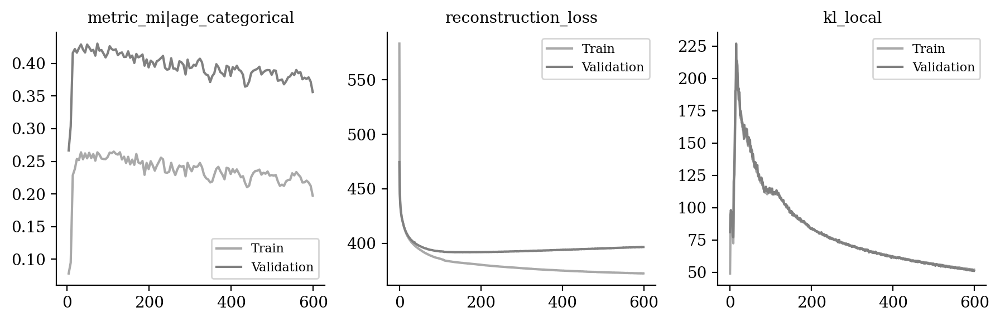

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

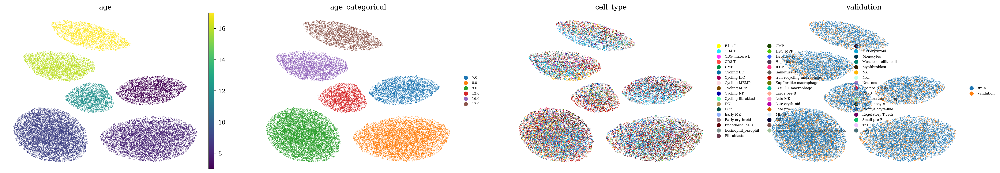

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

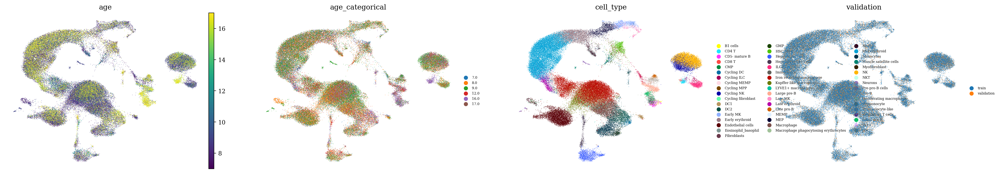

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

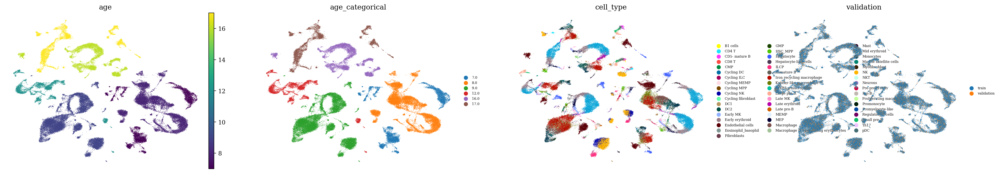

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )